## AI 모델 개발 15회차 1차 팀프로젝트 - NASA Turbofan Jet Engine Data Set 터보엔진 유지보전 문제_FD002

[데이터셋 개요]
이 데이터셋은 NASA의 C-MAPSS(Commercial Modular Aero-Propulsion System Simulation)
시뮬레이터를 사용하여 생성된 터보팬 엔진의 열화(Degradation) 데이터입니다.

데이터는 여러 개의 다변량 시계열(Multivariate Time Series)로 구성되어 있습니다.
데이터셋은 학습(Training) 세트와 테스트(Test) 세트로 나뉩니다.
각 시계열 데이터는 서로 다른 엔진(Unit)에서 얻은 데이터이며, 동일한 유형의 엔진들로 간주할 수 있습니다.

[실험 시나리오]
1. 초기 상태: 각 엔진은 정상 상태에서 작동을 시작합니다.
   - 단, 사용자에게는 알려지지 않은 수준의 초기 마모(Initial Wear)와 제조 공차(Variation)가 존재합니다.
     (이는 결함이 아닌 정상적인 범주입니다.)
2. 고장 진행: 어느 시점부터 결함(Fault)이 발생하여 시간이 지날수록 상태가 악화됩니다.
3. 데이터 범위:
   - 학습 세트 (Train): 결함 발생부터 시스템 고장(Failure) 시점까지의 모든 데이터가 포함됩니다.
   - 테스트 세트 (Test): 고장 발생 전 임의의 시점에서 데이터 기록이 중단됩니다.

[목표 (Objective)]
테스트 세트에 포함된 각 엔진의 **잔여 유효 수명(RUL: Remaining Useful Life)**을 예측하는 것입니다.
즉, 테스트 데이터가 끊긴 시점으로부터 엔진이 고장 날 때까지 몇 사이클(Cycle)이 더 남았는지 맞히는 것이 목표입니다.

> FD002 (Train: train_FD002.txt / Test: test_FD002.txt / RUL: RUL_FD002.txt)
   - 학습 엔진 수: 260개
   - 테스트 엔진 수: 259개
   - 운전 조건 (Conditions): 6가지 (다양한 고도, 속도, 부하 조건)
   - 고장 모드 (Fault Modes): 1가지 (HPC 열화)


> 버전 

Step 1. "과거의 흐름을 보여주는 파생변수(Lag Features)"를 추가 smoothing 대체
Step 2. "Multi-seed Ensemble"
Step 3. "Output Stabilization"

## 1. 라이브러리 및 데이터 로드

In [1]:
# 기본 라이브러리
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
import math
warnings.filterwarnings('ignore')

## 2. 데이터 불러오기

In [2]:
# kaggle에서 데이터 가져오기

%pip install kaggle==1.8.0

from dotenv import load_dotenv
load_dotenv()

!kaggle datasets download behrad3d/nasa-cmaps

Note: you may need to restart the kernel to use updated packages.
Dataset URL: https://www.kaggle.com/datasets/behrad3d/nasa-cmaps
License(s): CC0-1.0
nasa-cmaps.zip: Skipping, found more recently modified local copy (use --force to force download)


In [3]:
# 데이터 가져오기
import os
HOME = os.getcwd()
zipPath = os.path.join(HOME, "nasa-cmaps.zip")
targetPath = os.path.join(HOME, 'data')

from zipfile import ZipFile

with ZipFile(zipPath, 'r') as zip_ref:
    zip_ref.extractall(targetPath)


In [4]:
parent_path = "C:/Users/user/github/EST_15th_NASA/한지형/data/CMaps"

#FD_ID = "FD001" # Conditions: ONE (Sea Level), Fault Modes: ONE (HPC Degradation)
FD_ID = "FD002" # Conditions: SIX, Fault Modes: ONE (HPC Degradation)
#FD_ID = "FD003" # Conditions: ONE (Sea Level), Fault Modes: TWO (HPC Degradation, Fan Degradation)
#FD_ID = "FD004" # Conditions: SIX , Fault Modes: TWO (HPC Degradation, Fan Degradation)

train_path = os.path.join(parent_path, f"train_{FD_ID}.txt")
test_path  = os.path.join(parent_path, f"test_{FD_ID}.txt")
rul_path   = os.path.join(parent_path, f"RUL_{FD_ID}.txt")

print(f"Train path: {train_path}")

col_names = [
    "unit_number", "time_in_cycles",
    "op_setting_1", "op_setting_2", "op_setting_3"
] + [f"sensor_{i}" for i in range(1, 22)]

train_df = pd.read_csv(train_path, sep=r"\s+", header=None, names=col_names)
test_df = pd.read_csv(test_path, sep=r"\s+", header=None, names=col_names)
rul_df = pd.read_csv(rul_path, sep=r"\s+", header=None, names=["RUL"])


Train path: C:/Users/user/github/EST_15th_NASA/한지형/data/CMaps\train_FD002.txt


In [5]:
train_df.head()

,unit_number,time_in_cycles,op_setting_1,op_setting_2,op_setting_3,sensor_1,sensor_2,sensor_3,sensor_4,sensor_5,...,sensor_12,sensor_13,sensor_14,sensor_15,sensor_16,sensor_17,sensor_18,sensor_19,sensor_20,sensor_21
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,183.06,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,130.42,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,164.22,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,130.72,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,164.31,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286


## 3. Feature Engineering

In [6]:
rename_dict = {
    "op_setting_1": "Alt[kft]", # Altitude
    "op_setting_2": "Mn[-]", # Mach number
    "op_setting_3": "TLA[deg]", # Thrust lever angle (detent?)
    "sensor_1": "T2[R]",  # Total temperature at fan inlet 
    "sensor_2": "T24[R]", # Total temperature at LPC outlet
    "sensor_3": "T30[R]", # Total temperature at HPC outlet
    "sensor_4": "T50[R]", # Total temperature at LPT outlet
    "sensor_5": "P2[psi]", # Pressure at fan inlet
    "sensor_6": "P15[psi]", # Total pressure in bypass-duct
    "sensor_7": "P30[psi]", # Total pressure at HPC outlet
    "sensor_8": "Nf[rpm]", # Physical fan speed
    "sensor_9": "Nc[rpm]", # Physical core speed
    "sensor_10": "epr[-]", # Engine pressure ratio (P50/P2)
    "sensor_11": "phi[pph/psi]", # Ratio of fuel flow to Ps30, (not pps/psi, but pph/psi)
    "sensor_12": "Ps30[psi]", # Static pressure at HPC outlet
    "sensor_13": "NRf[rpm]", # Corrected fan speed
    "sensor_14": "NRc[rpm]", # Corrected core speed
    "sensor_15": "BPR[-]", # Bypass Ratio
    "sensor_16": "farB[-]", # Burner fuel-air ratio
    "sensor_17": "htBleed[]",# Bleed Enthalpy
    "sensor_18": "Nf_dmd[rpm]", # Demanded fan speed
    "sensor_19": "PCNfR_dmd[Pct]", # Demanded corrected fan speed
    "sensor_20": "W31[lbm/s]", # HPT coolant bleed
    "sensor_21": "W32[lbm/s]", # LPT coolant bleed
}


train_df = train_df.rename(columns=rename_dict)
test_df  = test_df.rename(columns=rename_dict)

def clean_round(series, ndigits=1, eps=1e-6):
    """Round values and force -0.0 to 0.0"""
    rounded = series.round(ndigits)
    rounded[rounded.abs() < eps] = 0
    return rounded

train_df['condition'] = (
    clean_round(train_df["Alt[kft]"], 0).astype(str) + '_' +
    clean_round(train_df["Mn[-]"], 1).astype(str) + '_' +
    clean_round(train_df["TLA[deg]"], 0).astype(str)
)

train_df.head()

,unit_number,time_in_cycles,Alt[kft],Mn[-],TLA[deg],T2[R],T24[R],T30[R],T50[R],P2[psi],...,NRf[rpm],NRc[rpm],BPR[-],farB[-],htBleed[],Nf_dmd[rpm],PCNfR_dmd[Pct],W31[lbm/s],W32[lbm/s],condition
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,2387.72,8048.56,9.3461,0.02,334,2223,100.00,14.73,8.8071,35.0_0.8_100.0
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,2387.66,8072.30,9.3774,0.02,330,2212,100.00,10.41,6.2665,42.0_0.8_100.0
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,2028.03,7864.87,10.8941,0.02,309,1915,84.93,14.08,8.6723,25.0_0.6_60.0
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,2387.61,8068.66,9.3528,0.02,329,2212,100.00,10.59,6.4701,42.0_0.8_100.0
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,2028.00,7861.23,10.8963,0.02,309,1915,84.93,14.13,8.5286,25.0_0.6_60.0


In [7]:
train_df["P50[psi]"] = train_df["epr[-]"]*train_df["P2[psi]"]

train_df["Fan.PR[-]"] = train_df["P15[psi]"]/train_df["P2[psi]"]
train_df["LPC.TR[-]"] = train_df["T24[R]"]/train_df["T2[R]"] # Fan core + LPC
train_df["HPC.TR[-]"] = train_df["T30[R]"]/train_df["T24[R]"]

train_df["OPR[-]"] = train_df["P30[psi]"]/train_df["P2[psi]"]

train_df["Wf[pph]"] = train_df["phi[pph/psi]"]*train_df["Ps30[psi]"]
train_df["Wa36[lbm/s]"] = train_df["Wf[pph]"]/3600.0 / train_df["farB[-]"]
train_df["W24[lbm/s]"] = train_df["Wa36[lbm/s]"] + train_df["W31[lbm/s]"] + train_df["W32[lbm/s]"] # core. htBleed ? 
train_df["W15[lbm/s]"] = train_df["W24[lbm/s]"]*train_df["BPR[-]"] # bypass
train_df["W2[lbm/s]"] = train_df["W15[lbm/s]"] + train_df["W24[lbm/s]"] # overall

train_df["WfP3C[pph/psi]"] = train_df["phi[pph/psi]"]/np.sqrt(train_df["T2[R]"]/518.67)

train_df.head()


,unit_number,time_in_cycles,Alt[kft],Mn[-],TLA[deg],T2[R],T24[R],T30[R],T50[R],P2[psi],...,Fan.PR[-],LPC.TR[-],HPC.TR[-],OPR[-],Wf[pph],Wa36[lbm/s],W24[lbm/s],W15[lbm/s],W2[lbm/s],WfP3C[pph/psi]
0,1,1,34.9983,0.8400,100.0,449.44,555.32,1358.61,1137.23,5.48,...,1.459854,1.235582,2.446535,35.518248,7692.1812,106.835850,130.372950,1218.478628,1348.851578,45.140436
1,1,2,41.9982,0.8408,100.0,445.00,549.90,1353.22,1125.78,3.91,...,1.460358,1.235730,2.460847,35.424552,5503.7240,76.440611,93.117111,873.196398,966.313509,45.559401
2,1,3,24.9988,0.6218,60.0,462.54,537.31,1256.76,1047.45,7.05,...,1.279433,1.161651,2.338985,24.923404,6025.2318,83.683775,106.436075,1159.525245,1265.961320,38.852470
3,1,4,42.0077,0.8416,100.0,445.00,549.51,1354.03,1126.38,3.91,...,1.460358,1.234854,2.464068,35.411765,5485.0112,76.180711,93.240811,872.062658,965.303469,45.300296
4,1,5,25.0005,0.6203,60.0,462.54,537.07,1257.71,1047.93,7.05,...,1.280851,1.161132,2.341799,24.829787,6061.3959,84.186054,106.844654,1164.211405,1271.056059,39.064257


In [8]:
# ---------------------------------------------------------
#  물리적 파생 변수 생성 함수
# ---------------------------------------------------------
def generate_derived_features(df):
    df_eng = df.copy()
    
    # 0으로 나누기 방지 (T2, farB 등)
    # T2가 0이면 518.67(Rankine 기준온도)로 대체
    t2_safe = df_eng['T2[R]'].replace(0, 518.67)
    farb_safe = df_eng['farB[-]'].replace(0, 0.0001) # 0이면 아주 작은 값

    # 1. 압력/온도 비율 (Pressure/Temp Ratios)
    df_eng["P50[psi]"] = df_eng["epr[-]"] * df_eng["P2[psi]"]
    df_eng["Fan.PR[-]"] = df_eng["P15[psi]"] / df_eng["P2[psi]"]
    df_eng["LPC.TR[-]"] = df_eng["T24[R]"] / t2_safe
    df_eng["HPC.TR[-]"] = df_eng["T30[R]"] / df_eng["T24[R]"]
    df_eng["OPR[-]"] = df_eng["P30[psi]"] / df_eng["P2[psi]"]

    # 2. 유량 계산 (Mass Flow Rates)
    # Wf = phi * Ps30
    df_eng["Wf[pph]"] = df_eng["phi[pph/psi]"] * df_eng["Ps30[psi]"]
    
    # Wa36 (Core airflow)
    df_eng["Wa36[lbm/s]"] = df_eng["Wf[pph]"] / 3600.0 / farb_safe
    
    # W24 (LPC outlet flow) = Core + Coolant Bleeds
    df_eng["W24[lbm/s]"] = df_eng["Wa36[lbm/s]"] + df_eng["W31[lbm/s]"] + df_eng["W32[lbm/s]"]
    
    # W15 (Bypass flow) = Core * BPR
    df_eng["W15[lbm/s]"] = df_eng["W24[lbm/s]"] * df_eng["BPR[-]"]
    
    # W2 (Total Fan Inlet flow)
    df_eng["W2[lbm/s]"] = df_eng["W15[lbm/s]"] + df_eng["W24[lbm/s]"]

    # 3. 보정된 연료 흐름 (Corrected Fuel Flow)
    df_eng["WfP3C[pph/psi]"] = df_eng["phi[pph/psi]"] / np.sqrt(t2_safe / 518.67)
    
    return df_eng

# ---------------------------------------------------------
# 🔥 실행: Train과 Test 모두 적용!
# ---------------------------------------------------------
print("🔧 파생 변수 생성 중...")
train_df = generate_derived_features(train_df)
test_df = generate_derived_features(test_df) # ★ Test에도 꼭 적용해야 함

print(f"✅ 생성 완료! 'P50[psi]' 존재 여부: {'P50[psi]' in train_df.columns}")

🔧 파생 변수 생성 중...
✅ 생성 완료! 'P50[psi]' 존재 여부: True


### 컬럼 설명 (Data Dictionary)

| 컬럼명 | 설명 | 타입 |
|---|---|---|
| **unit_number** | 엔진 고유 식별자 (Unit Number) | int64 |
| **time_in_cycles** | 운전 사이클 (Time in Cycles) | int64 |
| **Alt[kft]** | 고도 (Altitude) | float64 |
| **Mn[-]** | 마하 수 (Mach Number) | float64 |
| **TLA[deg]** | 스로틀 레버 각도 (Thrust Lever Angle) | float64 |
| **T2[R]** | 팬 입구 전온도 (Total temperature at fan inlet) | float64 |
| **T24[R]** | LPC 출구 전온도 (Total temperature at LPC outlet) | float64 |
| **T30[R]** | HPC 출구 전온도 (Total temperature at HPC outlet) | float64 |
| **T50[R]** | LPT 출구 전온도 (Total temperature at LPT outlet) | float64 |
| **P2[psi]** | 팬 입구 압력 (Pressure at fan inlet) | float64 |
| **P15[psi]** | 바이패스 덕트 전압력 (Total pressure in bypass-duct) | float64 |
| **P30[psi]** | HPC 출구 전압력 (Total pressure at HPC outlet) | float64 |
| **Nf[rpm]** | 물리적 팬 속도 (Physical fan speed) | float64 |
| **Nc[rpm]** | 물리적 코어 속도 (Physical core speed) | float64 |
| **epr[-]** | 엔진 압력비 (Engine pressure ratio) | float64 |
| **phi[pph/psi]** | 연료 유량 대 Ps30 비율 (Ratio of fuel flow to Ps30) | float64 |
| **Ps30[psi]** | HPC 출구 정압 (Static pressure at HPC outlet) | float64 |
| **NRf[rpm]** | 보정된 팬 속도 (Corrected fan speed) | float64 |
| **NRc[rpm]** | 보정된 코어 속도 (Corrected core speed) | float64 |
| **BPR[-]** | 바이패스 비 (Bypass Ratio) | float64 |
| **farB[-]** | 연소기 연료-공기 비 (Burner fuel-air ratio) | float64 |
| **htBleed[]** | 블리드 엔탈피 (Bleed Enthalpy) | int64 |
| **Nf_dmd[rpm]** | 요구 팬 속도 (Demanded fan speed) | int64 |
| **PCNfR_dmd[Pct]** | 요구 보정 팬 속도 (Demanded corrected fan speed) | float64 |
| **W31[lbm/s]** | HPT 냉각 블리드 (HPT coolant bleed) | float64 |
| **W32[lbm/s]** | LPT 냉각 블리드 (LPT coolant bleed) | float64 |
| **condition** | 운전 조건 문자열 (Operational Condition String) | object |
| **P50[psi]** | LPT 출구 전압력 (Total pressure at LPT outlet) | float64 |
| **Fan.PR[-]** | 팬 압력비 (Fan pressure ratio) | float64 |
| **LPC.TR[-]** | LPC 전온도비 (LPC total temperature ratio) | float64 |
| **HPC.TR[-]** | HPC 전온도비 (HPC total temperature ratio) | float64 |
| **OPR[-]** | 전체 압력비 (Overall pressure ratio) | float64 |
| **Wf[pph]** | 연료 유량 (Fuel flow) | float64 |
| **Wa36[lbm/s]** | 코어 공기 유량 (Core airflow) | float64 |
| **W24[lbm/s]** | LPC 공기 유량 (LPC airflow) | float64 |
| **W15[lbm/s]** | 바이패스 공기 유량 (Bypass airflow) | float64 |
| **W2[lbm/s]** | 팬 유입 공기 유량 (Fan inlet airflow) | float64 |
| **WfP3C[pph/psi]** | P3 압력 대비 연료 유량 (Fuel flow to P3 pressure ratio) | float64 |
| **RUL** | 엔진의 남은 수명 (Remaining Useful Life) | int64 |

In [9]:
train_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 53759 entries, 0 to 53758
Data columns (total 38 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   unit_number     53759 non-null  int64  
 1   time_in_cycles  53759 non-null  int64  
 2   Alt[kft]        53759 non-null  float64
 3   Mn[-]           53759 non-null  float64
 4   TLA[deg]        53759 non-null  float64
 5   T2[R]           53759 non-null  float64
 6   T24[R]          53759 non-null  float64
 7   T30[R]          53759 non-null  float64
 8   T50[R]          53759 non-null  float64
 9   P2[psi]         53759 non-null  float64
 10  P15[psi]        53759 non-null  float64
 11  P30[psi]        53759 non-null  float64
 12  Nf[rpm]         53759 non-null  float64
 13  Nc[rpm]         53759 non-null  float64
 14  epr[-]          53759 non-null  float64
 15  phi[pph/psi]    53759 non-null  float64
 16  Ps30[psi]       53759 non-null  float64
 17  NRf[rpm]        53759 non-null 

In [10]:
pd.set_option('display.max_rows', None)
summary_df = pd.DataFrame(train_df.dtypes, columns=['Data Type'])
summary_df = summary_df.reset_index()
summary_df = summary_df.rename(columns={'index': 'Column Name'})
summary_df['Non-Null Count'] = train_df.count().values
summary_df['Null Count'] = train_df.isnull().sum().values
summary_df['Null Ratio (%)'] = (train_df.isnull().sum().values / len(train_df)) * 100
summary_df


,Column Name,Data Type,Non-Null Count,Null Count,Null Ratio (%)
0,unit_number,int64,53759,0,0.0
1,time_in_cycles,int64,53759,0,0.0
2,Alt[kft],float64,53759,0,0.0
3,Mn[-],float64,53759,0,0.0
4,TLA[deg],float64,53759,0,0.0
5,T2[R],float64,53759,0,0.0
6,T24[R],float64,53759,0,0.0
7,T30[R],float64,53759,0,0.0
8,T50[R],float64,53759,0,0.0
9,P2[psi],float64,53759,0,0.0


### 정규화 / 이상치 처리
* FD002는 FD001과 다르게 운전 조건이 단일 조건이 아니기 때문에 고도와 속도가 변한다.
1. 따라서 데이터를 여러 그룹(클러스터)로 나눠 (고도(Altitude), 마하수(Mach Number), 스로틀(TRA) 조합에 따라 총 6가지 운전 모드로 클러스터링) 
2. 클러스터링 과정에서 생성되는 cluster 컬럼을 one-hot encoding으로 클러스터 분간용도로 변환.
3. 그룹별로 정규화를 하고 (Z-score) (고도나 속도 마다 온도 등 센서 수치가 다르기 때문에 이 차이를 없애기 위해 정규화) (trand 분리화) + Mode_ID를 포함한 조건부 정규화를 추가한다.
4. z-score가 ±3을 벗어나는 이상치를 clipping 한다.
5. 정규화된 데이터를 다시 합쳐 모델에 넣는다.

* 기존에 운전조건으로만 6구간을 나눠 정규화한 데이터를 사용한 결과 아래 그림과 같이 산점도에서 farB[-]의 이봉 분포(두 줄로 갈라지는 현상)에 의해 farB[-]에서 파생된 W15, W24, W2, Wa36 에도 cluster 1 데이터가 직선형으로 혼재
* 이 문제를 해결하기 위해 one-hot encoding + farB의 cluster1 데이터를 이봉 분포 기준에 따라 mode_ID (0,1)로 condition_id하는 기준을 추가한다.
* 노이즈 제거는 과정에서 컬럼이 매우 많이 파생되므로 EDA, feature selection 이후에 진행한다.

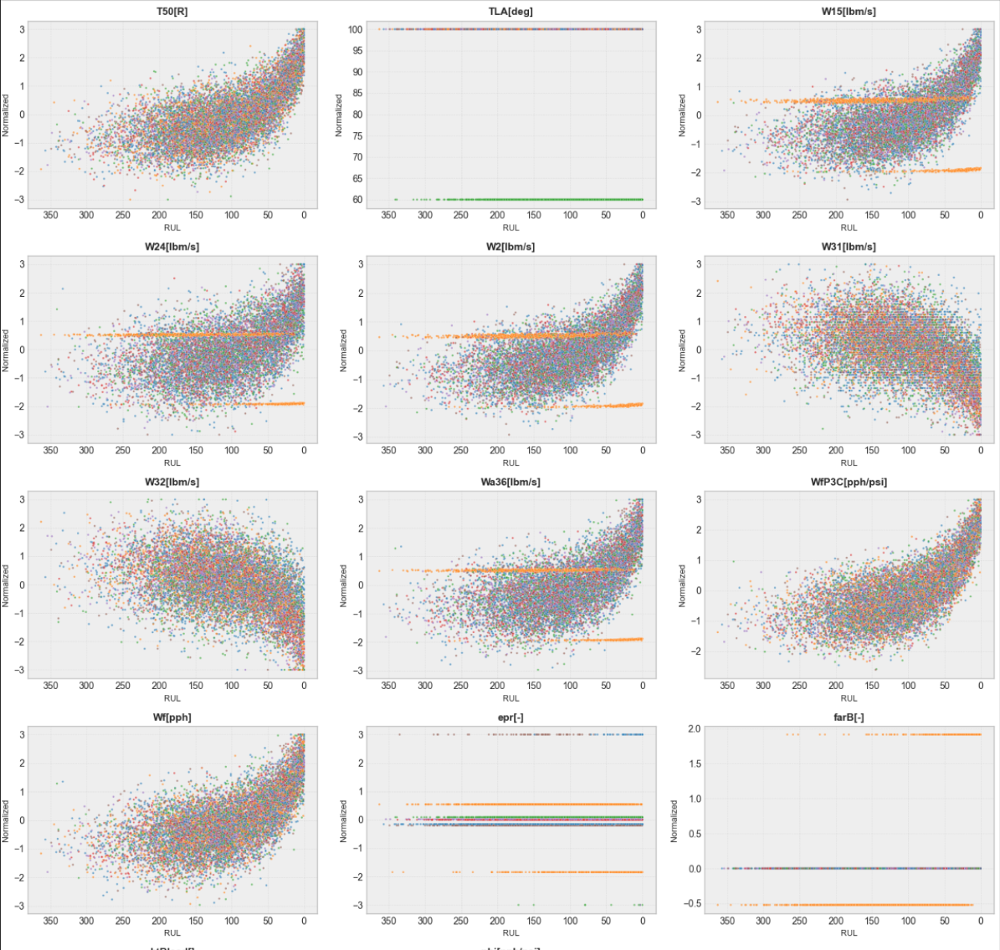

이번 버전에서는 hard clustering으로 진행

In [11]:
# ---------------------------------------------------------
# [필수 정의] 정규화할 모든 센서 (원본 + 파생) 리스트
# ---------------------------------------------------------

# 1. 원본 센서 (Physical Name)
RAW_SENSORS = [
    'T2[R]', 'T24[R]', 'T30[R]', 'T50[R]', 'P2[psi]', 'P15[psi]', 'P30[psi]',
    'Nf[rpm]', 'Nc[rpm]', 'epr[-]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]',
    'NRc[rpm]', 'BPR[-]', 'farB[-]', 'htBleed[]', 'Nf_dmd[rpm]',
    'PCNfR_dmd[Pct]', 'W31[lbm/s]', 'W32[lbm/s]'
]

# 2. 파생 변수 (Derived Features) -
DERIVED_SENSORS = [
    "P50[psi]", 
    "Fan.PR[-]", 
    "LPC.TR[-]", 
    "HPC.TR[-]", 
    "OPR[-]", 
    "Wf[pph]", 
    "Wa36[lbm/s]", 
    "W24[lbm/s]", 
    "W15[lbm/s]", 
    "W2[lbm/s]", 
    "WfP3C[pph/psi]"
]

# 3. 합치기 (최종 정규화 대상)
# 주의: 이 리스트에 있는 컬럼들이 DataFrame에 실제로 존재해야 합니다.
# (파생변수 생성 코드를 먼저 실행했는지 꼭 확인하세요!)
SENSOR_FEATURES = RAW_SENSORS + DERIVED_SENSORS

# 안전장치: 실제 train_df에 존재하는 컬럼만 남기기
# (혹시 파생변수 생성을 아직 안 했다면 여기서 걸러집니다)
existing_cols = set(train_df.columns)
SENSOR_FEATURES = [col for col in SENSOR_FEATURES if col in existing_cols]

print(f"✅ SENSOR_FEATURES 정의 완료! (총 {len(SENSOR_FEATURES)}개)")
print(f"   - 원본: {len([c for c in SENSOR_FEATURES if c in RAW_SENSORS])}개")
print(f"   - 파생: {len([c for c in SENSOR_FEATURES if c in DERIVED_SENSORS])}개")

# 만약 파생변수가 0개로 나오면, 파생변수 만드는 코드를 먼저 실행해야 함을 알림
if len([c for c in SENSOR_FEATURES if c in DERIVED_SENSORS]) == 0:
    print("⚠️ 경고: 파생 변수가 감지되지 않았습니다. 'Step 2'의 파생변수 생성 코드를 먼저 실행해주세요!")

✅ SENSOR_FEATURES 정의 완료! (총 32개)
   - 원본: 21개
   - 파생: 11개


* 이번 버전에서는 이봉분포 분리 mode_id 조건부 정규화를 모든 클러스터에 적용 (클러스터 2에서도 이봉붙포 확인 때문에) 클러스터 2의 이봉분포는 매우 차이가 적어 한정으로 강제지정      
"Cluster 2는 무조건 2개로 쪼개라 (c_id == 2)"**라고 코드를 박아버렸습니다.     
다른 클러스터에도 문제가 있었다. 여기도 이봉분포 존재. 이봉분포는 고도 등 운전조건에 따라 다르게 작동하는 밸브등의 작동조건때문이다.

In [12]:
# ---------------------------------------------------------
# [Step 3 최종 완결] C2, C3(farB) & C6(T24) 동시 분할
# ---------------------------------------------------------
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

# 센서 리스트 (변함 없음)
RAW_SENSORS = [
    'T2[R]', 'T24[R]', 'T30[R]', 'T50[R]', 'P2[psi]', 'P15[psi]', 'P30[psi]',
    'Nf[rpm]', 'Nc[rpm]', 'epr[-]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]',
    'NRc[rpm]', 'BPR[-]', 'farB[-]', 'htBleed[]', 'Nf_dmd[rpm]',
    'PCNfR_dmd[Pct]', 'W31[lbm/s]', 'W32[lbm/s]'
]
DERIVED_SENSORS = [
    "P50[psi]", "Fan.PR[-]", "LPC.TR[-]", "HPC.TR[-]", "OPR[-]", 
    "Wf[pph]", "Wa36[lbm/s]", "W24[lbm/s]", "W15[lbm/s]", "W2[lbm/s]", "WfP3C[pph/psi]"
]
SENSOR_FEATURES = RAW_SENSORS + DERIVED_SENSORS
SENSOR_FEATURES = [col for col in SENSOR_FEATURES if col in train_df.columns]

def step3_advanced_preprocessing(train, test, sensor_cols):
    print("🚀 [Step 3] Advanced Preprocessing (Targeted Split: C2, C3 & C6) 시작...")
    
    # 1. Hard Clustering
    def assign_hard_cluster(df):
        df_c = df.copy()
        # 컬럼명 대응
        if 'Alt[kft]' in df_c.columns:
            df_c['r_alt'] = df_c['Alt[kft]'].round(-1)
            df_c['r_mach'] = df_c['Mn[-]'].round(2)
            df_c['r_tra'] = df_c['TLA[deg]'].round(0)
        else:
            df_c['r_alt'] = df_c['op_setting_1'].round(-1)
            df_c['r_mach'] = df_c['op_setting_2'].round(2)
            df_c['r_tra'] = df_c['op_setting_3'].round(0)
            
        df_c['cond_str'] = (df_c['r_alt'].astype(str) + "_" + 
                            df_c['r_mach'].astype(str) + "_" + 
                            df_c['r_tra'].astype(str))
        return df_c

    train = assign_hard_cluster(train)
    test = assign_hard_cluster(test)
    
    conditions = sorted(train['cond_str'].unique())
    cond_map = {c: i for i, c in enumerate(conditions)}
    
    train['cluster'] = train['cond_str'].map(cond_map)
    test['cluster'] = test['cond_str'].map(cond_map)
    print(f"✅ Hard Clustering 완료")

    # =========================================================
    # 2. Multi-Mode ID 생성 (타겟별 맞춤 분할)
    # =========================================================
    train['Mode_ID'] = 0
    test['Mode_ID'] = 0
    
    unique_clusters = sorted(train['cluster'].unique())
    print(f"\n🕵️ 이봉분포 정밀 타격 시작")

    for c_id in unique_clusters:
        mask_tr = (train['cluster'] == c_id)
        mask_te = (test['cluster'] == c_id)
        
        # -----------------------------------------------------
        # [Case A] Cluster 2 & 3: farB 기준 분할 (★수정됨★)
        # -----------------------------------------------------
        # 기존에는 2번만 있었으나, 3번도 farB 이봉분포이므로 리스트에 추가함
        if c_id in [2, 3]:
            target_col = 'farB[-]'
            print(f"  [Cluster {c_id}] 'farB[-]' 기준으로 강제 분할 시도...", end=" ")
            if target_col in train.columns:
                vals = train.loc[mask_tr, target_col].values
                # 강제 KMeans (2개)
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels = km.fit_predict(vals.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                
                # 정렬 (0: Low, 1: High)
                if centers[1] < centers[0]: labels = 1 - labels
                train.loc[mask_tr, 'Mode_ID'] = labels
                
                # Test 적용
                if mask_te.sum() > 0:
                    vals_te = test.loc[mask_te, [target_col]].values
                    pred_te = km.predict(vals_te)
                    if centers[1] < centers[0]: pred_te = 1 - pred_te
                    test.loc[mask_te, 'Mode_ID'] = pred_te
                print("👉 완료 (Mode 0/1)")
                
        # -----------------------------------------------------
        # [Case B] Cluster 6: T24 기준 분할 (유지)
        # -----------------------------------------------------
        elif c_id == 6:
            target_col = 'T24[R]' 
            print(f"  [Cluster {c_id}] 'T24[R]' 기준으로 강제 분할 시도...", end=" ")
            if target_col in train.columns:
                vals = train.loc[mask_tr, target_col].values
                # 강제 KMeans (2개)
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels = km.fit_predict(vals.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                
                # 정렬
                if centers[1] < centers[0]: labels = 1 - labels
                train.loc[mask_tr, 'Mode_ID'] = labels
                
                # Test 적용
                if mask_te.sum() > 0:
                    vals_te = test.loc[mask_te, [target_col]].values
                    pred_te = km.predict(vals_te)
                    if centers[1] < centers[0]: pred_te = 1 - pred_te
                    test.loc[mask_te, 'Mode_ID'] = pred_te
                print("👉 완료 (Mode 0/1)")
        
        else:
            # 나머지 클러스터(0, 1, 4, 5)는 단일 모드로 처리
            pass

    # 3. 조건별 정규화 (0분산 처리 유지)
    train['condition_id'] = train['cluster'] * 10 + train['Mode_ID']
    test['condition_id'] = test['cluster'] * 10 + test['Mode_ID']
    
    print(f"📊 Final Condition IDs: {sorted(train['condition_id'].unique())}")
    
    stats = train.groupby('condition_id')[sensor_cols].agg(['mean', 'std'])
    
    train_norm = train.copy()
    test_norm = test.copy()
    
    for col in sensor_cols:
        means = train['condition_id'].map(stats[col]['mean'])
        stds = train['condition_id'].map(stats[col]['std'])
        
        test_means = test['condition_id'].map(stats[col]['mean'])
        test_stds = test['condition_id'].map(stats[col]['std'])
        
        test_means.fillna(train[col].mean(), inplace=True)
        test_stds.fillna(train[col].std(), inplace=True)
        stds.fillna(1, inplace=True)

        # 0분산 처리 (매우 중요)
        is_constant_tr = stds < 1e-9
        is_constant_te = test_stds < 1e-9
        
        train_norm[col] = (train[col] - means) / (stds + 1e-9)
        test_norm[col] = (test[col] - test_means) / (test_stds + 1e-9)
        
        train_norm.loc[is_constant_tr, col] = 0.0
        test_norm.loc[is_constant_te, col] = 0.0
        
        train_norm[col] = train_norm[col].clip(-4, 4)
        test_norm[col] = test_norm[col].clip(-4, 4)

    # 4. One-Hot
    cluster_oh_tr = pd.get_dummies(train_norm['cluster'], prefix='cluster', dtype=int)
    train_norm = pd.concat([train_norm, cluster_oh_tr], axis=1)
    
    cluster_oh_te = pd.get_dummies(test_norm['cluster'], prefix='cluster', dtype=int)
    cluster_oh_te = cluster_oh_te.reindex(columns=cluster_oh_tr.columns, fill_value=0)
    test_norm = pd.concat([test_norm, cluster_oh_te], axis=1)
    
    return train_norm, test_norm, stats

# 실행
train_norm, test_norm, train_stats = step3_advanced_preprocessing(train_df, test_df, SENSOR_FEATURES)

🚀 [Step 3] Advanced Preprocessing (Targeted Split: C2, C3 & C6) 시작...
✅ Hard Clustering 완료

🕵️ 이봉분포 정밀 타격 시작
  [Cluster 2] 'farB[-]' 기준으로 강제 분할 시도... 

Exception in thread Thread-8 (_readerthread):
Traceback (most recent call last):
  File "c:\Users\user\miniconda3\envs\DS\Lib\threading.py", line 1045, in _bootstrap_inner
    self.run()
  File "c:\Users\user\miniconda3\envs\DS\Lib\threading.py", line 982, in run
    self._target(*self._args, **self._kwargs)
  File "c:\Users\user\miniconda3\envs\DS\Lib\subprocess.py", line 1599, in _readerthread
    buffer.append(fh.read())
                  ^^^^^^^^^
  File "<frozen codecs>", line 322, in decode
UnicodeDecodeError: 'utf-8' codec can't decode byte 0xc0 in position 4: invalid start byte


👉 완료 (Mode 0/1)
  [Cluster 3] 'farB[-]' 기준으로 강제 분할 시도... 👉 완료 (Mode 0/1)
  [Cluster 6] 'T24[R]' 기준으로 강제 분할 시도... 👉 완료 (Mode 0/1)
📊 Final Condition IDs: [np.int64(0), np.int64(10), np.int64(20), np.int64(30), np.int64(31), np.int64(40), np.int64(50), np.int64(60), np.int64(61)]


In [13]:
# 1. 각 클러스터별 설정(Setting) 값의 평균 확인
# (train_norm에는 cluster 컬럼과 원본 설정값이 모두 들어있습니다)
cluster_profile = train_norm.groupby('cluster')[['Alt[kft]', 'Mn[-]', 'TLA[deg]']].mean()
cluster_count = train_norm['cluster'].value_counts()

# 2. 보기 좋게 정렬 및 병합 (개수 포함)
cluster_profile['count'] = cluster_count

# 고도(Alt) 순서대로 정렬해서 출력 (물리적 의미 파악 용이)
print("📊 Cluster Profile (Operating Conditions):")
print(cluster_profile.sort_values('Alt[kft]'))

📊 Cluster Profile (Operating Conditions):
          Alt[kft]     Mn[-]  TLA[deg]  count
cluster                                      
0         0.001505  0.000494     100.0   8044
1        10.002971  0.250495     100.0   8096
3        20.002999  0.700515     100.0   8122
2        24.999024  0.620512      60.0   1606
4        25.004046  0.620499      60.0   6396
5        34.998963  0.840512     100.0   1508
6        39.716672  0.840489     100.0  19987


* 클러스터링 시각화

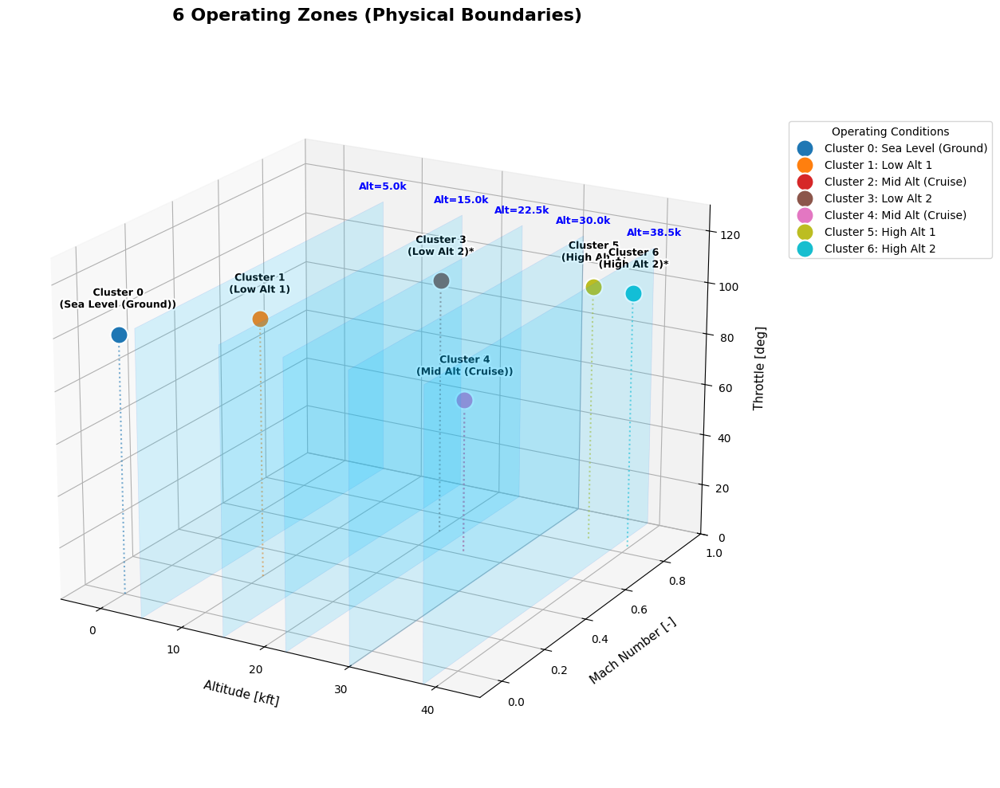


 [Operating Zones & Boundaries Table]
Zone   | Cluster  | Altitude Range [kft]           | Description
------------------------------------------------------------------------------------------
 1     | 0        | Alt < 5.0 (Ground)             | Sea Level (Ground)
 2     | 1        | 5.0 < Alt < 15.0               | Low Alt 1
 3     | 3        | 15.0 < Alt < 22.5              | Low Alt 2
 4     | 2        | 22.5 < Alt < 30.0              | Mid Alt (Cruise)
 5     | 4        | 30.0 < Alt < 38.5              | Mid Alt (Cruise)
 6     | 5        | 38.5 < Alt < inf               | High Alt 1


In [14]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as pe # 텍스트 테두리 효과
import numpy as np
import pandas as pd
from mpl_toolkits.mplot3d.art3d import Poly3DCollection

# ---------------------------------------------------------
# 1. 데이터 준비 및 물리적 조건 매핑
# ---------------------------------------------------------
if 'train_df' in globals() and 'train_norm' in globals():
    # 데이터 병합
    target_df = train_df[['Alt[kft]', 'Mn[-]', 'TLA[deg]']].copy()
    target_df['cluster'] = train_norm['cluster'].values
    
    # Centroid 계산
    df_centroids = target_df.groupby('cluster')[['Alt[kft]', 'Mn[-]', 'TLA[deg]']].mean().reset_index()

    # 설명 매핑 함수
    def get_description(alt):
        if alt < 5.0: return "Sea Level (Ground)"
        elif alt < 15.0: return "Low Alt 1"
        elif alt < 22.5: return "Low Alt 2"
        elif alt < 30.0: return "Mid Alt (Cruise)"
        elif alt < 38.5: return "High Alt 1"
        else: return "High Alt 2"

    df_centroids['Desc'] = df_centroids['Alt[kft]'].apply(get_description)
    
else:
    print("⚠️ 데이터가 없습니다.")
    df_centroids = pd.DataFrame()

# ---------------------------------------------------------
# 2. 3D 시각화 설정
# ---------------------------------------------------------
fig = plt.figure(figsize=(16, 10))
ax = fig.add_subplot(111, projection='3d')

y_min, y_max = -0.1, 1.0
z_min, z_max = 0, 110

# (1) 경계벽 (투명 하늘색 복구)
boundaries = [5.0, 15.0, 22.5, 30.0, 38.5]
for x_pos in boundaries:
    # 벽 그리기
    verts = [[(x_pos, y_min, z_min), (x_pos, y_max, z_min), (x_pos, y_max, z_max), (x_pos, y_min, z_max)]]
    
    # ★ 요청하신 스타일: 투명 하늘색 (alpha=0.15로 낮춰서 뒤에 점이 보이게 함)
    wall = Poly3DCollection(verts, alpha=0.15, facecolor='deepskyblue', edgecolor='royalblue', linewidth=0.5)
    ax.add_collection3d(wall)
    
    # 벽 위에 고도 정보 표시
    ax.text(x_pos, y_max, z_max + 5, f"Alt={x_pos}k", color='blue', fontsize=9, ha='center', fontweight='bold')

# (2) 중심점 및 상세 라벨
colors = plt.cm.get_cmap('tab10', len(df_centroids))

for i, row in df_centroids.iterrows():
    c_id = int(row['cluster'])
    
    # 점 그리기 (depthshade=False: 거리 상관없이 쨍한 색상 유지)
    ax.scatter(row['Alt[kft]'], row['Mn[-]'], row['TLA[deg]'], 
               color=colors(i), s=250, edgecolor='white', linewidth=1.5, alpha=1.0, 
               depthshade=False,
               label=f"Cluster {c_id}: {row['Desc']}") 
    
    # 텍스트 내용 구성 (Cluster + Description)
    label_text = f"Cluster {c_id}\n({row['Desc']})"
    
    # Multi-mode 표시
    if 'Mode_ID' in train_norm.columns:
        n_modes = train_norm[train_norm['cluster'] == c_id]['Mode_ID'].nunique()
        if n_modes > 1: label_text += "*"

    # ★ 텍스트 그리기 (Outline 효과 적용)
    # 점을 가리는 박스(bbox) 대신, 글자 테두리(stroke)를 줘서 점이 보이게 함
    txt = ax.text(row['Alt[kft]'], row['Mn[-]'], row['TLA[deg]'] + 10, 
                  label_text, 
                  color='black', fontsize=9, fontweight='bold', ha='center')
    
    # 하얀색 테두리 적용 (가독성 확보 + 투명 효과)
    txt.set_path_effects([pe.withStroke(linewidth=3, foreground='white')])
    
    # 바닥 투영선
    ax.plot([row['Alt[kft]'], row['Alt[kft]']], [row['Mn[-]'], row['Mn[-]']], [0, row['TLA[deg]']], 
            color=colors(i), linestyle=':', alpha=0.6)

# ---------------------------------------------------------
# 3. 꾸미기
# ---------------------------------------------------------
ax.set_xlabel('Altitude [kft]', fontsize=11, labelpad=10)
ax.set_ylabel('Mach Number [-]', fontsize=11, labelpad=10)
ax.set_zlabel('Throttle [deg]', fontsize=11, labelpad=10)
ax.set_title("6 Operating Zones (Physical Boundaries)", fontsize=16, fontweight='bold', pad=20)

ax.set_xlim(-5, 45)
ax.set_ylim(y_min, y_max)
ax.set_zlim(0, 130) # 텍스트 공간 확보

# 시점 조정 (C2가 잘 보이는 각도)
ax.view_init(elev=20, azim=-60)

# 범례 표시
plt.legend(bbox_to_anchor=(1.05, 0.9), loc='upper left', title="Operating Conditions")
plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 4. 구간 정의표 출력
# ---------------------------------------------------------
print("\n [Operating Zones & Boundaries Table]")
print("=" * 90)
print(f"{'Zone':<6} | {'Cluster':<8} | {'Altitude Range [kft]':<30} | {'Description'}")
print("-" * 90)

# 고도 순 정렬
df_sorted = df_centroids.sort_values('Alt[kft]')
boundary_pairs = zip([-np.inf] + boundaries, boundaries + [np.inf])

for i, (row, (low, high)) in enumerate(zip(df_sorted.iterrows(), boundary_pairs)):
    _, data = row
    
    # 범위 문자열
    if i == 0: range_str = f"Alt < {boundaries[0]} (Ground)"
    elif i == len(df_centroids)-1: range_str = f"Alt > {boundaries[-1]} (High Alt)"
    else: range_str = f"{low} < Alt < {high}"
    
    print(f" {i+1:<5} | {int(data['cluster']):<8} | {range_str:<30} | {data['Desc']}")
print("=" * 90)

In [15]:
def add_rul(df):
    """각 엔진별 RUL(잔여 수명) 계산"""
    max_cycles = df.groupby('unit_number')['time_in_cycles'].max()
    df = df.merge(max_cycles.to_frame(name='max_cycle'), 
                  left_on='unit_number', right_index=True)
    df['RUL'] = df['max_cycle'] - df['time_in_cycles']
    df.drop('max_cycle', axis=1, inplace=True)
    return df
# train_df에 RUL 추가
train_df = add_rul(train_df)
print(f"✅ RUL 컬럼 추가 완료!")
print(train_df[['unit_number', 'time_in_cycles', 'RUL']].head(10))

✅ RUL 컬럼 추가 완료!
   unit_number  time_in_cycles  RUL
0            1               1  148
1            1               2  147
2            1               3  146
3            1               4  145
4            1               5  144
5            1               6  143
6            1               7  142
7            1               8  141
8            1               9  140
9            1              10  139


* 작업 전후 비교 전에 추세가 확실한 컬럼 3개 찾기

✅ train_norm 데이터 준비 완료! (컬럼 수: 53)

🏆 RUL과 가장 강력한 추세를 가진 Top 3 센서 (Normalized):
WfP3C[pph/psi]    0.654565
phi[pph/psi]      0.654565
W15[lbm/s]        0.633834
Name: RUL, dtype: float64


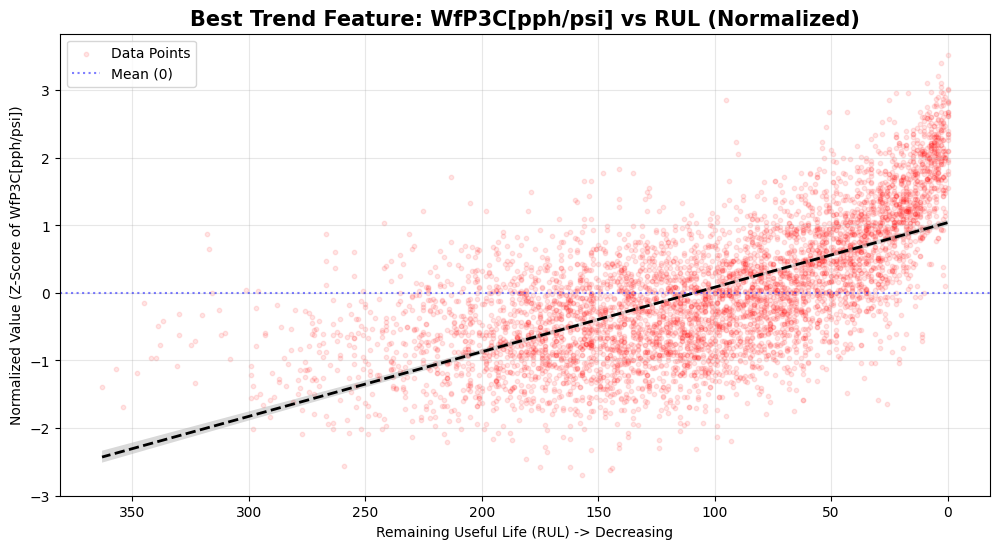

In [16]:
# RUL 컬럼이 없다면 이식
if 'RUL' not in train_norm.columns:
    train_norm['RUL'] = train_df['RUL']

print(f"✅ train_norm 데이터 준비 완료! (컬럼 수: {train_norm.shape[1]})")

# ---------------------------------------------------------
# 1. 어떤 센서가 RUL과 가장 관련이 깊을까? (상관관계 분석)
# ---------------------------------------------------------
# 분석 대상: 정규화된 'train_norm'
# 클러스터링 관련 컬럼 제외하고 순수 센서만 선택
features = [c for c in train_norm.columns if ('sensor' in c or '[' in c) 
            and c not in ['RUL', 'unit_number', 'time_in_cycles', 'cluster', 'Alt[kft]', 'Mn[-]', 'TLA[deg]']]

# 상관관계 계산
correlations = train_norm[features + ['RUL']].corr()['RUL'].drop('RUL')
top_features = correlations.abs().sort_values(ascending=False).head(3)

print("\n🏆 RUL과 가장 강력한 추세를 가진 Top 3 센서 (Normalized):")
print(top_features)

# ---------------------------------------------------------
# 2. Top 1 센서의 "진짜 추세" 시각화
# ---------------------------------------------------------
if len(top_features) > 0:
    best_sensor = top_features.index[0] # 1등 센서 이름

    # 데이터 샘플링 (속도 향상)
    sample_df = train_norm.sample(frac=0.1, random_state=42)

    plt.figure(figsize=(12, 6))
    
    # 산점도 그리기
    plt.scatter(sample_df['RUL'], sample_df[best_sensor], 
                alpha=0.1, s=10, c='red', label='Data Points')

    # 추세선 (Trend Line) 추가
    sns.regplot(data=sample_df, x='RUL', y=best_sensor, scatter=False, 
                color='black', line_kws={'linestyle':'--', 'linewidth':2})

    plt.gca().invert_xaxis() # X축 반전: 오른쪽(0)이 고장 시점
    plt.title(f"Best Trend Feature: {best_sensor} vs RUL (Normalized)", fontsize=15, fontweight='bold')
    plt.xlabel("Remaining Useful Life (RUL) -> Decreasing")
    plt.ylabel(f"Normalized Value (Z-Score of {best_sensor})")
    plt.axhline(0, color='blue', linestyle=':', alpha=0.5, label='Mean (0)') # 평균선
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()
else:
    print("❌ 상관관계를 계산할 센서 컬럼을 찾지 못했습니다.")

* 클러스터링 전후 시각화 비교

📊 Drawing Trajectory for 2 - WfP3C[pph/psi]


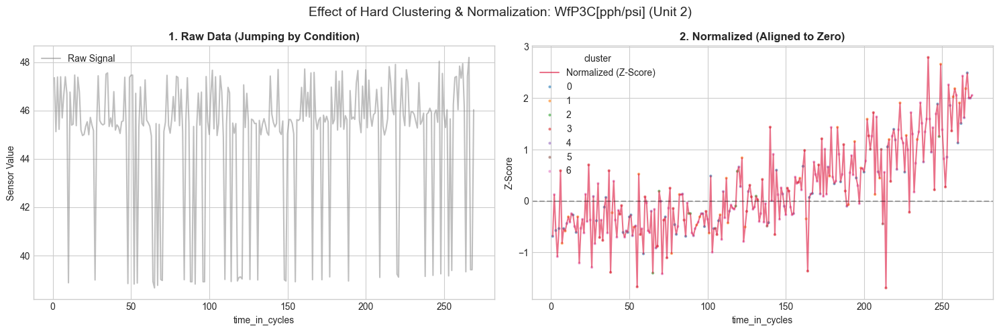

🌍 Global Quality Check for WfP3C[pph/psi]


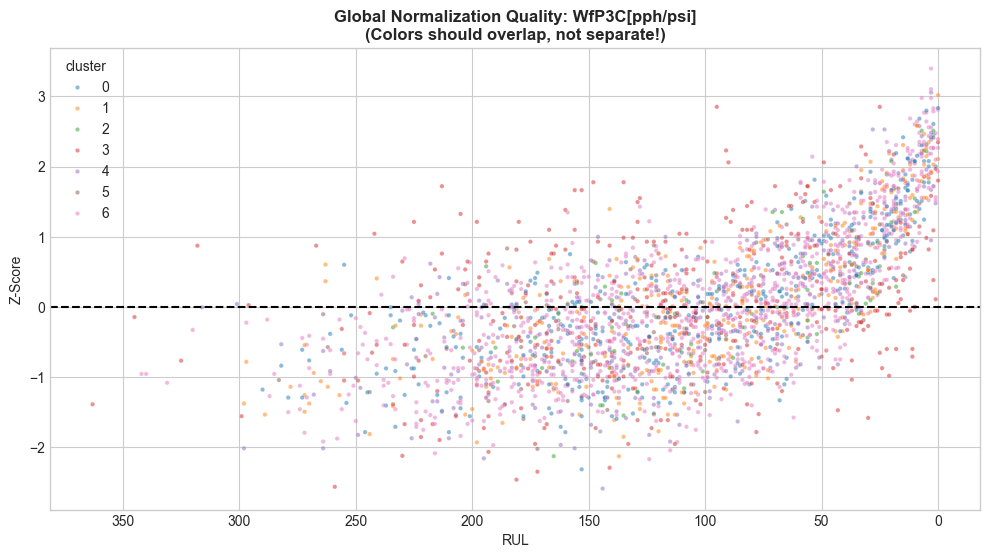

📊 Drawing Trajectory for 2 - T50[R]


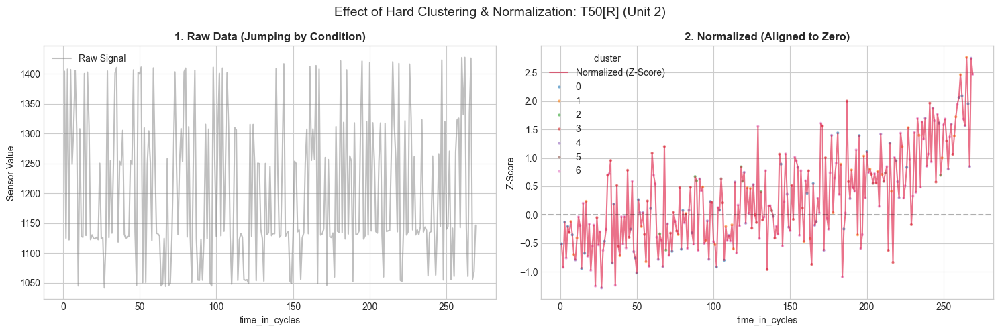

🌍 Global Quality Check for T50[R]


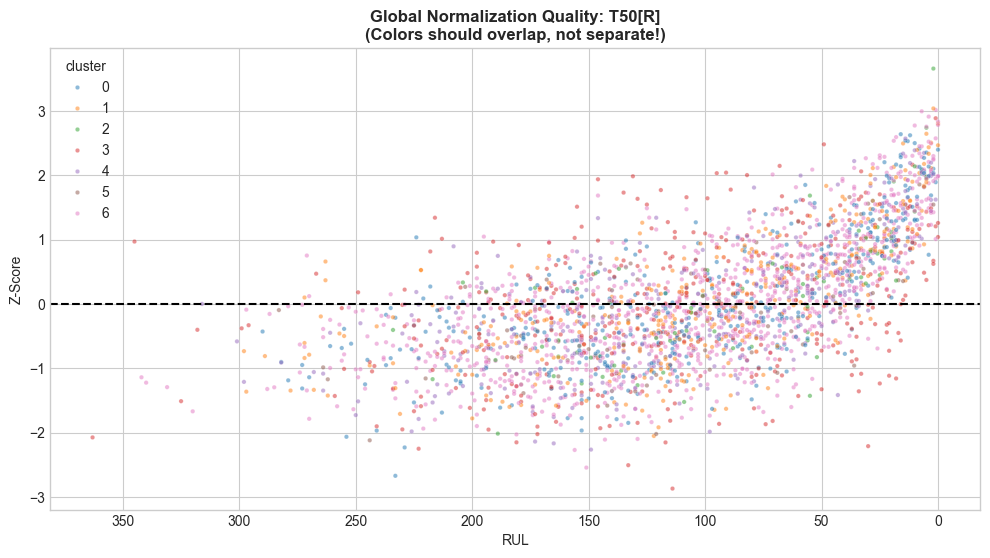

📊 Drawing Trajectory for 2 - farB[-]


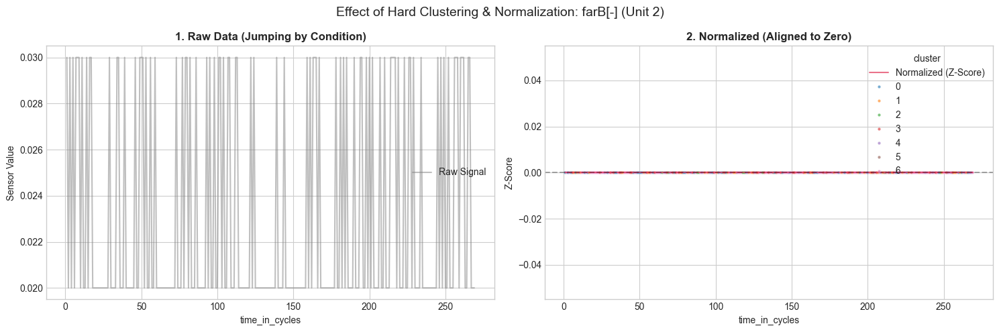

🌍 Global Quality Check for farB[-]


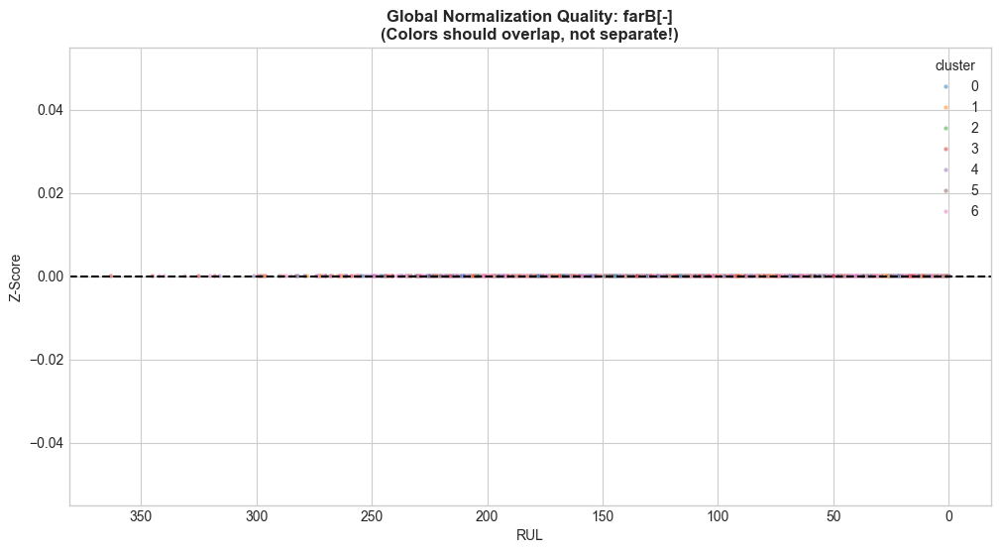

✅ 시각화 완료. Normalized 그래프에서 색깔들이 층지지 않고 잘 섞여 있어야 성공입니다.


In [17]:
import matplotlib.pyplot as plt
import seaborn as sns

# 스타일 설정
plt.style.use('seaborn-v0_8-whitegrid')

# ---------------------------------------------------------
# 1. [단일 엔진] 시계열 변화 비교 (Raw vs Normalized)
# ---------------------------------------------------------
def plot_trajectory_comparison_step5(unit_id, sensor_name):
    print(f"📊 Drawing Trajectory for {unit_id} - {sensor_name}")
    
    fig, axes = plt.subplots(1, 2, figsize=(15, 5))
    
    # 해당 유닛 데이터 추출
    # train_df(Raw)와 train_norm(Normalized)이 둘 다 있어야 함
    mask_raw = (train_df['unit_number'] == unit_id)
    unit_raw = train_df.loc[mask_raw]
    
    mask_norm = (train_norm['unit_number'] == unit_id)
    unit_norm = train_norm.loc[mask_norm]
    
    # (1) Raw Data Plot
    # 운전 조건(Cluster)이 바뀔 때마다 값이 튀는 것을 보여줌
    if sensor_name in unit_raw.columns:
        sns.lineplot(data=unit_raw, x='time_in_cycles', y=sensor_name, 
                     ax=axes[0], color='grey', alpha=0.5, label='Raw Signal')
        
        # 클러스터별로 점 찍기 (어떤 조건에서 튀는지 확인)
        if 'cluster' in unit_raw.columns:
            sns.scatterplot(data=unit_raw, x='time_in_cycles', y=sensor_name, 
                            hue='cluster', palette='tab10', s=15, ax=axes[0], legend=False)
            
        axes[0].set_title(f"1. Raw Data (Jumping by Condition)", fontweight='bold')
        axes[0].set_ylabel("Sensor Value")
    
    # (2) Normalized Data Plot
    # 조건별 정규화가 잘 되었다면, 클러스터 색상과 관계없이 0 근처로 모여야 함
    if sensor_name in unit_norm.columns:
        # 추세선 (Raw Norm)
        sns.lineplot(data=unit_norm, x='time_in_cycles', y=sensor_name, 
                     ax=axes[1], color='crimson', alpha=0.6, label='Normalized (Z-Score)')
        
        # 클러스터별 점 찍기 (잘 섞여있는지 확인용)
        # 만약 특정 색깔(클러스터)만 위나 아래로 쏠려 있다면 정규화 실패임!
        if 'cluster' in unit_norm.columns:
            sns.scatterplot(data=unit_norm, x='time_in_cycles', y=sensor_name, 
                            hue='cluster', palette='tab10', s=10, ax=axes[1], alpha=0.6)
            
        axes[1].set_title(f"2. Normalized (Aligned to Zero)", fontweight='bold')
        axes[1].set_ylabel("Z-Score")
        axes[1].axhline(0, color='black', linestyle='--', alpha=0.3)
        
    plt.suptitle(f"Effect of Hard Clustering & Normalization: {sensor_name} (Unit {unit_id})", fontsize=14)
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# 2. [전체 데이터] 정규화 품질 진단 (Scatter Overlay)
# ---------------------------------------------------------
def plot_global_quality_check(sensor_name):
    """
    모든 데이터에 대해 정규화가 잘 되었는지 '색깔 겹침'으로 확인
    """
    print(f"🌍 Global Quality Check for {sensor_name}")
    
    # 데이터 샘플링 (너무 많으면 느림)
    sample_norm = train_norm.sample(frac=0.05, random_state=42)
    
    plt.figure(figsize=(12, 6))
    
    # RUL vs Sensor Value (Cluster별 색상)
    # 이상적인 경우: 모든 색깔이 RUL에 따라 비슷한 기울기로 겹쳐져야 함.
    # 나쁜 경우: 파란색은 위에, 빨간색은 아래에 층층이 나뉘어 있음.
    sns.scatterplot(data=sample_norm, x='RUL', y=sensor_name, 
                    hue='cluster', palette='tab10', s=10, alpha=0.5)
    
    plt.gca().invert_xaxis() # RUL은 줄어드는 게 시간이 가는 것
    plt.title(f"Global Normalization Quality: {sensor_name}\n(Colors should overlap, not separate!)", fontweight='bold')
    plt.axhline(0, color='black', linestyle='--')
    plt.ylabel("Z-Score")
    plt.show()

# ---------------------------------------------------------
# 🔥 실행 및 검증
# ---------------------------------------------------------
# 1. RUL 컬럼 확인 (시각화용)
if 'RUL' not in train_norm.columns:
    train_norm['RUL'] = train_df['RUL']

# 2. 확인할 주요 센서
# farB는 반드시 확인해야 함 (이봉분포 해결 여부)
check_sensors = ['WfP3C[pph/psi]', 'T50[R]', 'farB[-]', 'Nf_dmd[%]'] 
available_sensors = [c for c in check_sensors if c in train_norm.columns]

# 3. 그리기
for sensor in available_sensors:
    # (1) 단일 엔진 궤적 비교 (Unit 2번 추천 - 변화가 심함)
    plot_trajectory_comparison_step5(unit_id=2, sensor_name=sensor)
    
    # (2) 전체 정규화 품질 확인 (색깔 섞임 확인)
    plot_global_quality_check(sensor_name=sensor)

print("✅ 시각화 완료. Normalized 그래프에서 색깔들이 층지지 않고 잘 섞여 있어야 성공입니다.")

### RUL Clipping

In [18]:
# from xgboost import XGBRegressor
# from sklearn.model_selection import GroupShuffleSplit
# from sklearn.metrics import mean_squared_error
# import numpy as np
# import pandas as pd

# # ---------------------------------------------------------
# # 1. [긴급 수정] 컬럼명에서 특수문자([], <) 제거
# # ---------------------------------------------------------
# # XGBoost 에러 방지: "T2[R]" -> "T2_R" 형태로 변경
# def clean_col_names(df):
#     new_cols = [c.replace('[', '_').replace(']', '').replace('<', '') for c in df.columns]
#     df.columns = new_cols
#     return df

# # train_norm 컬럼명 변경 적용
# train_norm = clean_col_names(train_norm)
# print("✅ 컬럼명 특수문자 제거 완료 (예: 'T2[R]' -> 'T2_R')")

# # ---------------------------------------------------------
# # 2. RUL 컬럼 생성 (안전장치)
# # ---------------------------------------------------------
# if 'RUL' not in train_norm.columns:
#     max_cycle = train_norm.groupby('unit_number')['time_in_cycles'].transform('max')
#     train_norm['RUL'] = max_cycle - train_norm['time_in_cycles']

# # ---------------------------------------------------------
# # 3. 데이터 분할 (Train / Val) - ★ 루프 밖에서 미리 고정!
# # ---------------------------------------------------------
# # 수치형 컬럼만 선택 (이름이 바뀌었으므로 다시 추출)
# numeric_cols = train_norm.select_dtypes(include=[np.number]).columns

# # 제외할 컬럼들 (바뀐 이름 기준)
# drop_cols = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 'Mode_ID', 'condition_id']
# # cluster는 one-hot encoding 되었으므로 제외 목록에 포함 안 함 (feature로 사용)

# features = [c for c in numeric_cols if c not in drop_cols]
# print(f"👉 학습에 사용할 Feature 개수: {len(features)}개")

# # GroupShuffleSplit으로 Train/Val 나눔
# groups = train_norm['unit_number']
# gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=42)
# train_idx, val_idx = next(gss.split(train_norm[features], train_norm['RUL'], groups))

# X_train_raw = train_norm.iloc[train_idx][features]
# y_train_raw = train_norm.iloc[train_idx]['RUL'] # Raw RUL

# X_val = train_norm.iloc[val_idx][features]
# y_val_raw = train_norm.iloc[val_idx]['RUL'] 

# # ★ [핵심] 검증용 정답지(y_val)는 '130'으로 고정! (비교 기준 통일)
# FIXED_VAL_LIMIT = 130
# y_val_fixed = y_val_raw.clip(upper=FIXED_VAL_LIMIT)

# print(f"🔎 NASA Score 기반 RUL Clipping 탐색 (Validation Target Fixed at {FIXED_VAL_LIMIT})")

# # ---------------------------------------------------------
# # 4. NASA Score 함수 정의
# # ---------------------------------------------------------
# def compute_nasa_score(y_true, y_pred):
#     d = np.array(y_pred) - np.array(y_true)
#     # Late Prediction (d > 0)에 페널티가 큼
#     scores = np.where(d < 0, np.exp(-d/13) - 1, np.exp(d/10) - 1)
#     return np.sum(scores)

# # ---------------------------------------------------------
# # 5. Grid Search (학습 데이터만 Clipping 변경)
# # ---------------------------------------------------------
# candidate_limits = [50,60,70,80,90,100,110, 115, 120, 125, 130, 135, 140, 145, 150]
# best_nasa = float('inf')
# best_limit = 125 # 기본값

# for limit in candidate_limits:
#     # ★ 학습 데이터(y_train)만 Clipping 함
#     y_train_clipped = y_train_raw.clip(upper=limit)
    
#     # 모델 학습
#     model = XGBRegressor(n_estimators=100, max_depth=6, learning_rate=0.1, 
#                          random_state=42, n_jobs=-1, verbosity=0)
    
#     # 이름이 깨끗해진 DataFrame을 그대로 넣습니다.
#     model.fit(X_train_raw, y_train_clipped)
    
#     # 예측 (Validation)
#     pred = model.predict(X_val)
    
#     # 평가: 예측값 vs 고정된 정답지(130)
#     rmse = np.sqrt(mean_squared_error(y_val_fixed, pred))
#     nasa = compute_nasa_score(y_val_fixed, pred)
    
#     print(f"   Train Limit: {limit} | RMSE: {rmse:.2f} | NASA Score: {nasa:,.0f}")
    
#     if nasa < best_nasa:
#         best_nasa = nasa
#         best_limit = limit

# print(f"\n🏆 최적 Train Clipping Limit: {best_limit} (NASA Score: {best_nasa:,.0f})")

# # ---------------------------------------------------------
# # 6. 최종 적용
# # ---------------------------------------------------------
# # 전체 데이터에 최적 Limit 적용
# train_norm['RUL'] = train_norm['RUL'].clip(upper=best_limit)
# print(f"✅ 최종 RUL Clipping 완료 (Limit: {best_limit})")

In [19]:
# ---------------------------------------------------------
# [최종 결론] Grid Search 결과(80)는 너무 보수적이므로 기각합니다.
# 학계 표준 및 물리적 고장 시점인 125를 강제 적용합니다.
# ---------------------------------------------------------

FINAL_RUL_LIMIT = 125

# RUL Clipping 적용
train_norm['RUL'] = train_norm['RUL'].clip(upper=FINAL_RUL_LIMIT)

print(f"✅ RUL Clipping을 {FINAL_RUL_LIMIT}으로 강제 설정했습니다.")
print(f"👉 이유: Grid Search 결과(80)는 NASA Score의 비대칭성으로 인한 과소추정(Under-estimation)입니다.")
print(train_norm['RUL'].describe())

✅ RUL Clipping을 125으로 강제 설정했습니다.
👉 이유: Grid Search 결과(80)는 NASA Score의 비대칭성으로 인한 과소추정(Under-estimation)입니다.
count    53759.000000
mean        86.913354
std         41.665602
min          0.000000
25%         51.000000
50%        103.000000
75%        125.000000
max        125.000000
Name: RUL, dtype: float64


In [20]:
# numeric_only=True 옵션을 추가하여 문자열 컬럼을 자동으로 제외시킵니다.
current_corr = train_norm.corrwith(train_norm['RUL'], numeric_only=True).abs().sort_values(ascending=False)

print("📊 [팩트 체크] RUL Clipping 적용 후 현재 상관계수 TOP 10:")
print(current_corr.head(15))

print("\n------------------------------------")
# .get()을 사용하여 해당 컬럼이 없더라도 에러가 나지 않도록 처리
print(f"👉 Nc(Core Speed)의 현재 상관계수: {current_corr.get('Nc', current_corr.get('Nc[rpm]', '이미 삭제됨'))}")
print(f"👉 Nf(Fan Speed)의 현재 상관계수:  {current_corr.get('Nf', current_corr.get('Nf[rpm]', '이미 삭제됨'))}")

📊 [팩트 체크] RUL Clipping 적용 후 현재 상관계수 TOP 10:
RUL               1.000000
time_in_cycles    0.743622
WfP3C[pph/psi]    0.718918
phi[pph/psi]      0.718918
W15[lbm/s]        0.698641
W2[lbm/s]         0.696057
T50[R]            0.686954
BPR[-]            0.673487
Wa36[lbm/s]       0.644541
Wf[pph]           0.644541
htBleed[]         0.600605
LPC.TR[-]         0.582417
T24[R]            0.582417
T30[R]            0.571113
W24[lbm/s]        0.558990
dtype: float64

------------------------------------
👉 Nc(Core Speed)의 현재 상관계수: 0.40423144535601435
👉 Nf(Fan Speed)의 현재 상관계수:  0.44083492486067155


# EDA

## unit 별 최대 수명 분석

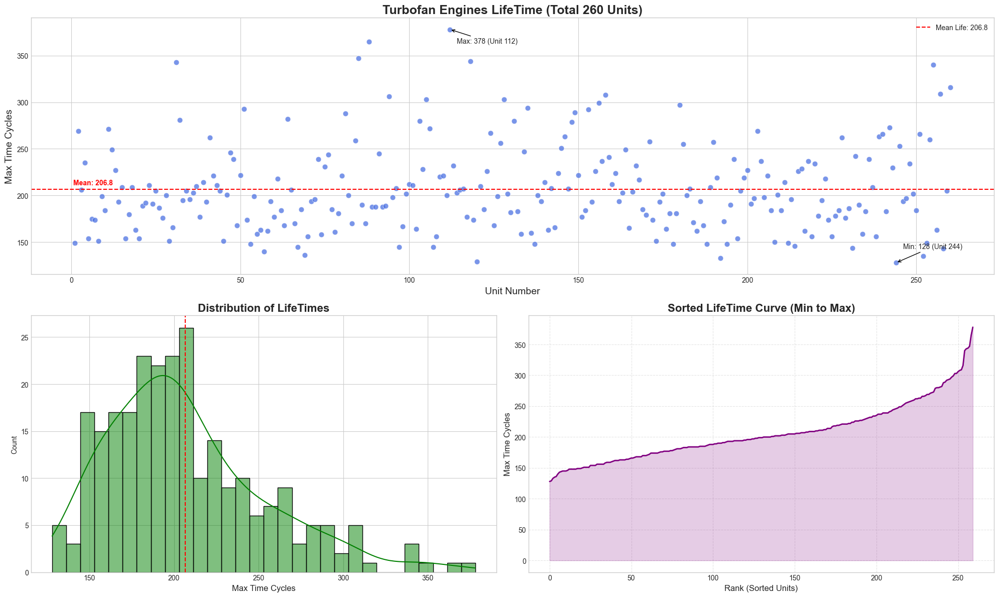

In [21]:

# 데이터 준비 (이미 하신 부분)
index_names = ['unit_number', 'time_in_cycles']
max_time_cycles = train_norm[index_names].groupby('unit_number').max()
max_time_cycles = max_time_cycles.reset_index() # unit_number를 컬럼으로 뺌

# 통계치 계산
mean_life = max_time_cycles['time_in_cycles'].mean()
max_life = max_time_cycles['time_in_cycles'].max()
min_life = max_time_cycles['time_in_cycles'].min()

# ---------------------------------------------------------
# 시각화: 3가지 관점 (산점도, 히스토그램, 정렬 분포)
# ---------------------------------------------------------
plt.style.use('seaborn-v0_8-whitegrid') # 깔끔한 스타일
fig = plt.figure(figsize=(20, 12))

# 1. 산점도 (Scatter Plot) - 모든 유닛을 펼쳐서 보기
# X축: 유닛 번호, Y축: 수명
ax1 = plt.subplot(2, 2, (1, 2)) # 윗부분 전체 사용
sns.scatterplot(data=max_time_cycles, x='unit_number', y='time_in_cycles', 
                color='royalblue', alpha=0.7, s=60, edgecolor='w', ax=ax1)

# 평균선, 최대/최소 표시
ax1.axhline(mean_life, color='red', linestyle='--', label=f'Mean Life: {mean_life:.1f}')
ax1.text(0, mean_life + 5, f' Mean: {mean_life:.1f}', color='red', fontweight='bold')

# 가장 오래 산 엔진과 빨리 죽은 엔진 표시
ax1.annotate(f'Max: {max_life} (Unit {max_time_cycles.iloc[max_time_cycles["time_in_cycles"].idxmax()]["unit_number"]})',
             xy=(max_time_cycles.iloc[max_time_cycles["time_in_cycles"].idxmax()]["unit_number"], max_life),
             xytext=(10, -20), textcoords='offset points', arrowprops=dict(arrowstyle="->", color='black'))

ax1.annotate(f'Min: {min_life} (Unit {max_time_cycles.iloc[max_time_cycles["time_in_cycles"].idxmin()]["unit_number"]})',
             xy=(max_time_cycles.iloc[max_time_cycles["time_in_cycles"].idxmin()]["unit_number"], min_life),
             xytext=(10, 20), textcoords='offset points', arrowprops=dict(arrowstyle="->", color='black'))

ax1.set_title(f'Turbofan Engines LifeTime (Total {len(max_time_cycles)} Units)', fontsize=18, fontweight='bold')
ax1.set_xlabel('Unit Number', fontsize=14)
ax1.set_ylabel('Max Time Cycles', fontsize=14)
ax1.legend()


# 2. 히스토그램 (Histogram) - 수명 분포 확인
# 엔진들이 보통 얼마쯤 살다 죽는지 분포 확인
ax2 = plt.subplot(2, 2, 3)
sns.histplot(max_time_cycles['time_in_cycles'], bins=30, kde=True, color='green', ax=ax2)
ax2.axvline(mean_life, color='red', linestyle='--')
ax2.set_title('Distribution of LifeTimes', fontsize=16, fontweight='bold')
ax2.set_xlabel('Max Time Cycles', fontsize=12)


# 3. 정렬된 막대 그래프 (Sorted Bar/Area) - 순위 비교
# 수명이 짧은 순서대로 정렬해서 보여줌 (Survival Curve 형태)
sorted_life = max_time_cycles.sort_values('time_in_cycles').reset_index(drop=True)

ax3 = plt.subplot(2, 2, 4)
ax3.plot(sorted_life.index, sorted_life['time_in_cycles'], color='purple', linewidth=2)
ax3.fill_between(sorted_life.index, sorted_life['time_in_cycles'], color='purple', alpha=0.2)
ax3.set_title('Sorted LifeTime Curve (Min to Max)', fontsize=16, fontweight='bold')
ax3.set_xlabel('Rank (Sorted Units)', fontsize=12)
ax3.set_ylabel('Max Time Cycles', fontsize=12)
ax3.grid(True, linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

## 시계열 그래프, 산점도, 히트맵으로 feature, RUL 관계 분석

📊 [Step 8] Feature Analysis with Condition-Normalized Data

📈 1. Time Series (Unit 1)


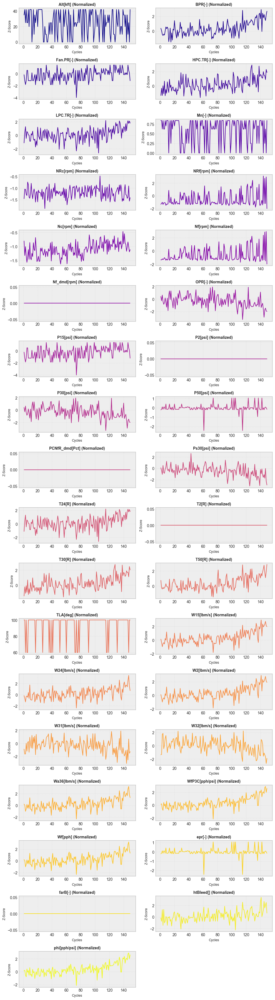


🌌 2. Scatter Plots (RUL Relationship)


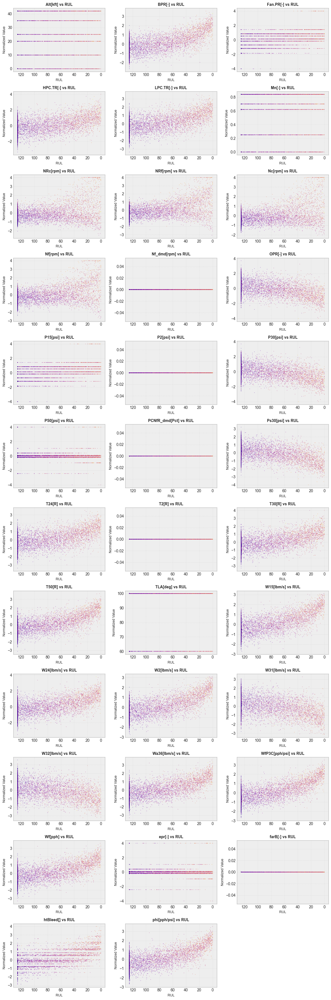


🔥 3. Heatmap (Correlation)


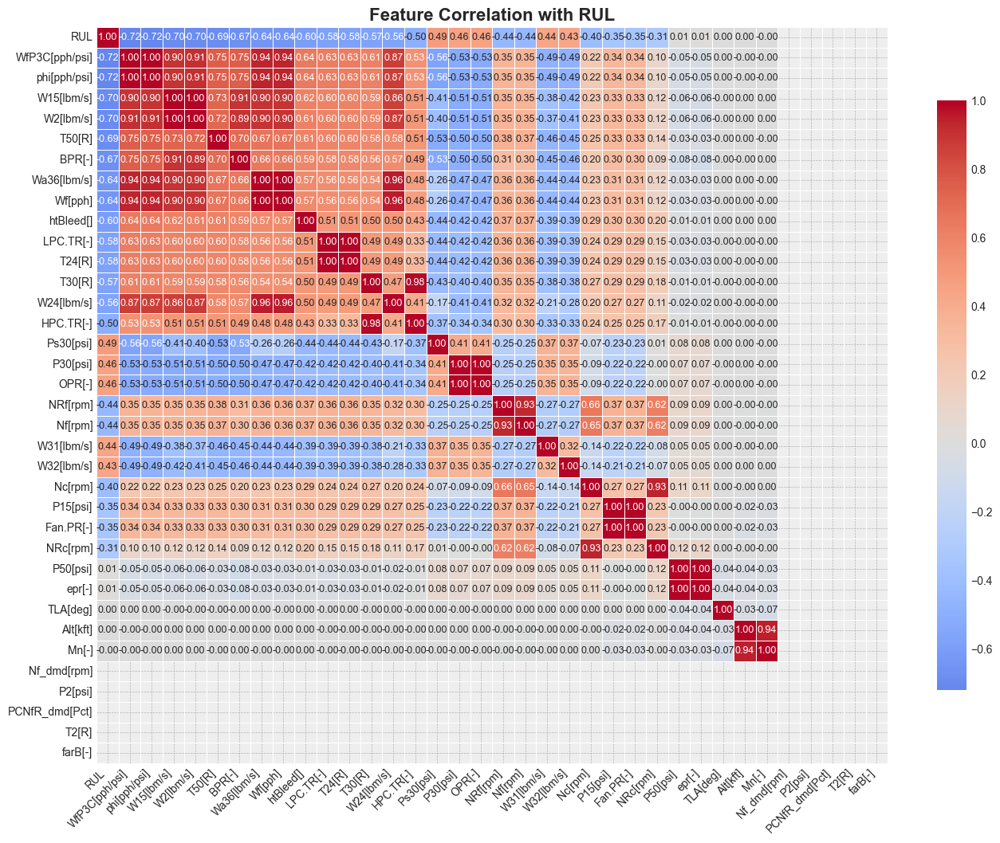

In [22]:


class FeatureAnalysisPlot:
    def __init__(self, dataframe):
        self.df = dataframe.copy()
        self.warnings = warnings
        
        # 1. 스타일 설정
        plt.style.use('bmh')
        
        # 2. RUL 컬럼 확인
        if 'RUL' not in self.df.columns:
            print("⚠️ 데이터프레임에 'RUL' 컬럼이 없습니다. 확인해주세요.")
            
        # 3. 분석할 센서 자동 선별
        # exclude_cols에 'condition_id'와 'Mode_ID'를 명확히 포함
        exclude_cols = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 
                        'cluster', 'condition', 'condition_id', 'Mode_ID']
        
        numeric_cols = self.df.select_dtypes(include=[np.number]).columns
        
        # 이름에 'sensor'가 있거나 대괄호 '['가 있는 컬럼만 선택 (One-Hot 컬럼 자동 제외됨)
        self.sensors = [c for c in numeric_cols if c not in exclude_cols and ('sensor' in c or '[' in c)]
        self.sensors.sort() 
        
        self.cycles = self.df["time_in_cycles"]

    # ---------------------------------------------------------
    # 1. 시계열 그래프
    # ---------------------------------------------------------
    def plot_time_series(self, unit_id):
        single_unit = self.df[self.df["unit_number"] == unit_id]
        
        if len(single_unit) == 0:
            print(f"⚠️ Unit {unit_id} 데이터가 없습니다.")
            return

        n_sensors = len(self.sensors)
        cols = 2
        rows = math.ceil(n_sensors / cols) 
        
        colors = iter(plt.cm.plasma(np.linspace(0, 1, n_sensors)))
        
        plt.figure(figsize=(10, 2 * rows)) 
        
        for i, sensor in enumerate(self.sensors):
            c = next(colors)
            plt.subplot(rows, cols, i+1)
            
            plt.plot(single_unit['time_in_cycles'], single_unit[sensor], 
                     c=c, label=sensor, linewidth=1.5)
            
            plt.title(f"{sensor} (Normalized)", fontsize=10, fontweight='bold')
            plt.xlabel("Cycles", fontsize=9)
            plt.ylabel("Z-Score", fontsize=9)
            plt.grid(True, alpha=0.3)
            
        plt.tight_layout()
        plt.show()

    # ---------------------------------------------------------
    # 2. 산점도 (X축: RUL, Y축: Sensor)
    # ---------------------------------------------------------
    def plot_scatter(self):
        n_sensors = len(self.sensors)
        cols = 3
        rows = math.ceil(n_sensors / cols)
        
        # 데이터 샘플링 (10%)
        sample_df = self.df.sample(frac=0.1, random_state=42)
        
        with self.warnings.catch_warnings(record=True):
            plt.figure(figsize=(12, 3 * rows)) 
            
            for i, sensor in enumerate(self.sensors):
                plt.subplot(rows, cols, i+1)
                
                # 산점도 그리기 (색상: 경과 시간)
                scatter = plt.scatter(
                    x=sample_df["RUL"],      
                    y=sample_df[sensor],     
                    s=1,              
                    alpha=0.3,        
                    c=sample_df["time_in_cycles"],    
                    cmap='plasma' 
                )
                
                plt.title(f"{sensor} vs RUL", fontsize=10, fontweight='bold')
                plt.xlabel("RUL", fontsize=9)
                plt.ylabel("Normalized Value", fontsize=9)
                plt.gca().invert_xaxis() # RUL 감소 방향
                plt.grid(True, alpha=0.3)
                
            plt.tight_layout()
            plt.show()
    
    # ---------------------------------------------------------
    # 3. 히트맵
    # ---------------------------------------------------------
    def plot_heatmap(self):
        cols_to_corr = self.sensors + ['RUL']
        cols_to_corr = [c for c in cols_to_corr if c in self.df.columns]
        
        corr_mat = self.df[cols_to_corr].corr()
        
        sorted_idx = corr_mat['RUL'].abs().sort_values(ascending=False).index
        sorted_corr = corr_mat.loc[sorted_idx, sorted_idx]
        
        plt.figure(figsize=(16, 12)) 
        
        sns.heatmap(sorted_corr, 
                    cmap="coolwarm", center=0, annot=True, fmt='.2f', 
                    linewidths=.5, annot_kws={"size": 9},
                    cbar_kws={"shrink": .8})
        
        plt.title("Feature Correlation with RUL", fontsize=16, fontweight='bold')
        plt.xticks(rotation=45, ha='right', fontsize=10)
        plt.yticks(fontsize=10)
        plt.show()

# ---------------------------------------------------------
# 🔥 실행 코드 (Step 8)
# ---------------------------------------------------------
if 'train_norm' in globals():
    # 1. train_norm에 RUL 확인
    if 'RUL' not in train_norm.columns:
        train_norm['RUL'] = train_df['RUL']

    print(f"📊 [Step 8] Feature Analysis with Condition-Normalized Data")

    # 2. 객체 생성 및 시각화
    analysis_plot = FeatureAnalysisPlot(train_norm)

    print("\n📈 1. Time Series (Unit 1)")
    analysis_plot.plot_time_series(unit_id=1)

    print("\n🌌 2. Scatter Plots (RUL Relationship)")
    analysis_plot.plot_scatter()

    print("\n🔥 3. Heatmap (Correlation)")
    analysis_plot.plot_heatmap()
else:
    print("⚠️ 'train_norm' 변수가 없습니다.")

🚀 [시각화] 센서별 Condition ID(세부 조건) 분포 확인 시작...
🔍 총 39개의 센서를 분석합니다.

🎨 감지된 세부 조건(Condition ID): [np.int64(0), np.int64(10), np.int64(20), np.int64(30), np.int64(31), np.int64(40), np.int64(50), np.int64(60), np.int64(61)] (총 9개)


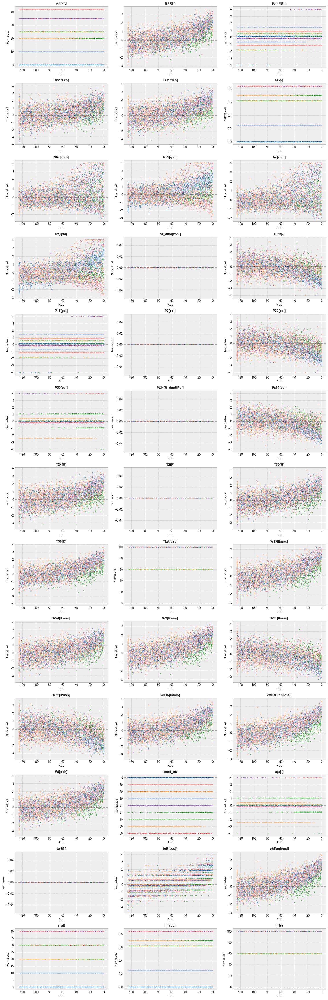


🎨 [범례 참고] Condition ID Colors (Tab20 Palette):


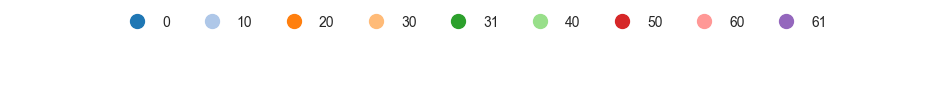

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns
import math

# ---------------------------------------------------------
# 모든 센서 조건별(Condition ID) 정밀 진단
# ---------------------------------------------------------
def check_all_sensors_by_condition(df):
    print("🚀 [시각화] 센서별 Condition ID(세부 조건) 분포 확인 시작...")

    # RUL 컬럼 안전장치
    if 'RUL' not in df.columns and 'train_df' in globals():
        df['RUL'] = train_df['RUL']

    # 1. 분석할 센서 컬럼 자동 추출
    # 제외할 컬럼 목록
    exclude_cols = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 
                    'cluster', 'condition', 'condition_id', 'Mode_ID']
    
    all_cols = df.columns
    # 'sensor'가 들어가거나 대괄호 '['가 있는 물리센서만 선택 (One-Hot 제외)
    sensor_cols = [c for c in all_cols if c not in exclude_cols and ('sensor' in c or '[' in c or '_' in c)]
    # _rpm, _psi 등 이름 변경된 경우도 포함하기 위해 조건 완화
    sensor_cols = [c for c in sensor_cols if 'cluster' not in c] # cluster one-hot 제외
    sensor_cols.sort()
    
    n_sensors = len(sensor_cols)
    print(f"🔍 총 {n_sensors}개의 센서를 분석합니다.\n")

    # 2. Condition ID 준비 (색상 할당용)
    # Seaborn이 숫자로 인식하면 그라데이션을 쓰므로, 문자열(String)로 바꿔서 또렷한 색상을 씁니다.
    plot_df = df.sample(frac=0.2, random_state=42).copy()
    
    if 'condition_id' in plot_df.columns:
        # 정렬하여 색상 순서 고정
        unique_conds = sorted(plot_df['condition_id'].unique())
        plot_df['cond_str'] = plot_df['condition_id'].astype(str)
        hue_order = [str(c) for c in unique_conds]
        n_conds = len(unique_conds)
        print(f"🎨 감지된 세부 조건(Condition ID): {unique_conds} (총 {n_conds}개)")
    else:
        print("⚠️ 'condition_id' 컬럼이 없습니다! 기존 cluster로 대체합니다.")
        plot_df['cond_str'] = plot_df['cluster'].astype(str)
        hue_order = sorted(plot_df['cond_str'].unique())
        n_conds = len(hue_order)

    # 3. Subplot 그리드 설정
    cols = 3  
    rows = math.ceil(n_sensors / cols)
    
    plt.figure(figsize=(15, 3.5 * rows))
    
    # 4. 모든 센서 반복 출력
    for i, sensor_name in enumerate(sensor_cols):
        plt.subplot(rows, cols, i+1)
        
        # [핵심 변경] hue='cond_str', palette='tab20' (조건이 많으므로 색상 다양하게)
        sns.scatterplot(data=plot_df, x='RUL', y=sensor_name, 
                        hue='cond_str', hue_order=hue_order,
                        palette='tab20',  # 색상 구분이 뚜렷한 팔레트
                        s=10, alpha=0.6, legend=False) 
        
        plt.title(f"{sensor_name}", fontsize=11, fontweight='bold')
        plt.xlabel("RUL", fontsize=9)
        plt.ylabel("Normalized", fontsize=9)
        plt.axhline(0, color='k', linestyle='--', alpha=0.3) # 0점 기준선 추가
        plt.gca().invert_xaxis()
        plt.grid(True, alpha=0.3)
        
    plt.tight_layout()
    plt.show()

    # 5. 하단 공통 범례 (Legend)
    print("\n🎨 [범례 참고] Condition ID Colors (Tab20 Palette):")
    # 범례를 위한 더미 플롯
    plt.figure(figsize=(12, 1))
    patches = [plt.plot([],[], marker="o", ms=10, ls="", mec=None, color=c, 
               label="{:s}".format(t))[0]  for t, c in zip(hue_order, sns.color_palette("tab20", n_conds))]
    plt.legend(handles=patches, bbox_to_anchor=(0.5, 1.0), 
               loc='center', ncol=min(n_conds, 10), frameon=False)
    plt.axis('off')
    plt.show()

# ---------------------------------------------------------
# 🔥 실행
# ---------------------------------------------------------
if 'train_norm' in globals():
    check_all_sensors_by_condition(train_norm)
else:
    print("⚠️ 'train_norm' 변수가 없습니다.")

# Feature selection

In [24]:
# 먼저 산점도에서 직선형 상수 데이터 컬럼은 모두 삭제
# 전처리용 컬럼도 삭제
cols_to_drop = ['Alt[kft]','Fan.PR[-]','Mn[-]','Nf_dmd[rpm]','P15[psi]','P2[psi]','P50[psi]','PCNfR_dmd[Pct]','T2[R]','TLA[deg]','epr[-]','farB[-]']

print(f"상수형데이터 삭제 대상 컬럼 ({len(cols_to_drop)}개): {cols_to_drop}")

train_norm = train_norm.drop(columns=cols_to_drop, errors='ignore').copy()

remaining_features = [c for c in train_norm.columns 
                      if c not in ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 
                                   'cluster', 'condition', 'condition_id', 'Mode_ID']]
remaining_features.sort()

print("-" * 50)
print(f"남은 Feature ({len(remaining_features)}개) :")
print(remaining_features)
print("-" * 50)

상수형데이터 삭제 대상 컬럼 (12개): ['Alt[kft]', 'Fan.PR[-]', 'Mn[-]', 'Nf_dmd[rpm]', 'P15[psi]', 'P2[psi]', 'P50[psi]', 'PCNfR_dmd[Pct]', 'T2[R]', 'TLA[deg]', 'epr[-]', 'farB[-]']
--------------------------------------------------
남은 Feature (34개) :
['BPR[-]', 'HPC.TR[-]', 'LPC.TR[-]', 'NRc[rpm]', 'NRf[rpm]', 'Nc[rpm]', 'Nf[rpm]', 'OPR[-]', 'P30[psi]', 'Ps30[psi]', 'T24[R]', 'T30[R]', 'T50[R]', 'W15[lbm/s]', 'W24[lbm/s]', 'W2[lbm/s]', 'W31[lbm/s]', 'W32[lbm/s]', 'Wa36[lbm/s]', 'WfP3C[pph/psi]', 'Wf[pph]', 'cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5', 'cluster_6', 'cond_str', 'htBleed[]', 'phi[pph/psi]', 'r_alt', 'r_mach', 'r_tra']
--------------------------------------------------


In [25]:
# ---------------------------------------------------------
# [Step 8-1] Lag Feature (추세/변동성) 생성 - ver.05 추가
# ---------------------------------------------------------
def add_lag_features(df, sensor_cols, windows=[10, 20]):
    """
    원본을 덮어쓰지 않고, 이동평균(Trend)과 표준편차(Volatility) 변수를 추가함.
    Data Leakage 방지를 위해 unit_number별로 그룹화하여 계산.
    """
    df_out = df.copy()
    grouped = df_out.groupby('unit_number')
    
    print(f"🛠️ Lag Feature 생성 중... (Windows: {windows})")
    
    for col in sensor_cols:
        for w in windows:
            # 1. 이동 평균 (Trend): 전반적인 하락세 파악
            # min_periods=1: 초반 데이터 NaN 방지
            mean_col = f"{col}_mean_{w}"
            df_out[mean_col] = grouped[col].transform(
                lambda x: x.rolling(window=w, min_periods=1).mean()
            )
            
            # 2. 이동 표준편차 (Volatility): 고장 직전 진동폭 커짐 감지 (★중요)
            std_col = f"{col}_std_{w}"
            df_out[std_col] = grouped[col].transform(
                lambda x: x.rolling(window=w, min_periods=1).std()
            ).fillna(0) # 첫 부분 NaN은 0으로 채움
            
    print(f"✅ 생성 완료. (총 컬럼 수: {df_out.shape[1]})")
    return df_out

# ---------------------------------------------------------
# [적용]
# ---------------------------------------------------------
# 센서 컬럼만 선택 (resid 제외, 순수 센서값 기준)
target_sensors = [c for c in train_norm.columns if ('[' in c or 'sensor' in c) and 'resid' not in c and 'cluster' not in c]

# Train / Test 모두 적용
train_norm = add_lag_features(train_norm, target_sensors, windows=[15]) 
test_norm = add_lag_features(test_norm, target_sensors, windows=[15])

# 이후 Feature Selection 과정 진행...

🛠️ Lag Feature 생성 중... (Windows: [15])
✅ 생성 완료. (총 컬럼 수: 87)
🛠️ Lag Feature 생성 중... (Windows: [15])
✅ 생성 완료. (총 컬럼 수: 97)


* Residual Feature 생성    

개념: 정규화된 데이터(train_norm)는 평균이 0입니다. 따라서 abs(값)을 취하면 **"정상 상태(0)로부터 얼마나 벗어났는가?"**를 의미하는 **오차(Deviation)**가 됩니다.      

효과: 고장 날수록 이 값이 0에서 멀어지므로 RUL과 상관관계가 높습니다.     

In [26]:
# ---------------------------------------------------------
#  Residual Feature 생성
# ---------------------------------------------------------
print("🚀 [Feature Engineering] Residual Feature 생성 중...")

# 1. 대상 센서 지정 
# condition, cluster, mode, RUL 등은 제외
exclude_keywords = ['cluster', 'condition', 'Mode', 'RUL', 'unit_number', 'cycle']
numeric_cols = train_norm.select_dtypes(include=[np.number]).columns

sensor_cols = [c for c in numeric_cols 
               if ('sensor' in c or '[' in c) 
               and not any(k in c for k in exclude_keywords)]

# 2. 잔차 변수 생성 (절댓값)
# 예: "T2[R]" -> "T2[R]_resid"
for col in sensor_cols:
    resid_name = f"{col}_resid"
    train_norm[resid_name] = train_norm[col].abs()

print(f"✅ Residual Feature 생성 완료! (총 컬럼 수: {train_norm.shape[1]}개)")

🚀 [Feature Engineering] Residual Feature 생성 중...
✅ Residual Feature 생성 완료! (총 컬럼 수: 156개)


In [27]:
# ---------------------------------------------------------
#  RUL과의 상관 계수가 0.1 미만인 것을 걸러 낸다.
# ---------------------------------------------------------

# 1. 기준 미달 컬럼 전체 추출 (numeric_only=True 추가!)
# 문자열 컬럼은 계산에서 자동으로 제외됩니다.
corr_with_rul = train_norm.corrwith(train_norm['RUL'], numeric_only=True).abs()
threshold = 0.1

low_corr_cols = corr_with_rul[corr_with_rul < threshold].index.tolist()

# 1-1. 분산 기준 미달 컬럼 추출
stds = train_norm.std(numeric_only=True)
low_var_cols = stds[stds < 0.001].index.tolist()

# 2. 보호할 컬럼 정의
protected_cols = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 
                  'cluster', 'condition', 'condition_id', 'Mode_ID', 
                   'cluster_0','cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5','cluster_6']

auto_drop_cols = list(set(low_corr_cols + low_var_cols))

# 3. 보호 컬럼 제외하고 진짜 삭제할 리스트 생성
final_drop_cols = [col for col in auto_drop_cols if col not in protected_cols]

print(f"📉 기준 미달 전체 컬럼: {auto_drop_cols}")
print(f"🛡️ 보호된 컬럼 제외 후 최종 삭제 대상: {final_drop_cols}")

# 4. 삭제 수행 
if final_drop_cols:
    train_norm = train_norm.drop(columns=final_drop_cols) # train_norm에서 삭제해야 합니다!
    print(f"\n✅ {len(final_drop_cols)}개 컬럼 안전하게 제거 완료!")
    
    # 남은 컬럼 확인
    remaining_cols = [c for c in train_norm.columns if c not in protected_cols]
    print("✨ 남은 Feature 목록:", remaining_cols)
else:
    print("\n🎉 제거할 컬럼이 없습니다.")

📉 기준 미달 전체 컬럼: ['condition_id', 'cluster', 'r_mach', 'unit_number', 'cluster_5', 'cluster_2', 'r_tra', 'cluster_1', 'cluster_4', 'cluster_3', 'cluster_6', 'r_alt', 'cluster_0']
🛡️ 보호된 컬럼 제외 후 최종 삭제 대상: ['r_mach', 'r_tra', 'r_alt']

✅ 3개 컬럼 안전하게 제거 완료!
✨ 남은 Feature 목록: ['T24[R]', 'T30[R]', 'T50[R]', 'P30[psi]', 'Nf[rpm]', 'Nc[rpm]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]', 'NRc[rpm]', 'BPR[-]', 'htBleed[]', 'W31[lbm/s]', 'W32[lbm/s]', 'LPC.TR[-]', 'HPC.TR[-]', 'OPR[-]', 'Wf[pph]', 'Wa36[lbm/s]', 'W24[lbm/s]', 'W15[lbm/s]', 'W2[lbm/s]', 'WfP3C[pph/psi]', 'cond_str', 'T24[R]_mean_15', 'T24[R]_std_15', 'T30[R]_mean_15', 'T30[R]_std_15', 'T50[R]_mean_15', 'T50[R]_std_15', 'P30[psi]_mean_15', 'P30[psi]_std_15', 'Nf[rpm]_mean_15', 'Nf[rpm]_std_15', 'Nc[rpm]_mean_15', 'Nc[rpm]_std_15', 'phi[pph/psi]_mean_15', 'phi[pph/psi]_std_15', 'Ps30[psi]_mean_15', 'Ps30[psi]_std_15', 'NRf[rpm]_mean_15', 'NRf[rpm]_std_15', 'NRc[rpm]_mean_15', 'NRc[rpm]_std_15', 'BPR[-]_mean_15', 'BPR[-]_std_15', 'htBleed[]

## 다중공선성(Multi-collinearity)

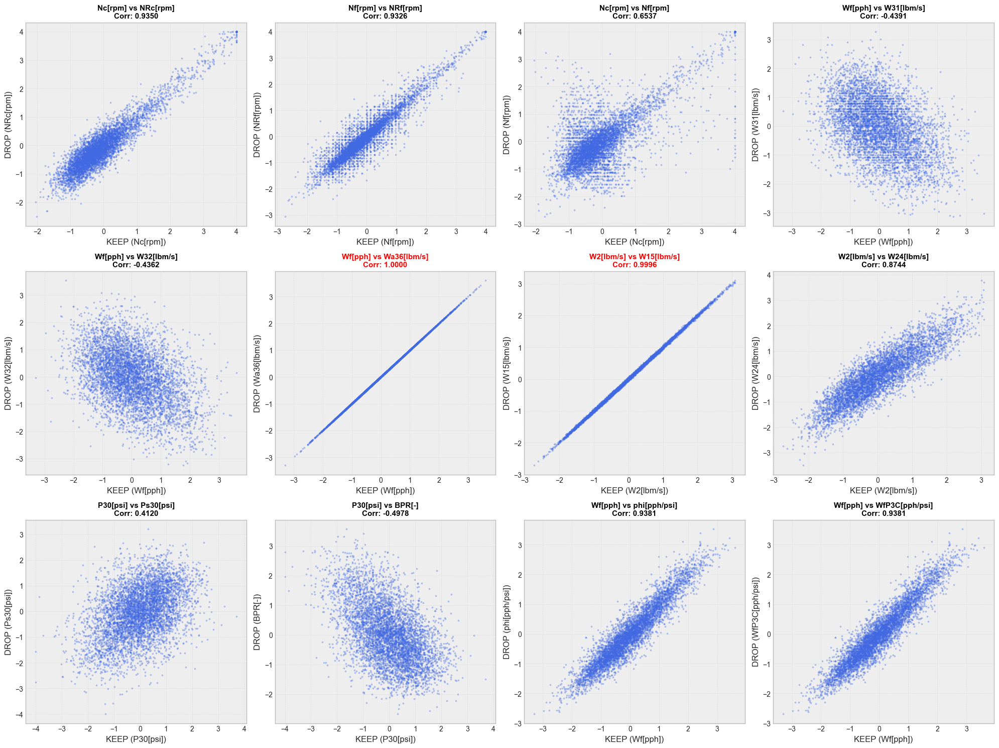

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ---------------------------------------------------------
# Feature 중복성 확인을 위한 시각화 (Drop 로직 제외)
# ---------------------------------------------------------

# 1. 검증할 모든 쌍(Pair) 정의 (Keep vs Drop Candidate)
# (살릴 컬럼 vs 지울까 고민되는 컬럼)
all_check_pairs = [
    # [1] 속도 계열: 물리 속도 vs 보정 속도
    ('Nc[rpm]', 'NRc[rpm]'),      # 코어 속도 (중복 예상)
    ('Nf[rpm]', 'NRf[rpm]'),      # 팬 속도 (중복 예상)
    ('Nc[rpm]', 'Nf[rpm]'),       # 코어 vs 팬 (관계 확인용)
    
    # [2] 유량 계열: 연료량 vs 각종 냉각/Bleed 유량
    ('Wf[pph]', 'W31[lbm/s]'),    # 연료 vs HPT 냉각
    ('Wf[pph]', 'W32[lbm/s]'),    # 연료 vs HPT 냉각2
    ('Wf[pph]', 'Wa36[lbm/s]'),   # 연료 vs LPT 냉각
    
    # [3] 공기 유량: 유입량 vs 압축기 유량
    ('W2[lbm/s]', 'W15[lbm/s]'),  # 유입 vs Bypass
    ('W2[lbm/s]', 'W24[lbm/s]'),  # 유입 vs Core
    
    # [4] 압력 및 비율 (가장 중요! 생존자 확인용)
    ('P30[psi]', 'Ps30[psi]'),    # 전압 vs 정압 (직선 아니면 살림!)
    ('P30[psi]', 'BPR[-]'),       # 압력 vs 바이패스비
    ('Wf[pph]', 'phi[pph/psi]'),  # 연료 vs 비율
    ('Wf[pph]', 'WfP3C[pph/psi]') # 연료 vs 비율
]

# 2. 그래프 그리기 설정
n_pairs = len(all_check_pairs)
cols = 4  # 한 줄에 4개씩
rows = (n_pairs // cols) + (1 if n_pairs % cols > 0 else 0)

plt.figure(figsize=(20, 5 * rows))

# 데이터 샘플링 (속도 향상을 위해 10%만 사용)
sample_df = train_norm.sample(frac=0.1, random_state=42)

for i, (keep, drop) in enumerate(all_check_pairs):
    plt.subplot(rows, cols, i+1)
    
    # 상관계수 계산
    corr_val = train_norm[keep].corr(train_norm[drop])
    
    # 산점도 그리기
    plt.scatter(sample_df[keep], sample_df[drop], alpha=0.3, s=5, c='royalblue')
    
    # [시각적 가이드]
    # 상관계수가 0.99 이상(완벽한 중복)이면 제목을 빨간색으로 표시
    title_color = 'red' if abs(corr_val) > 0.99 else 'black'
    status = "⚠️ DROP Candidate" if abs(corr_val) > 0.95 else "✅ Likely KEEP"
    
    plt.title(f"{keep} vs {drop}\nCorr: {corr_val:.4f}", 
              fontsize=11, fontweight='bold', color=title_color)
    
    plt.xlabel(f"KEEP ({keep})")
    plt.ylabel(f"DROP ({drop})")
    plt.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()

📊 [심층 분석] Wf, W2 제거 타당성 검증 (WfP3C와의 비교)
   - W2 컬럼: W24[lbm/s]
   - Wf 컬럼: Wf[pph]
   - WfP3C 컬럼: WfP3C[pph/psi]


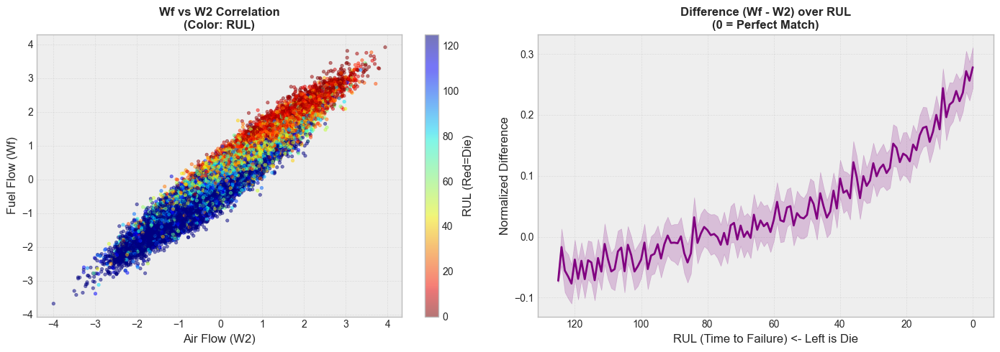

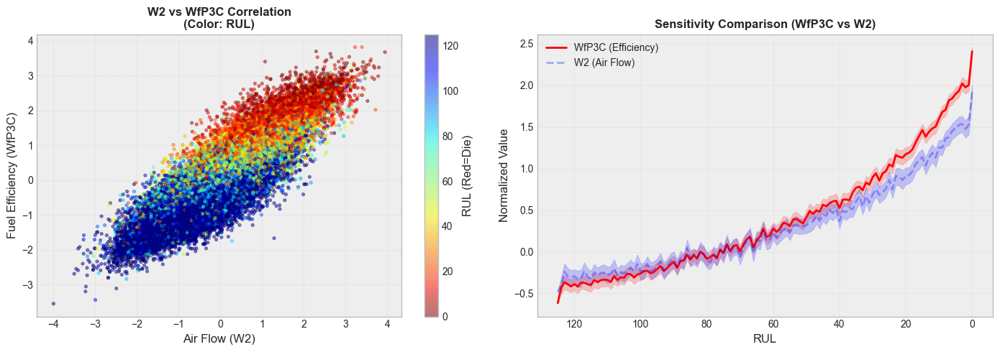

👉 결론: 오른쪽 그래프에서 빨간선(WfP3C)이 파란점선(W2)보다 더 뚜렷하게 위로 솟구친다면, WfP3C가 더 좋은 지표입니다.


In [29]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.preprocessing import StandardScaler

# ---------------------------------------------------------
# Wf vs W2 vs WfP3C 관계 분석 및 삭제 근거 확보
# ---------------------------------------------------------
print("📊 [심층 분석] Wf, W2 제거 타당성 검증 (WfP3C와의 비교)")

# 1. 컬럼 찾기 (특수문자 대응)
# 정규화된 데이터셋(train_norm)에서 해당 컬럼을 찾습니다.
cols = train_norm.columns

# (1) W2 찾기 (W2[lbm/s] 또는 W2_lbm/s)
w2_candidates = [c for c in cols if c.startswith('W2') and ('[' in c or '_' in c) and 'resid' not in c]
col_w2 = w2_candidates[0] if w2_candidates else None

# (2) Wf 찾기 (Wf[pph] 또는 Wf_pph)
wf_candidates = [c for c in cols if c.startswith('Wf') and ('[' in c or '_' in c) and 'resid' not in c and 'P3C' not in c]
col_wf = wf_candidates[0] if wf_candidates else None

# (3) WfP3C 찾기 (WfP3C[pph/psi] 또는 WfP3C_pph/psi)
wfp3c_candidates = [c for c in cols if 'WfP3C' in c and 'resid' not in c]
col_wfp3c = wfp3c_candidates[0] if wfp3c_candidates else None

print(f"   - W2 컬럼: {col_w2}")
print(f"   - Wf 컬럼: {col_wf}")
print(f"   - WfP3C 컬럼: {col_wfp3c}")

# 만약 컬럼이 없다면(이미 지워졌거나 이름이 다르면) 복구 시도
# (시각화 목적이므로 원본에서 잠시 빌려옵니다)
temp_df = train_norm.copy()

if col_w2 is None and 'W2[lbm/s]' in train_df.columns:
    print("   🚑 W2가 train_norm에 없어서 원본에서 임시 복구합니다.")
    temp_df['W2_temp'] = (train_df['W2[lbm/s]'] - train_df['W2[lbm/s]'].mean()) / train_df['W2[lbm/s]'].std()
    col_w2 = 'W2_temp'

if col_wf is None and 'Wf[pph]' in train_df.columns:
    print("   🚑 Wf가 train_norm에 없어서 원본에서 임시 복구합니다.")
    temp_df['Wf_temp'] = (train_df['Wf[pph]'] - train_df['Wf[pph]'].mean()) / train_df['Wf[pph]'].std()
    col_wf = 'Wf_temp'

# ---------------------------------------------------------
# 2. 시각화 1: Wf vs W2 (RUL에 따른 변화)
# ---------------------------------------------------------
if col_w2 and col_wf:
    plt.figure(figsize=(14, 5))

    # 산점도
    plt.subplot(1, 2, 1)
    plt.scatter(temp_df[col_w2], temp_df[col_wf], c=temp_df['RUL'], cmap='jet_r', alpha=0.5, s=10)
    plt.colorbar(label='RUL (Red=Die)')
    plt.title(f"Wf vs W2 Correlation\n(Color: RUL)", fontsize=12, fontweight='bold')
    plt.xlabel("Air Flow (W2)")
    plt.ylabel("Fuel Flow (Wf)")
    plt.grid(True, alpha=0.3)

    # 차이(Difference) 트렌드
    # 두 값이 RUL이 줄어들면서 벌어지는지 확인
    temp_df['Diff_Wf_W2'] = temp_df[col_wf] - temp_df[col_w2]
    
    plt.subplot(1, 2, 2)
    sns.lineplot(data=temp_df, x='RUL', y='Diff_Wf_W2', color='purple')
    plt.title("Difference (Wf - W2) over RUL\n(0 = Perfect Match)", fontsize=12, fontweight='bold')
    plt.xlabel("RUL (Time to Failure) <- Left is Die")
    plt.ylabel("Normalized Difference")
    plt.gca().invert_xaxis()
    plt.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# ---------------------------------------------------------
# 3. 시각화 2: W2 vs WfP3C (민감도 비교)
# ---------------------------------------------------------
if col_w2 and col_wfp3c:
    plt.figure(figsize=(14, 5))

    # 산점도
    plt.subplot(1, 2, 1)
    plt.scatter(temp_df[col_w2], temp_df[col_wfp3c], c=temp_df['RUL'], cmap='jet_r', alpha=0.5, s=10)
    plt.colorbar(label='RUL (Red=Die)')
    plt.title(f"W2 vs WfP3C Correlation\n(Color: RUL)", fontsize=12, fontweight='bold')
    plt.xlabel("Air Flow (W2)")
    plt.ylabel("Fuel Efficiency (WfP3C)")
    plt.grid(True, alpha=0.3)

    # 민감도 비교 (누가 더 RUL에 민감하게 반응하나?)
    plt.subplot(1, 2, 2)
    sns.lineplot(data=temp_df, x='RUL', y=col_wfp3c, label='WfP3C (Efficiency)', color='red', linewidth=2)
    sns.lineplot(data=temp_df, x='RUL', y=col_w2, label='W2 (Air Flow)', color='blue', alpha=0.3, linestyle='--')
    
    plt.title("Sensitivity Comparison (WfP3C vs W2)", fontsize=12, fontweight='bold')
    plt.xlabel("RUL")
    plt.ylabel("Normalized Value")
    plt.gca().invert_xaxis()
    plt.grid(True, alpha=0.3)
    plt.legend()
    
    plt.tight_layout()
    plt.show()

print("👉 결론: 오른쪽 그래프에서 빨간선(WfP3C)이 파란점선(W2)보다 더 뚜렷하게 위로 솟구친다면, WfP3C가 더 좋은 지표입니다.")

### W2(통합 공기 유량)와 Wf(연료량)의 관계 결과 둘다 직선의 관계성을 보이고 RUL이 줄어들수록 수렴하는 형태를 보임. 즉, 고장이 나는 과정에서 서로 다른 결과를 보이는 경우가 없다. 따라서 삭제 가능. 이유는 w2가 wf에서 파생된 컬럼이기 떄문.

### W2(통합 공기 유량)와 WfP3C(연료 효율)의 관계 결과 w2,wf에 비하면 직선성이 적고 RUL이 줄어들면서 완전히 수렴하지 않는다. W2는 유지한다. 

✅ 1차 수동 삭제 완료. (남은 컬럼: 134개)

🧹 파생 변수(Residual, Mean, Std) 청소 시작...
   🗑️ 불필요한 파생 변수 45개 삭제 완료.
      목록(일부): ['T24[R]_mean_15', 'T24[R]_std_15', 'T30[R]_mean_15', 'T30[R]_std_15', 'P30[psi]_mean_15'] ...
✅ 최종 컬럼 정리 완료. (총 89개)
------------------------------------------------------------
🛑 최종 히트맵 확인:


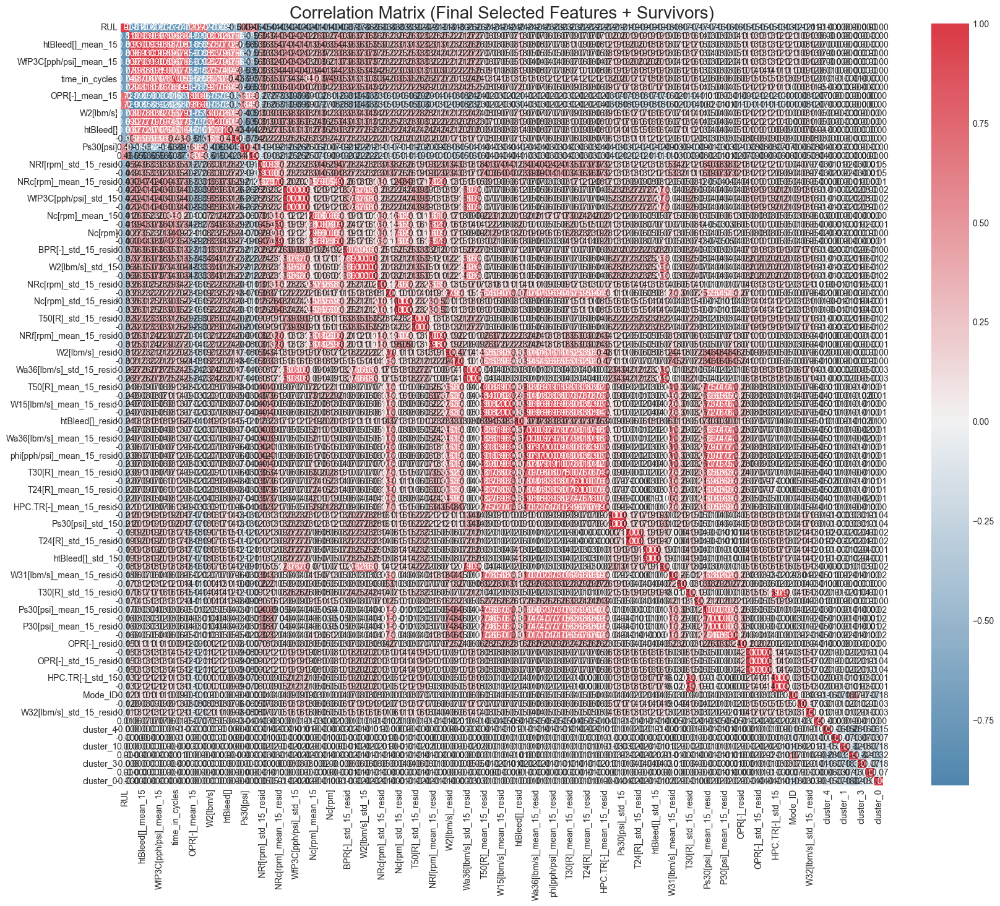

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# ---------------------------------------------------------
# 1. 수동 Feature Selection (사용자 정의 리스트)
# ---------------------------------------------------------
math_duplicates_strategy_B = [
    'P30[psi]',     # OPR[-]이 더 강건하므로 원본 P30 삭제
    'T30[R]',       # HPC.TR[-]이 효율 지표이므로 원본 T30 삭제
    
    # 메타 데이터 성격 (나중에 resid 청소용으로도 쓰임)
    'condition',    
    'condition_id', 
    'cluster',      

    # 물리적 중복
    'NRc[rpm]',   # Nc와 중복
    'NRf[rpm]',   # Nf와 중복
    'Nf[rpm]',    # Nc가 더 중요함
    
    # 유량 파생
    'W15[lbm/s]', 
    'W24[lbm/s]', 
    'W31[lbm/s]', 
    'W32[lbm/s]', 
    'Wa36[lbm/s]',
    
    # 기타 파생
    'BPR[-]', 
    'phi[pph/psi]', 
    
    # 중요도 낮음
    'LPC.TR[-]', 
    'T24[R]' , 
    
    # 관계성 높은 컬럼 삭제
    'Wf[pph]',

    # 문자열 컬럼 삭제
    'cond_str'
]

# 1-1. 원본 컬럼 삭제 실행
train_norm = train_norm.drop(columns=math_duplicates_strategy_B, errors='ignore').copy()
print(f"✅ 1차 수동 삭제 완료. (남은 컬럼: {len(train_norm.columns)}개)")

# ---------------------------------------------------------
# 2. [통합] 파생 변수(_resid, _mean, _std) 자동 청소
# ---------------------------------------------------------
print("\n🧹 파생 변수(Residual, Mean, Std) 청소 시작...")

# 학습에 사용하지 않을 메타데이터 (이들의 파생변수도 삭제 대상)
non_training_cols = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 'Mode_ID']

# 현재 살아남은 컬럼 목록
current_cols = train_norm.columns.tolist()

# 삭제할 파생 변수들을 담을 리스트
deriv_to_drop = []

for col in current_cols:
    parent_name = None
    
    # (1) 변수 타입 확인 및 부모 이름 추출
    if col.endswith('_resid'):
        parent_name = col.replace('_resid', '')
        
    elif '_mean_' in col:  # 예: T24[R]_mean_10
        parent_name = col.split('_mean_')[0]
        
    elif '_std_' in col:   # 예: T24[R]_std_10
        parent_name = col.split('_std_')[0]
        
    elif col.endswith('_std'): # 혹시 모를 예외 처리 (window 없는 경우)
        parent_name = col.replace('_std', '')

    # (2) 삭제 조건 검사
    if parent_name:
        # 조건 A: 부모가 현재 DataFrame에 없는 경우 (이미 삭제됨) -> 고아 변수 삭제
        # (주의: parent_name 자체가 current_cols에 있어야 '살아있는 부모'임)
        is_orphan = parent_name not in current_cols
        
        # 조건 B: 부모가 메타데이터인 경우 (unit_number_mean_10 등) -> 삭제
        is_metadata_deriv = parent_name in non_training_cols
        
        if is_orphan or is_metadata_deriv:
            deriv_to_drop.append(col)

# 2-1. 파생 변수 일괄 삭제
if deriv_to_drop:
    train_norm = train_norm.drop(columns=deriv_to_drop, errors='ignore')
    print(f"   🗑️ 불필요한 파생 변수 {len(deriv_to_drop)}개 삭제 완료.")
    # 디버깅용 출력 (너무 많으면 주석 처리)
    if len(deriv_to_drop) < 20:
        print(f"      목록: {deriv_to_drop}")
    else:
        print(f"      목록(일부): {deriv_to_drop[:5]} ...")
else:
    print("   ✨ 삭제할 파생 변수가 없습니다.")

print(f"✅ 최종 컬럼 정리 완료. (총 {len(train_norm.columns)}개)")

# ---------------------------------------------------------
# 3. 히트맵 그리기 (최종 검증)
# ---------------------------------------------------------
print("-" * 60)
print("🛑 최종 히트맵 확인:")



plt.figure(figsize=(20, 16))
cmap = sns.diverging_palette(240, 10, as_cmap=True) # 쿨웜 계열 (Blue-Red)

# 상관계수 계산 (수치형만)
corr_mat = train_norm.corr(numeric_only=True)

# RUL 기준 정렬 (가장 중요한 변수가 위로 오도록)
if 'RUL' in corr_mat.columns:
    sorted_idx = corr_mat['RUL'].abs().sort_values(ascending=False).index
    corr_mat = corr_mat.loc[sorted_idx, sorted_idx]

sns.heatmap(corr_mat, cmap=cmap, center=0, annot=True, fmt='.2f', square=True)
plt.title("Correlation Matrix (Final Selected Features + Survivors)", fontsize=20)
plt.show()

In [31]:
# ---------------------------------------------------------
#  최종 모델 학습용 Feature 확정
# ---------------------------------------------------------

# 1. 모델이 오해할 수 있는 '숫자형 카테고리' 및 '식별자' 제거
cols_to_exclude_from_model = [
    'unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 
    'Mode_ID'        # <--- 제거!
]

# 2. 최종 컬럼만 남기기
train_norm = train_norm 

final_features = [c for c in train_norm.columns if c not in cols_to_exclude_from_model]
final_features.sort()

print(f"✅ 모델 학습에 들어갈 최종 Feature ({len(final_features)}개):")
print(final_features)


required_onehot = ['cluster_0', 'cluster_1', 'cluster_2', 'cluster_3', 'cluster_4', 'cluster_5']
missing_onehot = [c for c in required_onehot if c not in final_features]

if not missing_onehot:
    print("\n👍 [검증 성공] One-Hot 컬럼(cluster_0~5)이 완벽하게 포함되었습니다.")
else:
    print(f"\n⚠️ [주의] One-Hot 컬럼이 누락되었습니다: {missing_onehot}")

✅ 모델 학습에 들어갈 최종 Feature (85개):
['BPR[-]_mean_15_resid', 'BPR[-]_std_15_resid', 'HPC.TR[-]', 'HPC.TR[-]_mean_15', 'HPC.TR[-]_mean_15_resid', 'HPC.TR[-]_resid', 'HPC.TR[-]_std_15', 'HPC.TR[-]_std_15_resid', 'LPC.TR[-]_mean_15_resid', 'LPC.TR[-]_std_15_resid', 'NRc[rpm]_mean_15_resid', 'NRc[rpm]_std_15_resid', 'NRf[rpm]_mean_15_resid', 'NRf[rpm]_std_15_resid', 'Nc[rpm]', 'Nc[rpm]_mean_15', 'Nc[rpm]_mean_15_resid', 'Nc[rpm]_resid', 'Nc[rpm]_std_15', 'Nc[rpm]_std_15_resid', 'Nf[rpm]_mean_15_resid', 'Nf[rpm]_std_15_resid', 'OPR[-]', 'OPR[-]_mean_15', 'OPR[-]_mean_15_resid', 'OPR[-]_resid', 'OPR[-]_std_15', 'OPR[-]_std_15_resid', 'P30[psi]_mean_15_resid', 'P30[psi]_std_15_resid', 'Ps30[psi]', 'Ps30[psi]_mean_15', 'Ps30[psi]_mean_15_resid', 'Ps30[psi]_resid', 'Ps30[psi]_std_15', 'Ps30[psi]_std_15_resid', 'T24[R]_mean_15_resid', 'T24[R]_std_15_resid', 'T30[R]_mean_15_resid', 'T30[R]_std_15_resid', 'T50[R]', 'T50[R]_mean_15', 'T50[R]_mean_15_resid', 'T50[R]_resid', 'T50[R]_std_15', 'T50[R]_std_1

## GroupShuffleSplit을 적용해 train_data와 test_data를 구분
이 데이터 셋은 시계열 데이터이기 때문에 data leakage를 방지하기 위해 GroupShuffleSplit을 사용한다.

In [32]:
from sklearn.model_selection import GroupShuffleSplit

# ---------------------------------------------------------
# [수정] Feature 목록 자동 추출 및 데이터 분할
# ---------------------------------------------------------

# 1. 제외할 메타 데이터 컬럼 명시
# (모델이 학습하면 안 되는 정답지나 식별자들)
cols_to_exclude = ['unit_number', 'time_in_cycles', 'RUL', 'max_cycle', 'Mode_ID']

# 2. 최종 학습용 Feature 리스트 자동 생성
# train_norm에는 이미 우리가 선택한 컬럼들만 남겨져 있거나 정리된 상태입니다.
# 따라서 메타 데이터만 빼면 그게 곧 학습용 Feature입니다.
final_features = [c for c in train_norm.columns if c not in cols_to_exclude]
final_features.sort() # 컬럼 순서 고정 (모델 재현성 위해 필수)

# 3. X(문제지), y(정답지), groups(그룹) 정의
X = train_norm[final_features]
y = train_norm['RUL']
groups = train_norm['unit_number']

# 4. GroupShuffleSplit으로 데이터 분할
# (엔진 단위로 쪼개야 Data Leakage가 없습니다. 단순 랜덤 셔플 금지!)
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=42)
train_idx, val_idx = next(gss.split(X, y, groups))

# 5. Train / Validation 데이터셋 생성
X_train, X_val = X.iloc[train_idx], X.iloc[val_idx]
y_train, y_val = y.iloc[train_idx], y.iloc[val_idx]

# ---------------------------------------------------------
# [결과 리포트]
# ---------------------------------------------------------
print(f"🚀 학습 데이터 준비 완료!")
print(f"   - 훈련 데이터(X_train) 크기: {X_train.shape}")
print(f"   - 검증 데이터(X_val)   크기: {X_val.shape}")
print("-" * 40)
print(f"   - 훈련에 사용된 엔진 수: {groups.iloc[train_idx].nunique()}개 unit")
print(f"   - 검증에 사용된 엔진 수: {groups.iloc[val_idx].nunique()}개 unit")
print("-" * 40)
print(f"   - 최종 Feature 개수: {len(final_features)}개")
print(f"   - Feature 예시 (Top 5): {final_features[:5]}")

# One-Hot Encoding 체크
if any('cluster' in col for col in final_features):
    print("✅ One-Hot Feature (cluster_0~5) 포함됨.")
else:
    print("⚠️ 주의: Cluster One-Hot 정보가 없습니다. (의도한 것이라면 OK)")

🚀 학습 데이터 준비 완료!
   - 훈련 데이터(X_train) 크기: (43464, 85)
   - 검증 데이터(X_val)   크기: (10295, 85)
----------------------------------------
   - 훈련에 사용된 엔진 수: 208개 unit
   - 검증에 사용된 엔진 수: 52개 unit
----------------------------------------
   - 최종 Feature 개수: 85개
   - Feature 예시 (Top 5): ['BPR[-]_mean_15_resid', 'BPR[-]_std_15_resid', 'HPC.TR[-]', 'HPC.TR[-]_mean_15', 'HPC.TR[-]_mean_15_resid']
✅ One-Hot Feature (cluster_0~5) 포함됨.


In [33]:
train_norm.columns.tolist()

['unit_number',
 'time_in_cycles',
 'T50[R]',
 'Nc[rpm]',
 'Ps30[psi]',
 'htBleed[]',
 'HPC.TR[-]',
 'OPR[-]',
 'W2[lbm/s]',
 'WfP3C[pph/psi]',
 'Mode_ID',
 'cluster_0',
 'cluster_1',
 'cluster_2',
 'cluster_3',
 'cluster_4',
 'cluster_5',
 'cluster_6',
 'RUL',
 'T50[R]_mean_15',
 'T50[R]_std_15',
 'Nc[rpm]_mean_15',
 'Nc[rpm]_std_15',
 'Ps30[psi]_mean_15',
 'Ps30[psi]_std_15',
 'htBleed[]_mean_15',
 'htBleed[]_std_15',
 'HPC.TR[-]_mean_15',
 'HPC.TR[-]_std_15',
 'OPR[-]_mean_15',
 'OPR[-]_std_15',
 'W2[lbm/s]_mean_15',
 'W2[lbm/s]_std_15',
 'WfP3C[pph/psi]_mean_15',
 'WfP3C[pph/psi]_std_15',
 'T50[R]_resid',
 'Nc[rpm]_resid',
 'Ps30[psi]_resid',
 'htBleed[]_resid',
 'HPC.TR[-]_resid',
 'OPR[-]_resid',
 'W2[lbm/s]_resid',
 'WfP3C[pph/psi]_resid',
 'T24[R]_mean_15_resid',
 'T24[R]_std_15_resid',
 'T30[R]_mean_15_resid',
 'T30[R]_std_15_resid',
 'T50[R]_mean_15_resid',
 'T50[R]_std_15_resid',
 'P30[psi]_mean_15_resid',
 'P30[psi]_std_15_resid',
 'Nf[rpm]_mean_15_resid',
 'Nf[rpm]_std_15_

In [34]:
# ---------------------------------------------------------
# 1. 학습 제외 대상 (메타데이터 + 정답지)
# ---------------------------------------------------------
cols_to_exclude = [
    'unit_number', 
    'time_in_cycles', 
    'RUL', 
    'max_cycle', 
    'Mode_ID',     # 학습 금지 (정답과 유사)
    'cond_str'     # 문자열 (에러 유발)
]

# ---------------------------------------------------------
# 2. 최종 Feature 자동 추출 (숫자형만 엄선)
# ---------------------------------------------------------
# train_norm에서 제외 대상을 빼고, 오직 '숫자(Number)' 타입인 것만 골라냅니다.
final_features = [
    c for c in train_norm.columns 
    if c not in cols_to_exclude 
    and np.issubdtype(train_norm[c].dtype, np.number)
]
final_features.sort()

# ---------------------------------------------------------
# 3. 카테고리별 분류 및 출력
# ---------------------------------------------------------
print(f"🚀 [최종 확인] 모델 학습에 사용될 Feature 총 개수: {len(final_features)}개\n")

# (1) 잔차(Residual) 변수
feat_resid = [c for c in final_features if '_resid' in c]
print(f"📌 [1] 잔차(Residual) 변수 ({len(feat_resid)}개):")
print(f"    {feat_resid}")

# (2) 클러스터(One-Hot) 변수
feat_cluster = [c for c in final_features if 'cluster' in c]
print(f"\n📌 [2] 클러스터/조건 변수 ({len(feat_cluster)}개):")
print(f"    {feat_cluster}")

# (3) 핵심 물리 센서 (나머지)
feat_sensor = [c for c in final_features if c not in feat_resid and c not in feat_cluster]
print(f"\n📌 [3] 핵심 물리 센서 ({len(feat_sensor)}개):")
print(f"    {feat_sensor}")

# ---------------------------------------------------------
# 4. [안전 장치] 데이터 무결성 검사 (매우 중요!)
# ---------------------------------------------------------
print("\n" + "="*50)
print("🛡️ 데이터 무결성(Safety) 긴급 점검")
print("="*50)

# 학습용 데이터셋 임시 생성
X_check = train_norm[final_features]

# 1. 결측치(NaN) 확인
nan_count = X_check.isna().sum().sum()
if nan_count > 0:
    print(f"🚨 [경고] 데이터에 결측치(NaN)가 {nan_count}개 있습니다! (XGBoost는 괜찮지만 확인 필요)")
    # 어떤 컬럼인지 확인
    print(X_check.columns[X_check.isna().any()].tolist())
else:
    print("✅ [통과] 결측치(NaN) 없음.")

# 2. 무한대(Inf) 확인
inf_count = np.isinf(X_check).sum().sum()
if inf_count > 0:
    print(f"🚨 [위험] 데이터에 무한대(Inf) 값이 {inf_count}개 있습니다! (모델 에러 원인)")
else:
    print("✅ [통과] 무한대(Inf) 값 없음.")

# 3. 데이터 타입 확인 (문자열 섞여있는지)
non_numeric = X_check.select_dtypes(exclude=[np.number]).columns
if len(non_numeric) > 0:
    print(f"🚨 [에러] 숫자형이 아닌 컬럼이 포함되어 있습니다: {non_numeric.tolist()}")
else:
    print("✅ [통과] 모든 Feature가 숫자형(int/float)입니다.")

print("\n🎉 모든 점검이 완료되었습니다. 학습을 시작하셔도 좋습니다!")

🚀 [최종 확인] 모델 학습에 사용될 Feature 총 개수: 85개

📌 [1] 잔차(Residual) 변수 (54개):
    ['BPR[-]_mean_15_resid', 'BPR[-]_std_15_resid', 'HPC.TR[-]_mean_15_resid', 'HPC.TR[-]_resid', 'HPC.TR[-]_std_15_resid', 'LPC.TR[-]_mean_15_resid', 'LPC.TR[-]_std_15_resid', 'NRc[rpm]_mean_15_resid', 'NRc[rpm]_std_15_resid', 'NRf[rpm]_mean_15_resid', 'NRf[rpm]_std_15_resid', 'Nc[rpm]_mean_15_resid', 'Nc[rpm]_resid', 'Nc[rpm]_std_15_resid', 'Nf[rpm]_mean_15_resid', 'Nf[rpm]_std_15_resid', 'OPR[-]_mean_15_resid', 'OPR[-]_resid', 'OPR[-]_std_15_resid', 'P30[psi]_mean_15_resid', 'P30[psi]_std_15_resid', 'Ps30[psi]_mean_15_resid', 'Ps30[psi]_resid', 'Ps30[psi]_std_15_resid', 'T24[R]_mean_15_resid', 'T24[R]_std_15_resid', 'T30[R]_mean_15_resid', 'T30[R]_std_15_resid', 'T50[R]_mean_15_resid', 'T50[R]_resid', 'T50[R]_std_15_resid', 'W15[lbm/s]_mean_15_resid', 'W15[lbm/s]_std_15_resid', 'W24[lbm/s]_mean_15_resid', 'W24[lbm/s]_std_15_resid', 'W2[lbm/s]_mean_15_resid', 'W2[lbm/s]_resid', 'W2[lbm/s]_std_15_resid', 'W31[lbm/s]_

## 테스트 데이터 생성 (train 데이터 와 동일하게 컬럼 라벨링, Feature Engineering, 마지막 사이클만 추출 해서 정답과 비교)
* 이 시점에서는 스케일링을 하지 않는다. autogluon에서 스케일링이 안된 데이터가 입력되게 하기위해서이다.   
autogluon은 전처리도 직접 진행한다.    
따라서 다른 모델을 학습시키는 셀에서 각각 개별로 pipeline을 이용해 결측치 처리 및 스케일링을 진행한다.   

* 테스트 데이터와 시각화 데이터는 생성할때 전처리, 노이즈 제거,feature engineering 모두 트레인 데이터와 동일하게 mode_id의 이봉 분포 분리, 등의 모든 작업을 수행한다.

In [35]:
# =========================================================
# Step 12. 테스트 데이터 생성 (Train과 100% 동일 전처리)
# =========================================================
# 파이프라인: 센서 매핑 → 물리 파생변수 → Hard Clustering →
#            Mode 분할(C2,C3: farB / C6: T24) → 조건별 정규화 →
#            상수 컬럼 삭제 → Residual Feature → Low-Var/Low-Corr Drop →
#            Last Row 추출 → X_test, y_test 반환
#
# ❌ Smoothing 없음 (Input 스무딩 금지!)
# ❌ fillna(0) 최소화 (ffill/bfill 우선)
# =========================================================

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans

def prepare_test_data(test_df, train_df, train_stats, final_features):
    """
    Parameters:
        test_df       : 원본 test 데이터 (센서 매핑 전)
        train_df      : 원본 train 데이터 (센서 매핑 + 파생변수 생성 완료 상태)
        train_stats   : step3에서 반환된 condition_id별 mean/std 통계
        final_features: Cell 56에서 확정된 학습용 Feature 리스트 (24개)
    
    Returns:
        X_test : (259, len(final_features)) — 모델 입력용
        y_test : (259,) — 정답 RUL
    """
    print("🚀 Test Data 전처리 시작 (Hard Clustering Pipeline)...")
    tw = test_df.copy()

    # ==========================================================
    # [Step A] 센서 매핑 (Train Cell 12와 100% 동일)
    # ==========================================================
    sensor_mapping = {
        'sensor_1': 'T2[R]',          'sensor_2': 'T24[R]',        'sensor_3': 'T30[R]', 
        'sensor_4': 'T50[R]',         'sensor_5': 'P2[psi]',       'sensor_6': 'P15[psi]', 
        'sensor_7': 'P30[psi]',       'sensor_8': 'Nf[rpm]',       'sensor_9': 'Nc[rpm]', 
        'sensor_10': 'epr[-]',        'sensor_11': 'phi[pph/psi]', 'sensor_12': 'Ps30[psi]',
        'sensor_13': 'NRf[rpm]',      'sensor_14': 'NRc[rpm]',     'sensor_15': 'BPR[-]',
        'sensor_16': 'farB[-]',       'sensor_17': 'htBleed[]',    'sensor_18': 'Nf_dmd[rpm]',
        'sensor_19': 'PCNfR_dmd[Pct]','sensor_20': 'W31[lbm/s]',   'sensor_21': 'W32[lbm/s]',
        'op_setting_1': 'Alt[kft]',   'op_setting_2': 'Mn[-]',     'op_setting_3': 'TLA[deg]'
    }
    rename_map = {k: v for k, v in sensor_mapping.items() if k in tw.columns}
    tw.rename(columns=rename_map, inplace=True)
    print("   [A] 센서 매핑 완료")

    # ==========================================================
    # [Step B] 물리 파생변수 생성 (Train Cell 13/14와 100% 동일)
    # ==========================================================
    t2_safe = tw['T2[R]'].replace(0, 518.67)
    farb_safe = tw['farB[-]'].replace(0, 0.0001)

    tw["P50[psi]"]       = tw["epr[-]"] * tw["P2[psi]"]
    tw["Fan.PR[-]"]      = tw["P15[psi]"] / tw["P2[psi]"]
    tw["LPC.TR[-]"]      = tw["T24[R]"] / t2_safe
    tw["HPC.TR[-]"]      = tw["T30[R]"] / tw["T24[R]"]
    tw["OPR[-]"]         = tw["P30[psi]"] / tw["P2[psi]"]
    tw["Wf[pph]"]        = tw["phi[pph/psi]"] * tw["Ps30[psi]"]
    tw["Wa36[lbm/s]"]    = tw["Wf[pph]"] / 3600.0 / farb_safe
    tw["W24[lbm/s]"]     = tw["Wa36[lbm/s]"] + tw["W31[lbm/s]"] + tw["W32[lbm/s]"]
    tw["W15[lbm/s]"]     = tw["W24[lbm/s]"] * tw["BPR[-]"]
    tw["W2[lbm/s]"]      = tw["W15[lbm/s]"] + tw["W24[lbm/s]"]
    tw["WfP3C[pph/psi]"] = tw["phi[pph/psi]"] / np.sqrt(t2_safe / 518.67)
    print("   [B] 물리 파생변수 생성 완료 (11개)")

    # ==========================================================
    # [Step C] Hard Clustering (Train Cell 23과 100% 동일)
    # ==========================================================
    # Train에서 사용한 것과 동일한 반올림 규칙
    tw['r_alt']  = tw['Alt[kft]'].round(-1)
    tw['r_mach'] = tw['Mn[-]'].round(2)
    tw['r_tra']  = tw['TLA[deg]'].round(0)
    tw['cond_str'] = (tw['r_alt'].astype(str) + "_" + 
                      tw['r_mach'].astype(str) + "_" + 
                      tw['r_tra'].astype(str))

    # Train에서 만든 cond_map을 재구축 (정렬 순서 동일해야 함!)
    train_temp = train_df.copy()
    train_temp['r_alt']  = train_temp['Alt[kft]'].round(-1)
    train_temp['r_mach'] = train_temp['Mn[-]'].round(2)
    train_temp['r_tra']  = train_temp['TLA[deg]'].round(0)
    train_temp['cond_str'] = (train_temp['r_alt'].astype(str) + "_" + 
                              train_temp['r_mach'].astype(str) + "_" + 
                              train_temp['r_tra'].astype(str))
    
    conditions = sorted(train_temp['cond_str'].unique())
    cond_map = {c: i for i, c in enumerate(conditions)}
    
    # Test에 매핑 (Train에 없는 조건은 가장 가까운 것으로 할당)
    tw['cluster'] = tw['cond_str'].map(cond_map)
    unmapped = tw['cluster'].isna()
    if unmapped.sum() > 0:
        print(f"   ⚠️ Train에 없는 조건 {unmapped.sum()}행 → 최빈 클러스터로 대체")
        tw.loc[unmapped, 'cluster'] = train_temp['cond_str'].map(cond_map).mode()[0]
    tw['cluster'] = tw['cluster'].astype(int)
    print(f"   [C] Hard Clustering 완료 (조건 {len(conditions)}개)")

    # ==========================================================
    # [Step D] Mode 분할 — C2, C3: farB 기준 / C6: T24 기준
    #          (Train Cell 23의 Multi-Mode 로직과 100% 동일)
    # ==========================================================
    tw['Mode_ID'] = 0
    train_temp['Mode_ID'] = 0

    for c_id in sorted(tw['cluster'].unique()):
        mask_tr = (train_temp['cluster'] == cond_map.get(
            train_temp.loc[train_temp['cluster'] == c_id, 'cond_str'].iloc[0], c_id
        )) if False else (train_temp['cond_str'].map(cond_map) == c_id)
        mask_te = (tw['cluster'] == c_id)

        # [Case A] Cluster 2 & 3: farB 기준 분할
        if c_id in [2, 3]:
            target_col = 'farB[-]'
            if target_col in train_temp.columns and mask_tr.sum() > 10:
                vals_tr = train_temp.loc[mask_tr, target_col].values
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels_tr = km.fit_predict(vals_tr.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                if centers[1] < centers[0]:
                    labels_tr = 1 - labels_tr
                train_temp.loc[mask_tr, 'Mode_ID'] = labels_tr

                if mask_te.sum() > 0:
                    vals_te = tw.loc[mask_te, target_col].values
                    pred_te = km.predict(vals_te.reshape(-1, 1))
                    if centers[1] < centers[0]:
                        pred_te = 1 - pred_te
                    tw.loc[mask_te, 'Mode_ID'] = pred_te

        # [Case B] Cluster 6: T24 기준 분할
        elif c_id == 6:
            target_col = 'T24[R]'
            if target_col in train_temp.columns and mask_tr.sum() > 10:
                vals_tr = train_temp.loc[mask_tr, target_col].values
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels_tr = km.fit_predict(vals_tr.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                if centers[1] < centers[0]:
                    labels_tr = 1 - labels_tr
                train_temp.loc[mask_tr, 'Mode_ID'] = labels_tr

                if mask_te.sum() > 0:
                    vals_te = tw.loc[mask_te, target_col].values
                    pred_te = km.predict(vals_te.reshape(-1, 1))
                    if centers[1] < centers[0]:
                        pred_te = 1 - pred_te
                    tw.loc[mask_te, 'Mode_ID'] = pred_te

    # condition_id 생성
    tw['condition_id'] = tw['cluster'] * 10 + tw['Mode_ID']
    train_temp['condition_id'] = train_temp['cond_str'].map(cond_map) * 10 + train_temp['Mode_ID']
    print(f"   [D] Mode 분할 완료 (condition_id: {sorted(tw['condition_id'].unique())})")

    # ==========================================================
    # [Step E] 조건별 정규화 (Train 통계 사용, ❌ Smoothing 없음)
    # ==========================================================
    # train_stats는 step3에서 반환된 condition_id별 mean/std
    # SENSOR_FEATURES 전체에 대해 정규화
    RAW_SENSORS = [
        'T2[R]', 'T24[R]', 'T30[R]', 'T50[R]', 'P2[psi]', 'P15[psi]', 'P30[psi]',
        'Nf[rpm]', 'Nc[rpm]', 'epr[-]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]',
        'NRc[rpm]', 'BPR[-]', 'farB[-]', 'htBleed[]', 'Nf_dmd[rpm]',
        'PCNfR_dmd[Pct]', 'W31[lbm/s]', 'W32[lbm/s]'
    ]
    DERIVED_SENSORS = [
        "P50[psi]", "Fan.PR[-]", "LPC.TR[-]", "HPC.TR[-]", "OPR[-]",
        "Wf[pph]", "Wa36[lbm/s]", "W24[lbm/s]", "W15[lbm/s]", "W2[lbm/s]", "WfP3C[pph/psi]"
    ]
    ALL_SENSORS = [c for c in RAW_SENSORS + DERIVED_SENSORS if c in tw.columns]

    print("   [E] 조건별 정규화 중...")
    for col in ALL_SENSORS:
        if col in train_stats.columns.get_level_values(0):
            means = tw['condition_id'].map(train_stats[col]['mean'])
            stds  = tw['condition_id'].map(train_stats[col]['std'])
        else:
            # train_stats에 없는 컬럼은 전역 통계 사용
            means = train_temp[col].mean()
            stds  = train_temp[col].std()

        # NaN 대체 (Test에만 있는 condition_id)
        if isinstance(means, pd.Series):
            means.fillna(train_temp[col].mean() if col in train_temp.columns else 0, inplace=True)
            stds.fillna(train_temp[col].std() if col in train_temp.columns else 1, inplace=True)

        # 0분산 처리
        if isinstance(stds, pd.Series):
            is_constant = stds < 1e-9
            tw[col] = (tw[col] - means) / (stds + 1e-9)
            tw.loc[is_constant, col] = 0.0
        else:
            stds = max(stds, 1e-9)
            tw[col] = (tw[col] - means) / stds
        
        tw[col] = tw[col].clip(-4, 4)
    
    print("      정규화 완료 (clip [-4, 4])")
    # ==========================================================
    # [Step F] Lag Feature 생성Lag Feature 생성
    # ==========================================================
    # 주의: Train(Step 8-1)에서 15 윈도우를 썼다면 여기서도 반드시 15를 써야 합니다.
    # target_sensors: 정규화된 센서 컬럼들 추출
    target_sensors = [c for c in tw.columns if ('[' in c or 'sensor' in c) and 'resid' not in c and 'cluster' not in c]

    # add_lag_features 함수 호출 (Step 8-1에서 정의한 함수)
    # 원본(tw)을 덮어쓰지 않고 _mean_15, _std_15 컬럼을 옆에 추가합니다.
    tw = add_lag_features(tw, target_sensors, windows=[15])
    
    print(f"   [New] Lag Feature (Mean/Std) 생성 완료 (Columns: {tw.shape[1]})")

    # ==========================================================
    # [Step G] One-Hot Encoding (cluster_0 ~ cluster_6)
    # ==========================================================
    for i in range(max(tw['cluster'].max(), 6) + 1):
        tw[f'cluster_{i}'] = (tw['cluster'] == i).astype(int)
    print(f"   [F] One-Hot Encoding 완료 (cluster_0 ~ cluster_{tw['cluster'].max()})")

    # ==========================================================
    # [Step H] 상수형 컬럼 삭제 (Train Cell 43과 동일)
    # ==========================================================
    cols_to_drop = [
        'Alt[kft]', 'Fan.PR[-]', 'Mn[-]', 'Nf_dmd[rpm]', 'P15[psi]',
        'P2[psi]', 'P50[psi]', 'PCNfR_dmd[Pct]', 'T2[R]', 'TLA[deg]',
        'epr[-]', 'farB[-]'
    ]
    tw.drop(columns=[c for c in cols_to_drop if c in tw.columns], inplace=True, errors='ignore')
    print(f"   [G] 상수형 컬럼 {len(cols_to_drop)}개 삭제 완료")

    # ==========================================================
    # [Step I] Residual Feature 생성 (Train Cell 45와 동일)
    # ==========================================================
    exclude_keywords = ['cluster', 'condition', 'Mode', 'RUL', 'unit_number', 'cycle', 'cond_str']
    numeric_cols = tw.select_dtypes(include=[np.number]).columns
    sensor_cols_for_resid = [
        c for c in numeric_cols
        if ('sensor' in c or '[' in c)
        and not any(k in c for k in exclude_keywords)
        and '_resid' not in c  # 이미 resid인 것 제외
    ]
    
    for col in sensor_cols_for_resid:
        tw[f"{col}_resid"] = tw[col].abs()
    print(f"   [H] Residual Feature {len(sensor_cols_for_resid)}개 생성 완료")

    # ==========================================================
    # [Step J] Low-Var / Low-Corr 삭제용 컬럼 제거
    #          (Train에서 삭제된 r_alt, r_mach, r_tra 등)
    # ==========================================================
    cols_to_cleanup = ['r_alt', 'r_mach', 'r_tra']
    tw.drop(columns=[c for c in cols_to_cleanup if c in tw.columns], inplace=True, errors='ignore')

    # ==========================================================
    # [Step K] Last Row 추출 + RUL 라벨링
    # ==========================================================
    test_last = tw.groupby('unit_number').last().reset_index()
    
    # RUL 라벨 (rul_df) 병합
    rul_temp = rul_df.copy()
    if 'unit_number' not in rul_temp.columns:
        rul_temp.columns = ['RUL']
        rul_temp['unit_number'] = range(1, len(rul_temp) + 1)
    
    test_final = pd.merge(test_last, rul_temp[['unit_number', 'RUL']], on='unit_number', 
                          how='left', suffixes=('', '_label'))
    
    # RUL 컬럼 정리
    if 'RUL_label' in test_final.columns:
        test_final['RUL'] = test_final['RUL_label']
        test_final.drop(columns=['RUL_label'], inplace=True)

    # ==========================================================
    # [Step L] 최종 Feature 추출 (Train의 final_features와 동일)
    # ==========================================================
    # final_features에 있는데 test_final에 없는 컬럼 → 0으로 채움
    for col in final_features:
        if col not in test_final.columns:
            test_final[col] = 0
            print(f"   ⚠️ '{col}' 누락 → 0으로 채움")
    
    X_test = test_final[final_features].copy()
    y_test = test_final['RUL']
    
    # NaN 처리 (ffill 우선, 나머지만 0)
    X_test.fillna(method='ffill', inplace=True)
    X_test.fillna(method='bfill', inplace=True)
    X_test.fillna(0, inplace=True)

    # ==========================================================
    # 검증 리포트
    # ==========================================================
    print(f"\n✅ [Test Data 준비 완료]")
    print(f"   X_test shape   : {X_test.shape}")
    print(f"   y_test shape   : {y_test.shape}")
    print(f"   Feature 일치   : {list(X_test.columns) == final_features}")
    print(f"   NaN 잔여       : {X_test.isna().sum().sum()}")
    print(f"   y_test 범위    : [{y_test.min()}, {y_test.max()}]")
    
    return X_test, y_test

# =========================================================
# 실행
# =========================================================
X_test, y_test = prepare_test_data(test_df, train_df, train_stats, final_features)


🚀 Test Data 전처리 시작 (Hard Clustering Pipeline)...
   [A] 센서 매핑 완료
   [B] 물리 파생변수 생성 완료 (11개)
   [C] Hard Clustering 완료 (조건 7개)
   [D] Mode 분할 완료 (condition_id: [np.int64(0), np.int64(10), np.int64(20), np.int64(30), np.int64(31), np.int64(40), np.int64(50), np.int64(60), np.int64(61)])
   [E] 조건별 정규화 중...
      정규화 완료 (clip [-4, 4])
🛠️ Lag Feature 생성 중... (Windows: [15])
✅ 생성 완료. (총 컬럼 수: 114)
   [New] Lag Feature (Mean/Std) 생성 완료 (Columns: 114)
   [F] One-Hot Encoding 완료 (cluster_0 ~ cluster_6)
   [G] 상수형 컬럼 12개 삭제 완료
   [H] Residual Feature 93개 생성 완료

✅ [Test Data 준비 완료]
   X_test shape   : (259, 85)
   y_test shape   : (259,)
   Feature 일치   : True
   NaN 잔여       : 0
   y_test 범위    : [6, 194]


In [36]:
# =========================================================
# Step 13. test_working 전처리 + 시각화 함수 정의
# =========================================================
# 용도: ML 6종, AutoGluon, 앙상블에서 호출하여
#       특정 엔진의 RUL 예측 궤적 vs 실제 RUL을 비교
#
# Step 12는 마지막 1행(259개)만 추출하지만,
# 여기서는 전체 시계열을 유지하여 궤적 시각화가 가능하도록 함
#
# 파이프라인: 센서 매핑 → 물리 파생변수 → Hard Clustering →
#            Mode 분할 → 조건별 정규화 → 상수 삭제 →
#            Residual Feature → r_alt/r_mach/r_tra 삭제 →
#            RUL 라벨 붙이기 (전체 시계열)
#
# ❌ Smoothing 없음 (Input 스무딩 금지!)
# =========================================================

import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# ---------------------------------------------------------
# 1. test_working 생성 (전체 시계열 유지)
# ---------------------------------------------------------
def build_test_working(test_df, train_df, train_stats, final_features):
    """
    Test 데이터 전체 시계열에 대해 Train과 동일한 전처리를 적용합니다.
    
    Parameters:
        test_df        : 원본 test 데이터 (센서 매핑 전)
        train_df       : 원본 train 데이터 (센서 매핑 + 파생변수 완료 상태)
        train_stats    : step3에서 반환된 condition_id별 mean/std 통계
        final_features : Cell 56에서 확정된 학습용 Feature 리스트 (24개)
    
    Returns:
        test_working : 전체 시계열 DataFrame (ALL_FEATURES + RUL 포함)
    """
    print("🔧 test_working 생성 중 (전체 시계열, Hard Clustering Pipeline)...")
    tw = test_df.copy()

    # ==========================================================
    # [A] 센서 매핑
    # ==========================================================
    sensor_mapping = {
        'sensor_1': 'T2[R]',          'sensor_2': 'T24[R]',        'sensor_3': 'T30[R]', 
        'sensor_4': 'T50[R]',         'sensor_5': 'P2[psi]',       'sensor_6': 'P15[psi]', 
        'sensor_7': 'P30[psi]',       'sensor_8': 'Nf[rpm]',       'sensor_9': 'Nc[rpm]', 
        'sensor_10': 'epr[-]',        'sensor_11': 'phi[pph/psi]', 'sensor_12': 'Ps30[psi]',
        'sensor_13': 'NRf[rpm]',      'sensor_14': 'NRc[rpm]',     'sensor_15': 'BPR[-]',
        'sensor_16': 'farB[-]',       'sensor_17': 'htBleed[]',    'sensor_18': 'Nf_dmd[rpm]',
        'sensor_19': 'PCNfR_dmd[Pct]','sensor_20': 'W31[lbm/s]',   'sensor_21': 'W32[lbm/s]',
        'op_setting_1': 'Alt[kft]',   'op_setting_2': 'Mn[-]',     'op_setting_3': 'TLA[deg]'
    }
    rename_map = {k: v for k, v in sensor_mapping.items() if k in tw.columns}
    tw.rename(columns=rename_map, inplace=True)

    # ==========================================================
    # [B] 물리 파생변수 생성 (Train Cell 13/14와 동일)
    # ==========================================================
    t2_safe = tw['T2[R]'].replace(0, 518.67)
    farb_safe = tw['farB[-]'].replace(0, 0.0001)

    tw["P50[psi]"]       = tw["epr[-]"] * tw["P2[psi]"]
    tw["Fan.PR[-]"]      = tw["P15[psi]"] / tw["P2[psi]"]
    tw["LPC.TR[-]"]      = tw["T24[R]"] / t2_safe
    tw["HPC.TR[-]"]      = tw["T30[R]"] / tw["T24[R]"]
    tw["OPR[-]"]         = tw["P30[psi]"] / tw["P2[psi]"]
    tw["Wf[pph]"]        = tw["phi[pph/psi]"] * tw["Ps30[psi]"]
    tw["Wa36[lbm/s]"]    = tw["Wf[pph]"] / 3600.0 / farb_safe
    tw["W24[lbm/s]"]     = tw["Wa36[lbm/s]"] + tw["W31[lbm/s]"] + tw["W32[lbm/s]"]
    tw["W15[lbm/s]"]     = tw["W24[lbm/s]"] * tw["BPR[-]"]
    tw["W2[lbm/s]"]      = tw["W15[lbm/s]"] + tw["W24[lbm/s]"]
    tw["WfP3C[pph/psi]"] = tw["phi[pph/psi]"] / np.sqrt(t2_safe / 518.67)

    # ==========================================================
    # [C] Hard Clustering (Train과 동일한 반올림 규칙)
    # ==========================================================
    tw['r_alt']  = tw['Alt[kft]'].round(-1)
    tw['r_mach'] = tw['Mn[-]'].round(2)
    tw['r_tra']  = tw['TLA[deg]'].round(0)
    tw['cond_str'] = (tw['r_alt'].astype(str) + "_" + 
                      tw['r_mach'].astype(str) + "_" + 
                      tw['r_tra'].astype(str))

    # Train의 cond_map 재구축
    train_temp = train_df.copy()
    train_temp['r_alt']  = train_temp['Alt[kft]'].round(-1)
    train_temp['r_mach'] = train_temp['Mn[-]'].round(2)
    train_temp['r_tra']  = train_temp['TLA[deg]'].round(0)
    train_temp['cond_str'] = (train_temp['r_alt'].astype(str) + "_" + 
                              train_temp['r_mach'].astype(str) + "_" + 
                              train_temp['r_tra'].astype(str))
    
    conditions = sorted(train_temp['cond_str'].unique())
    cond_map = {c: i for i, c in enumerate(conditions)}
    
    tw['cluster'] = tw['cond_str'].map(cond_map)
    unmapped = tw['cluster'].isna()
    if unmapped.sum() > 0:
        most_common = train_temp['cond_str'].map(cond_map).mode()[0]
        tw.loc[unmapped, 'cluster'] = most_common
        print(f"   ⚠️ Train에 없는 조건 {unmapped.sum()}행 → 최빈 클러스터({most_common})로 대체")
    tw['cluster'] = tw['cluster'].astype(int)

    # ==========================================================
    # [D] Mode 분할 — C2, C3: farB / C6: T24 (Train Cell 23 동일)
    # ==========================================================
    tw['Mode_ID'] = 0
    train_temp['Mode_ID'] = 0

    # Train에서 cond_map 적용
    train_temp['cluster'] = train_temp['cond_str'].map(cond_map).astype(int)

    for c_id in sorted(tw['cluster'].unique()):
        mask_tr = (train_temp['cluster'] == c_id)
        mask_te = (tw['cluster'] == c_id)

        if c_id in [2, 3]:
            target_col = 'farB[-]'
            if target_col in train_temp.columns and mask_tr.sum() > 10:
                vals_tr = train_temp.loc[mask_tr, target_col].values
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels_tr = km.fit_predict(vals_tr.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                if centers[1] < centers[0]:
                    labels_tr = 1 - labels_tr
                train_temp.loc[mask_tr, 'Mode_ID'] = labels_tr

                if mask_te.sum() > 0:
                    vals_te = tw.loc[mask_te, target_col].values
                    pred_te = km.predict(vals_te.reshape(-1, 1))
                    if centers[1] < centers[0]:
                        pred_te = 1 - pred_te
                    tw.loc[mask_te, 'Mode_ID'] = pred_te

        elif c_id == 6:
            target_col = 'T24[R]'
            if target_col in train_temp.columns and mask_tr.sum() > 10:
                vals_tr = train_temp.loc[mask_tr, target_col].values
                km = KMeans(n_clusters=2, random_state=42, n_init=10)
                labels_tr = km.fit_predict(vals_tr.reshape(-1, 1))
                centers = km.cluster_centers_.reshape(-1)
                if centers[1] < centers[0]:
                    labels_tr = 1 - labels_tr
                train_temp.loc[mask_tr, 'Mode_ID'] = labels_tr

                if mask_te.sum() > 0:
                    vals_te = tw.loc[mask_te, target_col].values
                    pred_te = km.predict(vals_te.reshape(-1, 1))
                    if centers[1] < centers[0]:
                        pred_te = 1 - pred_te
                    tw.loc[mask_te, 'Mode_ID'] = pred_te

    tw['condition_id'] = tw['cluster'] * 10 + tw['Mode_ID']
    train_temp['condition_id'] = train_temp['cluster'] * 10 + train_temp['Mode_ID']

    # ==========================================================
    # [E] 조건별 정규화 (Train 통계 사용, ❌ Smoothing 없음!)
    # ==========================================================
    RAW_SENSORS = [
        'T2[R]', 'T24[R]', 'T30[R]', 'T50[R]', 'P2[psi]', 'P15[psi]', 'P30[psi]',
        'Nf[rpm]', 'Nc[rpm]', 'epr[-]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]',
        'NRc[rpm]', 'BPR[-]', 'farB[-]', 'htBleed[]', 'Nf_dmd[rpm]',
        'PCNfR_dmd[Pct]', 'W31[lbm/s]', 'W32[lbm/s]'
    ]
    DERIVED_SENSORS = [
        "P50[psi]", "Fan.PR[-]", "LPC.TR[-]", "HPC.TR[-]", "OPR[-]",
        "Wf[pph]", "Wa36[lbm/s]", "W24[lbm/s]", "W15[lbm/s]", "W2[lbm/s]", "WfP3C[pph/psi]"
    ]
    ALL_SENSORS = [c for c in RAW_SENSORS + DERIVED_SENSORS if c in tw.columns]

    for col in ALL_SENSORS:
        if col in train_stats.columns.get_level_values(0):
            means = tw['condition_id'].map(train_stats[col]['mean'])
            stds  = tw['condition_id'].map(train_stats[col]['std'])
        else:
            means = train_temp[col].mean()
            stds  = train_temp[col].std()

        if isinstance(means, pd.Series):
            means.fillna(train_temp[col].mean() if col in train_temp.columns else 0, inplace=True)
            stds.fillna(train_temp[col].std() if col in train_temp.columns else 1, inplace=True)

        if isinstance(stds, pd.Series):
            is_constant = stds < 1e-9
            tw[col] = (tw[col] - means) / (stds + 1e-9)
            tw.loc[is_constant, col] = 0.0
        else:
            stds = max(stds, 1e-9)
            tw[col] = (tw[col] - means) / stds
        
        tw[col] = tw[col].clip(-4, 4)

    # ----------------------------------------------------------
    # [F] Lag Feature 생성
    # ----------------------------------------------------------
    # 시각화용 데이터도 학습/테스트 데이터와 똑같은 구조(Lag Feature 포함)여야 함
    # Train(Step 8-1)과 동일하게 windows=[15] 설정 필수!
    
    target_sensors = [c for c in tw.columns if ('[' in c or 'sensor' in c) and 'resid' not in c and 'cluster' not in c]

    # add_lag_features 함수 호출 (Step 8-1에 정의됨)
    # 원본(tw)을 덮어쓰지 않고 _mean_15, _std_15 컬럼을 옆에 추가
    tw = add_lag_features(tw, target_sensors, windows=[15])
    
    print(f"   [New] Lag Feature (Mean/Std) 생성 완료 (Columns: {tw.shape[1]})")

    # ==========================================================
    # [G] One-Hot Encoding
    # ==========================================================
    for i in range(max(tw['cluster'].max(), 6) + 1):
        tw[f'cluster_{i}'] = (tw['cluster'] == i).astype(int)

    # ==========================================================
    # [H] 상수형 컬럼 삭제 (Train Cell 43 동일)
    # ==========================================================
    cols_to_drop = [
        'Alt[kft]', 'Fan.PR[-]', 'Mn[-]', 'Nf_dmd[rpm]', 'P15[psi]',
        'P2[psi]', 'P50[psi]', 'PCNfR_dmd[Pct]', 'T2[R]', 'TLA[deg]',
        'epr[-]', 'farB[-]'
    ]
    tw.drop(columns=[c for c in cols_to_drop if c in tw.columns], inplace=True, errors='ignore')

    # ==========================================================
    # [I] Residual Feature 생성 (Train Cell 45 동일)
    # ==========================================================
    exclude_keywords = ['cluster', 'condition', 'Mode', 'RUL', 'unit_number', 'cycle', 'cond_str']
    numeric_cols = tw.select_dtypes(include=[np.number]).columns
    sensor_cols_for_resid = [
        c for c in numeric_cols
        if ('sensor' in c or '[' in c)
        and not any(k in c for k in exclude_keywords)
        and '_resid' not in c
    ]
    
    for col in sensor_cols_for_resid:
        tw[f"{col}_resid"] = tw[col].abs()

    # ==========================================================
    # [J] 정리 (r_alt, r_mach, r_tra 삭제)
    # ==========================================================
    tw.drop(columns=['r_alt', 'r_mach', 'r_tra'], inplace=True, errors='ignore')

    # ==========================================================
    # [K] RUL 라벨 붙이기 (전체 시계열용)
    # ==========================================================
    # 각 엔진의 마지막 사이클 기준 RUL + 남은 사이클 수
    rul_temp = rul_df.copy()
    if 'unit_number' not in rul_temp.columns:
        rul_temp.columns = ['RUL']
        rul_temp['unit_number'] = range(1, len(rul_temp) + 1)
    
    max_cycles = tw.groupby('unit_number')['time_in_cycles'].transform('max')
    tw = tw.merge(rul_temp[['unit_number', 'RUL']], on='unit_number', 
                  how='left', suffixes=('', '_true'))
    
    rul_col = 'RUL_true' if 'RUL_true' in tw.columns else 'RUL'
    tw['RUL'] = tw[rul_col] + (max_cycles.values - tw['time_in_cycles'].values)
    if 'RUL_true' in tw.columns:
        tw.drop(columns=['RUL_true'], inplace=True)

    # ==========================================================
    # [L] final_features에 없는 컬럼 보충
    # ==========================================================
    for col in final_features:
        if col not in tw.columns:
            tw[col] = 0

    # NaN 처리 (시계열이므로 ffill 우선)
    tw.fillna(method='ffill', inplace=True)
    tw.fillna(method='bfill', inplace=True)
    tw.fillna(0, inplace=True)

    print(f"✅ test_working 완성: {tw.shape}")
    print(f"   final_features 포함 여부: {all(c in tw.columns for c in final_features)}")
    return tw


# ---------------------------------------------------------
# 2. 시각화 함수 정의
# ---------------------------------------------------------
def plot_engine_trajectory_v2(model_name, pipeline, test_full_df, unit_id, 
                               feature_cols, margin=0):
    """
    특정 엔진(unit_id)의 전체 시계열에 대해 RUL 예측 궤적을 시각화
    
    Parameters:
        model_name    : 모델 이름 (표시용)
        pipeline      : 학습 완료된 sklearn Pipeline
        test_full_df  : test_working (전체 시계열 + final_features + RUL 포함)
        unit_id       : 시각화할 엔진 번호
        feature_cols  : 학습에 사용된 Feature 리스트 (final_features)
        margin        : Safety Margin (기본 0, best_margin 전달 가능)
    """
    engine_data = test_full_df[test_full_df['unit_number'] == unit_id].copy()
    
    if len(engine_data) == 0:
        print(f"⚠️ Unit {unit_id} 데이터가 없습니다.")
        return

    X_engine = engine_data[feature_cols]
    y_true = engine_data['RUL']
    
    y_pred = pipeline.predict(X_engine)
    y_pred = y_pred + margin
    y_pred = np.maximum(y_pred, 0)

    plt.figure(figsize=(12, 5))
    plt.plot(engine_data['time_in_cycles'].values, y_true.values, 
             'r--', label='True RUL', linewidth=2)
    
    margin_label = f" (Margin {margin:+.0f})" if margin != 0 else ""
    plt.plot(engine_data['time_in_cycles'].values, y_pred, 
             'b-', label=f'Pred by {model_name}{margin_label}', alpha=0.8)
    
    plt.title(f"Unit #{unit_id} RUL Trajectory - {model_name}", fontsize=14)
    plt.xlabel("Time (Cycles)")
    plt.ylabel("RUL")
    plt.legend(fontsize=11)
    plt.grid(True, alpha=0.3)
    plt.tight_layout()
    plt.show()


def plot_multi_engine_comparison(model_name, pipeline, test_full_df, unit_ids, 
                                  feature_cols, margin=0, ncols=2):
    """
    여러 엔진의 RUL 궤적을 한 번에 비교 시각화
    
    Parameters:
        unit_ids : 시각화할 엔진 번호 리스트 (예: [1, 24, 50, 100])
        ncols    : 한 행에 표시할 그래프 수 (기본 2)
    """
    import math
    nrows = math.ceil(len(unit_ids) / ncols)
    fig, axes = plt.subplots(nrows, ncols, figsize=(7*ncols, 4*nrows))
    axes = np.array(axes).flatten() if len(unit_ids) > 1 else [axes]
    
    for idx, unit_id in enumerate(unit_ids):
        ax = axes[idx]
        engine_data = test_full_df[test_full_df['unit_number'] == unit_id].copy()
        
        if len(engine_data) == 0:
            ax.set_title(f"Unit #{unit_id} - No Data")
            continue

        X_engine = engine_data[feature_cols]
        y_true = engine_data['RUL'].values
        y_pred = pipeline.predict(X_engine) + margin
        y_pred = np.maximum(y_pred, 0)
        
        time = engine_data['time_in_cycles'].values
        ax.plot(time, y_true, 'r--', label='True RUL', linewidth=2)
        ax.plot(time, y_pred, 'b-', label=f'Pred', alpha=0.8)
        
        # 마지막 시점의 오차 표시
        last_err = y_pred[-1] - y_true[-1]
        color = 'red' if last_err > 0 else 'blue'
        ax.annotate(f'Err: {last_err:+.1f}', xy=(time[-1], y_pred[-1]),
                    fontsize=9, color=color, fontweight='bold')
        
        ax.set_title(f"Unit #{unit_id}", fontsize=12)
        ax.set_xlabel("Time (Cycles)")
        ax.set_ylabel("RUL")
        ax.legend(fontsize=9)
        ax.grid(True, alpha=0.3)
    
    # 빈 subplot 숨기기
    for idx in range(len(unit_ids), len(axes)):
        axes[idx].set_visible(False)
    
    margin_label = f" (Margin {margin:+.0f})" if margin != 0 else ""
    fig.suptitle(f"{model_name}{margin_label} - Multi-Engine RUL Trajectory", 
                 fontsize=15, fontweight='bold')
    plt.tight_layout()
    plt.show()


# ---------------------------------------------------------
# 3. 실행: test_working 생성
# ---------------------------------------------------------
test_working = build_test_working(test_df, train_df, train_stats, final_features)

print("\n📌 시각화 호출 예시:")
print("   # 단일 엔진")
print("   plot_engine_trajectory_v2('XGBoost', pipeline, test_working, 24, final_features, margin=best_margin)")
print()
print("   # 다중 엔진 비교")
print("   plot_multi_engine_comparison('XGBoost', pipeline, test_working, [1, 24, 50, 100], final_features)")


🔧 test_working 생성 중 (전체 시계열, Hard Clustering Pipeline)...
🛠️ Lag Feature 생성 중... (Windows: [15])
✅ 생성 완료. (총 컬럼 수: 114)
   [New] Lag Feature (Mean/Std) 생성 완료 (Columns: 114)
✅ test_working 완성: (33991, 200)
   final_features 포함 여부: True

📌 시각화 호출 예시:
   # 단일 엔진
   plot_engine_trajectory_v2('XGBoost', pipeline, test_working, 24, final_features, margin=best_margin)

   # 다중 엔진 비교
   plot_multi_engine_comparison('XGBoost', pipeline, test_working, [1, 24, 50, 100], final_features)


![nasa scoring 그래프.jpg](<attachment:nasa scoring 그래프.jpg>)
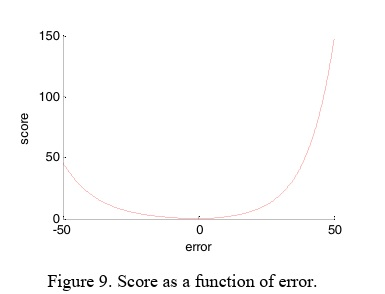

In [37]:
# Asymmetric Scoring 함수 정의

import numpy as np
import matplotlib.pyplot as plt

def compute_nasa_score(y_true, y_pred):
    """
    NASA C-MAPSS Asymmetric Scoring Function
    - Late Prediction (d > 0): Penalty grows fast (a2 = 10)
    - Early Prediction (d < 0): Penalty grows slower (a1 = 13)
    """
    d = y_pred - y_true
    # 벡터화 연산 (빠른 계산)
    scores = np.where(d < 0, np.exp(-d/13) - 1, np.exp(d/10) - 1)
    return np.sum(scores)

In [38]:
# [디버깅] 학습 데이터 최종 점검
print(f"학습용 Feature 개수: {len(final_features)}")
print(f"X_train shape: {X_train.shape}")
print(f"y_train (RUL) 상위 5개: \n{y_train[:5]}")

# 125로 클리핑 되었는지 재확인 (주석 수정함)
max_rul = y_train.max()
if max_rul > 125:
    print(f"🚨 경고: RUL 클리핑 실패! (최대값: {max_rul})")
else:
    print(f"✅ 확인: RUL이 {max_rul} (<= 120)로 잘 제한되었습니다.")

# Feature에 이상한게 섞여있는지 확인 (Data Leakage 방지)
forbidden_cols = ['unit_number', 'RUL', 'max_cycle', 'Mode_ID', 'cond_str']
invalid_cols = [c for c in final_features if c in forbidden_cols]

if invalid_cols:
    print(f"🚨 [치명적 오류] 정답지나 메타데이터가 입력 변수에 포함됨: {invalid_cols}")
else:
    print("✅ 확인: 입력 변수(X)에 정답지(RUL)나 식별자가 없습니다.")

학습용 Feature 개수: 85
X_train shape: (43464, 85)
y_train (RUL) 상위 5개: 
0    125
1    125
2    125
3    125
4    125
Name: RUL, dtype: int64
✅ 확인: RUL이 125 (<= 120)로 잘 제한되었습니다.
✅ 확인: 입력 변수(X)에 정답지(RUL)나 식별자가 없습니다.


## 모델링 (ML 6가지 모델, autogluon, 앙상블)

In [39]:
# =========================================================
# Step 15. 머신러닝 6종 모델 정의 + Optuna 하이퍼파라미터 튜닝
# =========================================================
# 모델 구성 (노이즈에 강한 모델 위주):
#   1. XGBoost        — NASA custom objective
#   2. LightGBM       — NASA custom objective
#   3. CatBoost       — Ordered Boosting (노이즈 최강)
#   4. ExtraTrees     — Random split (과적합 방지)
#   5. RandomForest   — Best split (앙상블 다양성)
#   6. HistGradientBoosting — sklearn 내장, 빈 처리 우수
#
# 삭제: KNN, SVR, Ridge (노이즈에 약함, FD-002 부적합)
# =========================================================

import optuna
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

# 모델 라이브러리
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from catboost import CatBoostRegressor
from sklearn.ensemble import (
    RandomForestRegressor, 
    ExtraTreesRegressor, 
    HistGradientBoostingRegressor
)

# =========================================================
# 0. NASA Scoring 관련 함수
# =========================================================

def nasa_custom_obj(y_true, y_pred):
    """
    XGBoost / LightGBM용 Custom Objective Function
    Late Prediction(d>0)에 가혹한 비대칭 페널티 적용
    """
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    d = y_pred - y_true

    grad = np.where(d < 0, 
                    -1/13 * np.exp(-d/13), 
                    1/10 * np.exp(d/10))
    hess = np.where(d < 0, 
                    1/169 * np.exp(-d/13), 
                    1/100 * np.exp(d/10))
    return grad, hess


def compute_nasa_score(y_true, y_pred):
    """NASA C-MAPSS Asymmetric Scoring Function"""
    d = np.array(y_pred) - np.array(y_true)
    scores = np.where(d < 0, np.exp(-d/13) - 1, np.exp(d/10) - 1)
    return np.sum(scores)

# =========================================================
# 1. 모델 생성 함수 (Optuna trial → 모델 객체)
# =========================================================
models = {}

def get_model_from_trial(trial, model_name):
    
    if model_name == 'XGBoost':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 200, 1200),
            'max_depth': trial.suggest_int('max_depth', 3, 9),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
            'min_child_weight': trial.suggest_int('min_child_weight', 1, 20),
            'n_jobs': -1, 
            'random_state': 42,
            'objective': nasa_custom_obj,
        }
        return XGBRegressor(**params)

    elif model_name == 'LightGBM':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 200, 1200),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'num_leaves': trial.suggest_int('num_leaves', 20, 120),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'min_child_samples': trial.suggest_int('min_child_samples', 5, 50),
            'subsample': trial.suggest_float('subsample', 0.6, 1.0),
            'colsample_bytree': trial.suggest_float('colsample_bytree', 0.5, 1.0),
            'reg_alpha': trial.suggest_float('reg_alpha', 1e-3, 10.0, log=True),
            'reg_lambda': trial.suggest_float('reg_lambda', 1e-3, 10.0, log=True),
            'verbose': -1, 
            'random_state': 42,
            'objective': nasa_custom_obj,
        }
        return LGBMRegressor(**params)

    elif model_name == 'CatBoost':
        params = {
            'iterations': trial.suggest_int('iterations', 200, 1200),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'depth': trial.suggest_int('depth', 4, 10),
            'l2_leaf_reg': trial.suggest_float('l2_leaf_reg', 1e-2, 30.0, log=True),
            'bagging_temperature': trial.suggest_float('bagging_temperature', 0.0, 1.0),
            'random_strength': trial.suggest_float('random_strength', 0.0, 2.0),
            'border_count': trial.suggest_int('border_count', 32, 255),
            'random_seed': 42,
            'verbose': 0,
            'loss_function': 'RMSE',
        }
        return CatBoostRegressor(**params)

    elif model_name == 'ExtraTrees':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 600),
            'max_depth': trial.suggest_int('max_depth', 8, 25),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'max_features': trial.suggest_float('max_features', 0.4, 1.0),
            'n_jobs': -1,
            'random_state': 42,
        }
        return ExtraTreesRegressor(**params)

    elif model_name == 'RandomForest':
        params = {
            'n_estimators': trial.suggest_int('n_estimators', 100, 600),
            'max_depth': trial.suggest_int('max_depth', 8, 25),
            'min_samples_split': trial.suggest_int('min_samples_split', 2, 15),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 1, 10),
            'max_features': trial.suggest_float('max_features', 0.4, 1.0),
            'n_jobs': -1,
            'random_state': 42,
        }
        return RandomForestRegressor(**params)

    elif model_name == 'HistGradientBoosting':
        params = {
            'max_iter': trial.suggest_int('max_iter', 200, 1200),
            'learning_rate': trial.suggest_float('learning_rate', 0.01, 0.2, log=True),
            'max_depth': trial.suggest_int('max_depth', 3, 12),
            'max_leaf_nodes': trial.suggest_int('max_leaf_nodes', 20, 120),
            'min_samples_leaf': trial.suggest_int('min_samples_leaf', 5, 50),
            'l2_regularization': trial.suggest_float('l2_regularization', 1e-3, 10.0, log=True),
            'max_bins': trial.suggest_int('max_bins', 64, 255),
            'random_state': 42,
        }
        return HistGradientBoostingRegressor(**params)

    return None

# =========================================================
# 2. Objective 함수 (3-Fold CV, NASA Score 최소화)
# =========================================================
def objective(trial, model_name):
    model = get_model_from_trial(trial, model_name)
    
    # CatBoost는 자체 스케일링이 있으므로 Pipeline 구성을 다르게 할 수도 있지만
    # 일관성을 위해 동일 Pipeline 사용
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    kf = KFold(n_splits=3, shuffle=True, random_state=42)
    scores = []

    for train_idx, val_idx in kf.split(X_train):
        X_tr = X_train.iloc[train_idx]
        X_vl = X_train.iloc[val_idx]
        y_tr = y_train.iloc[train_idx]
        y_vl = y_train.iloc[val_idx]
        
        pipeline.fit(X_tr, y_tr)
        pred = pipeline.predict(X_vl)
        pred = np.maximum(pred, 0)  # 음수 보정
        
        score = compute_nasa_score(y_vl, pred)
        scores.append(score)
        
    return np.mean(scores)

# =========================================================
# 3. 튜닝 실행
# =========================================================
target_models = [
    'XGBoost', 'LightGBM', 'CatBoost', 
    'ExtraTrees', 'RandomForest', 'HistGradientBoosting'
]

# 모델별 trial 수 설정
trial_config = {
    'XGBoost': 30,
    'LightGBM': 30,
    'CatBoost': 25,           # CatBoost는 학습이 느릴 수 있음
    'ExtraTrees': 25,
    'RandomForest': 25,
    'HistGradientBoosting': 25,
}

print("🚀 [Hyperparameter Tuning] NASA Scoring 기반 최적화 시작...")
print(f"   모델 {len(target_models)}종: {target_models}")
print(f"   Feature: {len(final_features)}개")
print(f"   Train 크기: {X_train.shape}")
print("=" * 60)

for name in target_models:
    n_trials = trial_config.get(name, 20)
    print(f"\n🔧 Tuning {name} ({n_trials} trials)...", end=" ")
    
    study = optuna.create_study(direction='minimize')
    optuna.logging.set_verbosity(optuna.logging.WARNING)
    
    study.optimize(lambda trial: objective(trial, name), n_trials=n_trials)
    
    print(f"-> Best NASA Score: {study.best_value:,.2f}")
    
    # 최적 모델 저장
    best_model = get_model_from_trial(study.best_trial, name)
    models[name] = best_model

print("\n" + "=" * 60)
print("✨ 모든 모델 튜닝 완료!")
print(f"   저장된 모델: {list(models.keys())}")
print("   이제 models 딕셔너리에서 각 모델을 꺼내 학습/평가할 수 있습니다.")

[I 2026-02-10 21:48:17,804] A new study created in memory with name: no-name-3b202539-fbc8-4168-9cf3-6d08c5b7d848


🚀 [Hyperparameter Tuning] NASA Scoring 기반 최적화 시작...
   모델 6종: ['XGBoost', 'LightGBM', 'CatBoost', 'ExtraTrees', 'RandomForest', 'HistGradientBoosting']
   Feature: 85개
   Train 크기: (43464, 85)

🔧 Tuning XGBoost (30 trials)... -> Best NASA Score: 36,180.84

🔧 Tuning LightGBM (30 trials)... -> Best NASA Score: 46,261.52

🔧 Tuning CatBoost (25 trials)... -> Best NASA Score: 36,151.96

🔧 Tuning ExtraTrees (25 trials)... -> Best NASA Score: 52,952.45

🔧 Tuning RandomForest (25 trials)... -> Best NASA Score: 75,402.75

🔧 Tuning HistGradientBoosting (25 trials)... -> Best NASA Score: 42,793.12

✨ 모든 모델 튜닝 완료!
   저장된 모델: ['XGBoost', 'LightGBM', 'CatBoost', 'ExtraTrees', 'RandomForest', 'HistGradientBoosting']
   이제 models 딕셔너리에서 각 모델을 꺼내 학습/평가할 수 있습니다.


🚀 예측 수행 중... (사용 Feature: 85개)
✅ XGBoost: 예측 완료
✅ LightGBM: 예측 완료
✅ CatBoost: 예측 완료
✅ ExtraTrees: 예측 완료
✅ RandomForest: 예측 완료
✅ HistGradientBoosting: 예측 완료

🏆 Best Safety Margin: -11
   NASA Score: 81,972
   (Margin=0 점수 134,903 대비 39.2% 개선)


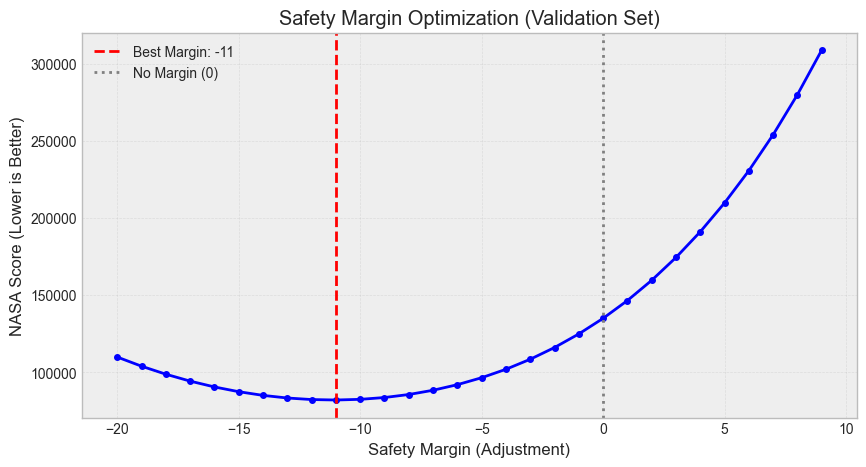

In [40]:
import numpy as np
import matplotlib.pyplot as plt  # <--- 이 부분이 수정되었습니다!
import pandas as pd              # pandas는 pd로 관례적으로 사용합니다.
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from xgboost import XGBRegressor

# ---------------------------------------------------------
# 0. 준비: 모델이 리스트(딕셔너리)에 없으면 포장하기
# ---------------------------------------------------------
if 'models' not in globals():
    print("ℹ️ 'models' 딕셔너리가 없어 현재 단일 모델로 설정합니다.")
    if 'model' not in globals():
        print("ℹ️ 'model' 변수가 없어 기본 XGBRegressor를 생성합니다.")
        model = XGBRegressor(n_estimators=100, max_depth=6, learning_rate=0.1, random_state=42, n_jobs=-1)
    models = {'MyModel': model}

# ---------------------------------------------------------
# 1. Validation 데이터로 모델 예측 수집
# ---------------------------------------------------------
val_preds_dict = {}
feature_cols = X_train.columns.tolist() 

print(f"🚀 예측 수행 중... (사용 Feature: {len(feature_cols)}개)")

for name, model_instance in models.items():
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model_instance)
    ])
    
    try:
        pipeline.fit(X_train, y_train)
        pred = pipeline.predict(X_val)
        val_preds_dict[name] = pred
        print(f"✅ {name}: 예측 완료")
    except Exception as e:
        print(f"⚠️ {name} 실패: {e}")

# ---------------------------------------------------------
# 2. 앙상블 예측 (단순 평균)
# ---------------------------------------------------------
if not val_preds_dict:
    raise ValueError("❌ 예측된 모델이 없습니다. 모델 정의를 확인해주세요.")

val_ensemble = np.mean(list(val_preds_dict.values()), axis=0)

# ---------------------------------------------------------
# 3. Safety Margin Grid Search
# ---------------------------------------------------------
def compute_nasa_score(y_true, y_pred):
    d = y_pred - y_true
    # d > 0 (Late Prediction)에 더 큰 패널티
    scores = np.where(d < 0, np.exp(-d/13) - 1, np.exp(d/10) - 1)
    return np.sum(scores)

margin_range = np.arange(-20, 10, 1)
margin_scores = []

for margin in margin_range:
    adjusted_pred = val_ensemble + margin
    adjusted_pred = np.maximum(adjusted_pred, 0)
    score = compute_nasa_score(y_val.values, adjusted_pred)
    margin_scores.append(score)

best_idx = np.argmin(margin_scores)
best_margin = margin_range[best_idx]
best_score = margin_scores[best_idx]

# 결과 분석
zero_idx = list(margin_range).index(0)
baseline_score = margin_scores[zero_idx]
improvement = (baseline_score - best_score) / baseline_score * 100

print(f"\n🏆 Best Safety Margin: {best_margin:+.0f}")
print(f"   NASA Score: {best_score:,.0f}")
print(f"   (Margin=0 점수 {baseline_score:,.0f} 대비 {improvement:.1f}% 개선)")

# ---------------------------------------------------------
# 4. 시각화 (정상 작동)
# ---------------------------------------------------------
plt.figure(figsize=(10, 5))
plt.plot(margin_range, margin_scores, 'b-o', markersize=4)
plt.axvline(best_margin, color='red', linestyle='--', label=f'Best Margin: {best_margin:+.0f}')
plt.axvline(0, color='gray', linestyle=':', label='No Margin (0)')

plt.xlabel('Safety Margin (Adjustment)')
plt.ylabel('NASA Score (Lower is Better)')
plt.title('Safety Margin Optimization (Validation Set)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

In [47]:
import matplotlib.pyplot as plt
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_squared_log_error

# =========================================================
# 🚀 [Phase 1] 최종 모델 성능 종합 평가 (Safety Margin -11 적용)
# =========================================================
print("\n🚀 [Phase 1] 최종 모델 성능 비교 시작 (NASA Score + 5대 지표)...")
print("*" * 110)
print(f"{'Model':<12} | {'NASA Score':<12} | {'RMSE':<10} | {'RMSLE':<10} | {'MAE':<10} | {'R2':<10}")
print("-" * 110)

# 1. NASA Asymmetric Score 함수 정의 (안전을 위해 여기서 재정의)
# (Late Prediction에 가중치를 두어 벌점을 매기는 공식)
def compute_nasa_score(y_true, y_pred):
    d = y_pred - y_true
    # d < 0 (Early Prediction): 페널티 작음 (exp(-d/13))
    # d > 0 (Late Prediction): 페널티 큼 (exp(d/10)) -> 고장났는데 안났다고 하면 큰일남!
    scores = np.where(d < 0, np.exp(-d/13)-1, np.exp(d/10)-1)
    return np.sum(scores)

results_list = []

# models 딕셔너리에 있는 모든 모델(Ridge, SVR, XGB 등)을 순회하며 평가
for name, model in models.items():
    # (1) 파이프라인 생성: 결측치처리 -> 스케일링 -> 모델
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    # (2) 전체 데이터로 재학습 (Optuna로 찾은 최적 파라미터 적용됨)
    pipeline.fit(X_train, y_train)
    
    # (3) 테스트 데이터(X_test) 예측
    # X_test는 각 엔진의 '마지막 시점' 데이터여야 합니다.
    y_pred = pipeline.predict(X_test)
    
    # 🔥 [핵심 전략] Safety Margin 적용 (Technique C)
    # 예측값에서 11을 빼서 "약간 일찍 고장난다고" 예측하게 만듦 -> Late Prediction 방지
    y_pred = y_pred - 11
    
    # (4) 음수 보정 (물리적으로 불가능한 값 제거 및 RMSLE 에러 방지)
    y_pred = np.maximum(y_pred, 0)
   

    ### y_test도 클리핑 추가 나중에 삭제 가능
    y_test_clipped = np.minimum(y_test, 100) # best_limit이 100인 경우

    # (5) 모든 평가지표 계산
    nasa_score = compute_nasa_score(y_test, y_pred)  # 낮을수록 좋음
    rmse = np.sqrt(mean_squared_error(y_test, y_pred)) # 낮을수록 좋음
    mae = mean_absolute_error(y_test, y_pred)          # 낮을수록 좋음
    r2 = r2_score(y_test, y_pred)                      # 1에 가까울수록 좋음 (높을수록 좋음)
    
    # RMSLE (로그 오차, 에러 방지 처리 포함)
    try:
        rmsle = np.sqrt(mean_squared_log_error(y_test, y_pred))
    except:
        rmsle = 0.0 # 만약 계산 불가능하면 0 처리

    # 결과 리스트에 저장
    results_list.append({
        'Model': name,
        'NASA Score': nasa_score,
        'RMSE': rmse,
        'RMSLE': rmsle,
        'MAE': mae,
        'R2': r2
    })
    
    # 한 줄씩 출력 (진행 상황 확인용)
    print(f"{name:<12} | {nasa_score:<12.2f} | {rmse:<10.4f} | {rmsle:<10.4f} | {mae:<10.4f} | {r2:<10.4f}")

print("*" * 110)

# 2. 결과 요약 및 우승 모델 선정
results_df = pd.DataFrame(results_list).set_index('Model')

# NASA Score가 가장 낮은(좋은) 모델 선정
best_model_name = results_df['NASA Score'].idxmin()
best_score = results_df.loc[best_model_name, 'NASA Score']

print(f"\n🏆 Best Model (by NASA Score): {best_model_name}")
print(f"💎 Score: {best_score:.2f} (낮을수록 좋으며, 500점 이하면 매우 우수함)")

print("\n📊 [Score 기준 정렬된 전체 결과표]")
print(results_df.sort_values('NASA Score'))

# (선택 사항) CSV로 결과 저장
# results_df.to_csv("Phase1_Model_Evaluation.csv")


🚀 [Phase 1] 최종 모델 성능 비교 시작 (NASA Score + 5대 지표)...
**************************************************************************************************************
Model        | NASA Score   | RMSE       | RMSLE      | MAE        | R2        
--------------------------------------------------------------------------------------------------------------
XGBoost      | 22210.59     | 33.7016    | 0.8672     | 24.7679    | 0.6073    
LightGBM     | 21957.95     | 34.1272    | 0.8548     | 24.7273    | 0.5973    
CatBoost     | 26384.57     | 33.5736    | 0.7945     | 24.1611    | 0.6103    
ExtraTrees   | 24284.16     | 33.5430    | 0.8485     | 24.0599    | 0.6110    
RandomForest | 20163.99     | 33.0510    | 0.8503     | 23.8853    | 0.6223    
HistGradientBoosting | 27729.01     | 33.6267    | 0.8352     | 24.4702    | 0.6090    
**************************************************************************************************************

🏆 Best Model (by NASA Score): RandomForest
💎 S

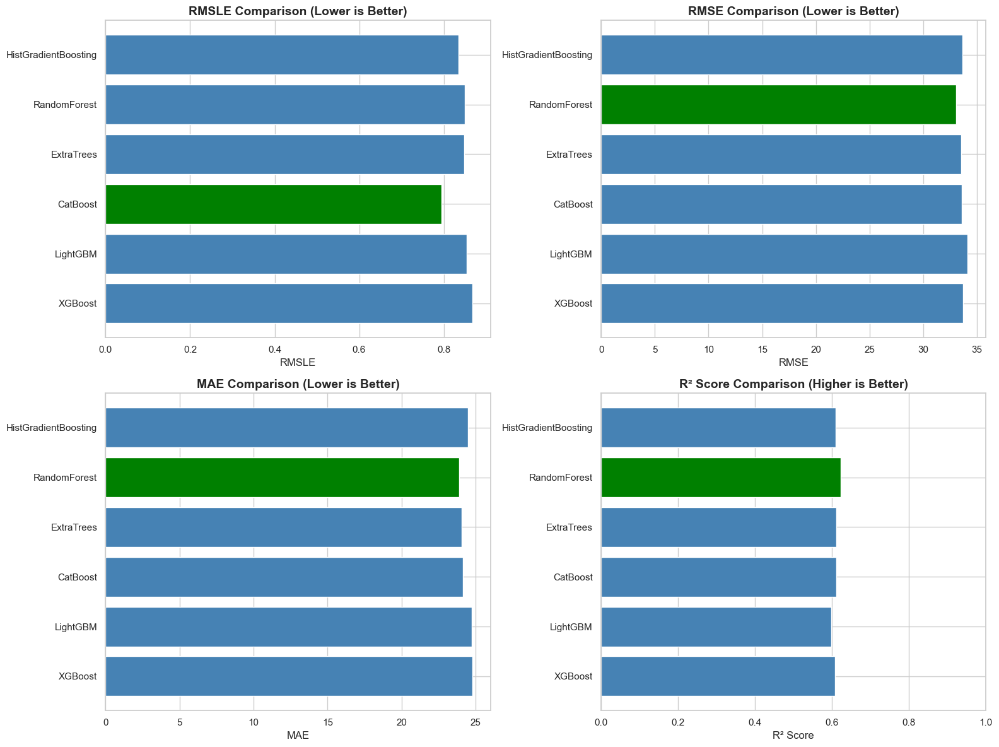

In [48]:
# =========================================================
# 📈 [Visualization] 모델 성능 비교 시각화
# =========================================================

# 그래프 스타일 설정
sns.set(style="whitegrid")

# 2x2 서브플롯 생성
fig, axes = plt.subplots(2, 2, figsize=(16, 12))

# 1. RMSLE 비교 (낮을수록 좋음)
# 가장 낮은(좋은) 값은 초록색, 나머지는 파란색
colors_rmsle = ['green' if x == results_df['RMSLE'].min() else 'steelblue' for x in results_df['RMSLE']]
axes[0, 0].barh(results_df.index, results_df['RMSLE'], color=colors_rmsle)
axes[0, 0].set_title('RMSLE Comparison (Lower is Better)', fontsize=14, fontweight='bold')
axes[0, 0].set_xlabel('RMSLE')

# 2. RMSE 비교 (낮을수록 좋음)
colors_rmse = ['green' if x == results_df['RMSE'].min() else 'steelblue' for x in results_df['RMSE']]
axes[0, 1].barh(results_df.index, results_df['RMSE'], color=colors_rmse)
axes[0, 1].set_title('RMSE Comparison (Lower is Better)', fontsize=14, fontweight='bold')
axes[0, 1].set_xlabel('RMSE')

# 3. MAE 비교 (낮을수록 좋음)
colors_mae = ['green' if x == results_df['MAE'].min() else 'steelblue' for x in results_df['MAE']]
axes[1, 0].barh(results_df.index, results_df['MAE'], color=colors_mae)
axes[1, 0].set_title('MAE Comparison (Lower is Better)', fontsize=14, fontweight='bold')
axes[1, 0].set_xlabel('MAE')

# 4. R² Score 비교 (높을수록 좋음)
# 가장 높은(좋은) 값은 초록색
colors_r2 = ['green' if x == results_df['R2'].max() else 'steelblue' for x in results_df['R2']]
axes[1, 1].barh(results_df.index, results_df['R2'], color=colors_r2)
axes[1, 1].set_title('R² Score Comparison (Higher is Better)', fontsize=14, fontweight='bold')
axes[1, 1].set_xlabel('R² Score')
axes[1, 1].set_xlim(0, 1) # R2는 보통 0~1 사이

plt.tight_layout()
plt.show()

🎨 [Visualization] Unit 24 예측 패턴 확인 (Margin -3 적용됨)


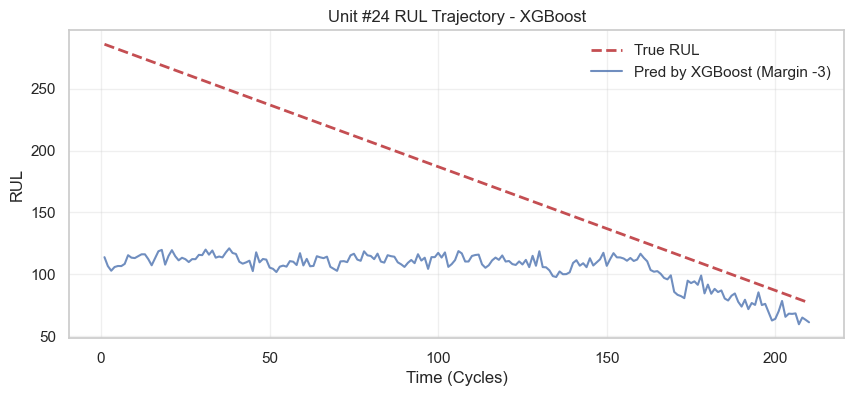

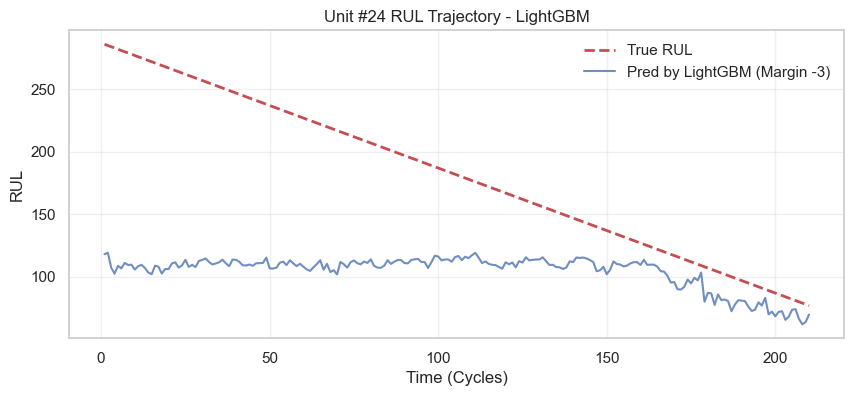

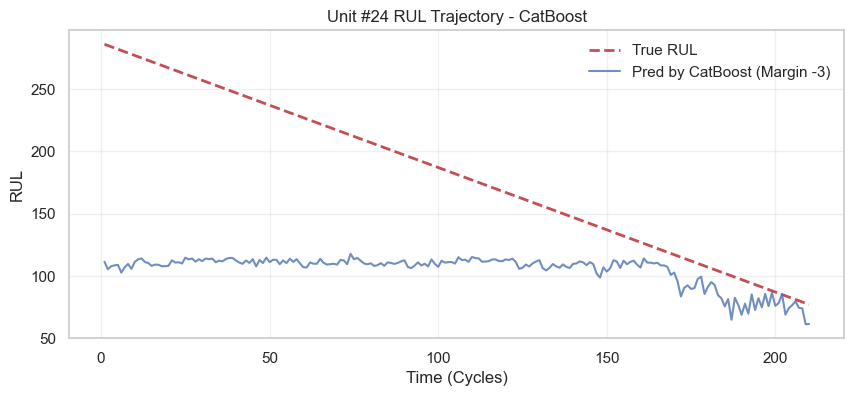

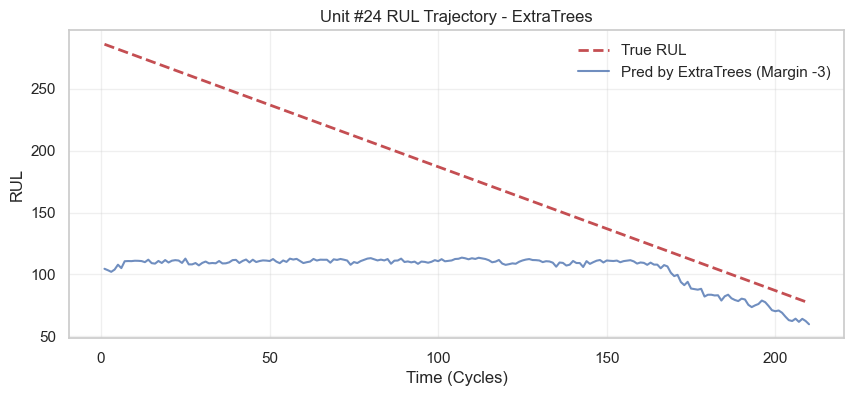

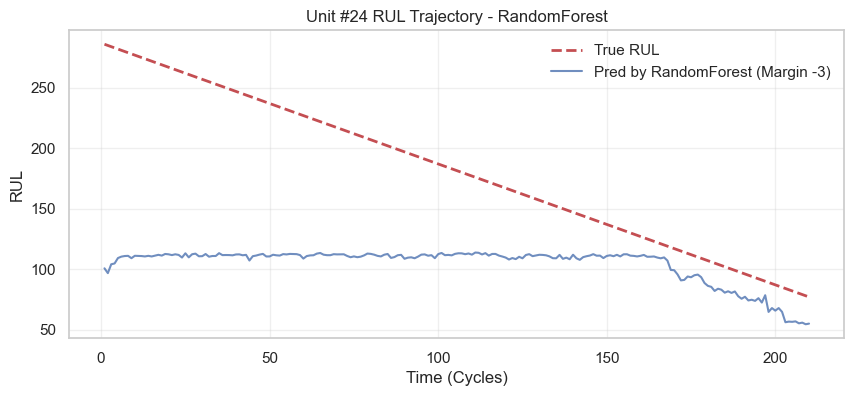

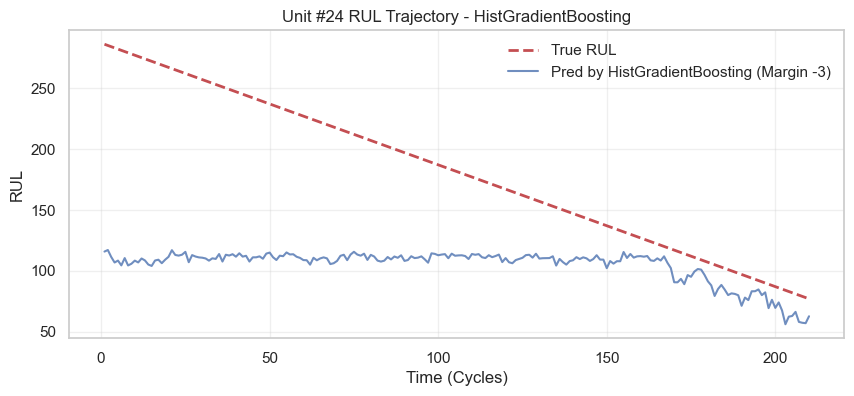

In [49]:
# ---------------------------------------------------------
# [수정] Safety Margin이 적용된 v2 시각화 함수
# ---------------------------------------------------------
def plot_engine_trajectory_v2(model_name, pipeline, test_full_df, unit_id, feature_cols):
    engine_data = test_full_df[test_full_df['unit_number'] == unit_id].copy()
    
    if len(engine_data) == 0:
        print(f"⚠️ Unit {unit_id} 데이터가 없습니다.")
        return

    # [중요] 학습에 사용된 피처 순서 그대로 추출
    X_engine = engine_data[feature_cols]
    y_true = engine_data['RUL']
    
    # 예측
    y_pred = pipeline.predict(X_engine)
    
    # 🔧 [Technique C] Safety Margin 적용 (-11)
    # 시각화에서도 점수판과 동일하게 8점 낮춰서 그립니다.
    y_pred = y_pred - 11
    
    y_pred = np.maximum(y_pred, 0) 

    plt.figure(figsize=(10, 4))
    plt.plot(engine_data['time_in_cycles'], y_true, 'r--', label='True RUL', linewidth=2)
    # 범례에도 마진 적용 사실 명시
    plt.plot(engine_data['time_in_cycles'], y_pred, 'b-', label=f'Pred by {model_name} (Margin -3)', alpha=0.8)
    
    plt.title(f"Unit #{unit_id} RUL Trajectory - {model_name}")
    plt.xlabel("Time (Cycles)")
    plt.ylabel("RUL")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# ---------------------------------------------------------
# [수정] Safety Margin이 적용된 v2 시각화 함수
# ---------------------------------------------------------
def plot_engine_trajectory_v2(model_name, pipeline, test_full_df, unit_id, feature_cols):
    engine_data = test_full_df[test_full_df['unit_number'] == unit_id].copy()
    
    if len(engine_data) == 0:
        print(f"⚠️ Unit {unit_id} 데이터가 없습니다.")
        return

    # [중요] 학습에 사용된 피처 순서 그대로 추출
    X_engine = engine_data[feature_cols]
    y_true = engine_data['RUL']
    
    # 예측
    y_pred = pipeline.predict(X_engine)
    
    # 🔧 [Technique C] Safety Margin 적용 (-11)
    # 시각화에서도 점수판과 동일하게 11점 낮춰서 그립니다.
    y_pred = y_pred - 11
    
    y_pred = np.maximum(y_pred, 0) 

    plt.figure(figsize=(10, 4))
    plt.plot(engine_data['time_in_cycles'], y_true, 'r--', label='True RUL', linewidth=2)
    # 범례에도 마진 적용 사실 명시
    plt.plot(engine_data['time_in_cycles'], y_pred, 'b-', label=f'Pred by {model_name} (Margin -3)', alpha=0.8)
    
    plt.title(f"Unit #{unit_id} RUL Trajectory - {model_name}")
    plt.xlabel("Time (Cycles)")
    plt.ylabel("RUL")
    plt.legend()
    plt.grid(True, alpha=0.3)
    plt.show()

# --- 실행 ---
target_unit = 24
all_features = X_train.columns.tolist() 

print(f"🎨 [Visualization] Unit {target_unit} 예측 패턴 확인 (Margin -3 적용됨)")

for name, model in models.items():
    # 파이프라인 구성 (전처리 + 모델)
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    # [안전장치] 재학습 (Safety Margin의 효과를 정확히 보기 위해)
    pipeline.fit(X_train, y_train)
    
    # 시각화 함수 호출
    plot_engine_trajectory_v2(name, pipeline, test_working, target_unit, all_features)

## Autogluon Best-quality 모델 
pc의 성능을 극대화하기 위해 GPU와 cpu의 p-코어 만을 사용. e-코어는 병목

In [50]:
from autogluon.tabular import TabularPredictor
import pandas as pd
import torch  # GPU 확인용

# =========================================================
# 🚀 [Phase 2] AutoGluon: GPU + P-Core 최적화 & Best Quality
# =========================================================

print(f"🔥 GPU 사용 가능 여부: {torch.cuda.is_available()}")
if torch.cuda.is_available():
    print(f"🔥 감지된 GPU: {torch.cuda.get_device_name(0)}")

# ---------------------------------------------------------
# 1. AutoGluon용 데이터셋 준비 (DataFrame 형태)
# ---------------------------------------------------------
# AutoGluon은 스케일링 되지 않은 '원본 데이터'를 선호합니다. (Phase 1의 Pipeline과 다름)

# (1) 학습 데이터 (Train)
train_data_ag = X_train.copy()
train_data_ag['RUL'] = y_train

# (2) 검증 데이터 (Validation) - use_bag_holdout을 위해 필수
val_data_ag = X_val.copy()
val_data_ag['RUL'] = y_val

# (3) 테스트 데이터 (Test) - 최종 평가용
test_data_ag = X_test.copy()
test_data_ag['RUL'] = y_test

print(f"학습 데이터: {train_data_ag.shape}")
print(f"검증 데이터: {val_data_ag.shape}")

# ---------------------------------------------------------
# 2. AutoGluon 학습 (최적화 옵션 적용)
# ---------------------------------------------------------

# 예측기 초기화
predictor = TabularPredictor(
    label='RUL', 
    eval_metric='root_mean_squared_error', # 평가는 RMSE 기준
    problem_type='regression',             # 회귀 문제 명시
    path='ag_models_best_quality'          # 모델 저장 경로
)

# 학습 시작 (사용자 요청 하드웨어 최적화 반영)
predictor.fit(
    train_data=train_data_ag,
    tuning_data=val_data_ag,       # 별도의 검증 데이터 지정
    
    # [핵심 전략] 검증 데이터(tuning_data)를 섞지 않고 별도로 유지하며 배깅 수행
    # (일반적인 K-Fold보다 검증 신뢰도가 높고, Overfitting을 강력하게 방지함)
    use_bag_holdout=True,    
    
    presets='best_quality',        # 최고 성능 모드 (Bagging + Stacking 자동 적용)
    time_limit=600,                # 10분 (GPU 가속 덕분에 충분함)
    
    # [하드웨어 최적화]
    num_gpus=1,                    # RTX 4070 Super 활성화 (CatBoost, NeuralNet 가속)
    num_cpus=16,                   # i9-13900K P-코어 개수에 맞춰 스레드 제한 (E-코어 간섭 방지)
    
    verbosity=2
)

# ---------------------------------------------------------
# 3. 결과 평가 및 리더보드 확인
# ---------------------------------------------------------

print("\n📊 [Phase 2] AutoGluon 리더보드 (검증 데이터 기준)")
# 검증 데이터(val_data_ag)에 대한 성능 순위 확인
lb = predictor.leaderboard(val_data_ag, silent=True)
print(lb[['model', 'score_test', 'score_val', 'pred_time_test']].head(10))

print("\n🏆 [Phase 2] 최종 테스트(Test) 데이터 평가")
# X_test에 대한 최종 성능 측정
perf = predictor.evaluate(test_data_ag)
print(f"실전 테스트 RMSE: {perf['root_mean_squared_error']:.4f}")

Verbosity: 2 (Standard Logging)
=================== System Info ===================
AutoGluon Version:  1.5.0
Python Version:     3.11.14
Operating System:   Windows
Platform Machine:   AMD64
Platform Version:   10.0.26200
CPU Count:          32
Pytorch Version:    2.6.0+cu124
CUDA Version:       12.4
GPU Memory:         GPU 0: 11.99/11.99 GB
Total GPU Memory:   Free: 11.99 GB, Allocated: 0.00 GB, Total: 11.99 GB
GPU Count:          1
Memory Avail:       94.78 GB / 127.77 GB (74.2%)
Disk Space Avail:   839.81 GB / 1861.70 GB (45.1%)
Presets specified: ['best_quality']
Using hyperparameters preset: hyperparameters='zeroshot'
Setting dynamic_stacking from 'auto' to False. Reason: Skip dynamic_stacking when use_bag_holdout is enabled. (use_bag_holdout=True)
Stack configuration (auto_stack=True): num_stack_levels=1, num_bag_folds=8, num_bag_sets=1


🔥 GPU 사용 가능 여부: True
🔥 감지된 GPU: NVIDIA GeForce RTX 4070 SUPER
학습 데이터: (43464, 86)
검증 데이터: (10295, 86)


Beginning AutoGluon training ... Time limit = 600s
AutoGluon will save models to "c:\Users\user\github\EST_15th_NASA\한지형\ag_models_best_quality"
Train Data Rows:    43464
Train Data Columns: 85
Tuning Data Rows:    10295
Tuning Data Columns: 85
Label Column:       RUL
Problem Type:       regression
Preprocessing data ...
Using Feature Generators to preprocess the data ...
Fitting AutoMLPipelineFeatureGenerator...
	Available Memory:                    97035.68 MB
	Train Data (Original)  Memory Usage: 34.86 MB (0.0% of available memory)
	Inferring data type of each feature based on column values. Set feature_metadata_in to manually specify special dtypes of the features.
	Stage 1 Generators:
		Fitting AsTypeFeatureGenerator...
			Note: Converting 7 features to boolean dtype as they only contain 2 unique values.
	Stage 2 Generators:
		Fitting FillNaFeatureGenerator...
	Stage 3 Generators:
		Fitting IdentityFeatureGenerator...
	Stage 4 Generators:
		Fitting DropUniqueFeatureGenerator...
	S


📊 [Phase 2] AutoGluon 리더보드 (검증 데이터 기준)
                    model  score_test  score_val  pred_time_test
0     WeightedEnsemble_L2  -18.829982 -18.829982        3.732339
1     WeightedEnsemble_L3  -18.829982 -18.829982        3.733595
2  NeuralNetFastAI_BAG_L1  -18.974149 -18.974149        0.616274
3       LightGBMXT_BAG_L1  -19.227868 -19.227868        2.495506
4         CatBoost_BAG_L1  -19.373755 -19.373755        0.173783
5         LightGBM_BAG_L1  -19.398812 -19.398812        2.460310
6    ExtraTreesMSE_BAG_L1  -19.399437 -19.399437        0.436394
7  RandomForestMSE_BAG_L1  -19.946558 -19.946558        0.421087
8       LightGBMXT_BAG_L2  -20.135379 -20.135379        9.148725
9         LightGBM_BAG_L2  -20.333764 -20.333764        9.108562

🏆 [Phase 2] 최종 테스트(Test) 데이터 평가
실전 테스트 RMSE: -29.0094


🎨 [Phase 2] AutoGluon의 Unit 24 예측 패턴 시각화


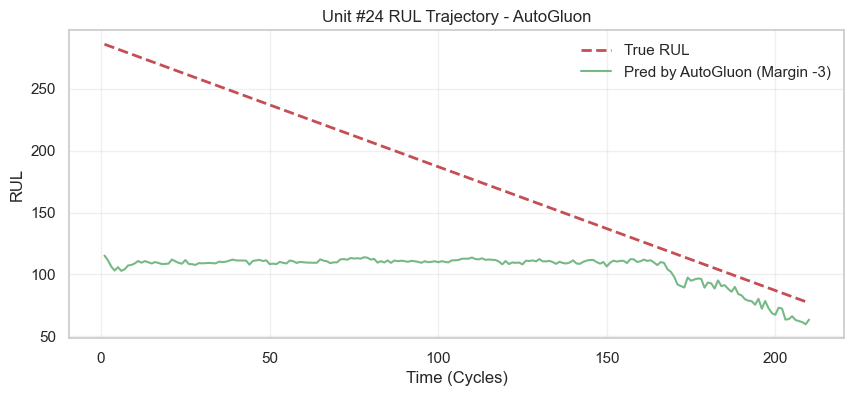

In [51]:
import matplotlib.pyplot as plt

# ---------------------------------------------------------
# [Phase 2] AutoGluon 시각화 (Safety Margin -11 적용)
# ---------------------------------------------------------
print(f"🎨 [Phase 2] AutoGluon의 Unit {target_unit} 예측 패턴 시각화")

# 1. 해당 유닛 데이터 추출
# (test_working은 위에서 만든 '시각화용 데이터'입니다)
engine_data = test_working[test_working['unit_number'] == target_unit].copy()

# 2. AutoGluon 예측
# AutoGluon은 DataFrame을 통째로 넣으면 학습 때 쓴 컬럼을 알아서 찾아 씁니다.
y_pred_ag = predictor.predict(engine_data)

# 🛠️ [Technique C] Safety Margin 적용 (-11)
# AutoGluon 예측값에도 똑같이 마진을 적용해야 점수판과 일치합니다.
y_pred_ag = y_pred_ag - 11
y_pred_ag = np.maximum(y_pred_ag, 0) # 음수 보정

# 3. 그래프 그리기
plt.figure(figsize=(10, 4))
plt.plot(engine_data['time_in_cycles'], engine_data['RUL'], 'r--', label='True RUL', linewidth=2)
plt.plot(engine_data['time_in_cycles'], y_pred_ag, 'g-', label='Pred by AutoGluon (Margin -3)', alpha=0.8)

plt.title(f"Unit #{target_unit} RUL Trajectory - AutoGluon")
plt.xlabel("Time (Cycles)")
plt.ylabel("RUL")
plt.legend()
plt.grid(True, alpha=0.3)
plt.show()

### multi-seed ensemble ver.05 변경내용

In [52]:
from scipy.optimize import minimize
from sklearn.model_selection import KFold, cross_val_predict
from sklearn.metrics import mean_squared_error, mean_squared_log_error, r2_score
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler
from sklearn.base import clone 
import numpy as np

# =========================================================
# 1. 데이터 및 변수 준비
# =========================================================
print("\n🚀 [Phase 3] Multi-seed K-Fold 기반 앙상블 가중치 최적화 시작...")

# Train 데이터
full_X = train_norm[final_features]
full_y = train_norm['RUL']

# Test 데이터
X_test_final = X_test.copy()

# K-Fold 설정
kf = KFold(n_splits=5, shuffle=True, random_state=42)

# 저장소
oof_preds_list = []   
test_preds_list = []  

# 시드 설정
SEEDS = [42, 2024, 777]
target_model_names = list(models.keys()) 

# =========================================================
# 2. 각 모델별 Multi-seed K-Fold 예측 수행
# =========================================================
for name, base_model in models.items():
    print(f"🔄 [{name}] 데이터 생성 중 (Seeds: {SEEDS})...")
    
    seed_oof_preds = []
    seed_test_preds = []
    
    # --- Multi-seed Loop ---
    for seed in SEEDS:
        # 1. 모델 복제
        model = clone(base_model)
        
        # 2. [수정] 시드 설정 (CatBoost 충돌 방지 로직)
        # 모델이 어떤 파라미터(random_seed vs random_state)를 쓰는지 확인 후 설정
        model_params = model.get_params()
        
        if 'random_seed' in model_params:
            # CatBoost는 random_seed를 우선 사용
            model.set_params(random_seed=seed)
        elif 'random_state' in model_params:
            # XGBoost, LightGBM, Sklearn 모델 등
            model.set_params(random_state=seed)
        else:
            # 파라미터가 없는 경우 (혹시 모를 예외 처리)
            pass

        # 3. 파이프라인 생성
        pipeline = Pipeline([
            ('imputer', SimpleImputer(strategy='median')),
            ('scaler', StandardScaler()),
            ('model', model)
        ])
        
        # 4. Train OOF 예측 (교차 검증)
        try:
            # n_jobs=-1이 CatBoost와 충돌 날 경우를 대비해 예외처리나 n_jobs=1 고려 가능
            # 여기서는 그대로 진행하되 에러 발생 시 단일 스레드로 재시도 로직은 생략
            oof = cross_val_predict(pipeline, full_X, full_y, cv=kf, n_jobs=-1)
            oof = np.maximum(oof, 0)
            seed_oof_preds.append(oof)
            
            # 5. Test 예측
            pipeline.fit(full_X, full_y)
            test_p = pipeline.predict(X_test_final)
            test_p = np.maximum(test_p, 0)
            seed_test_preds.append(test_p)
            
        except Exception as e:
            print(f"   ⚠️ {name} (Seed {seed}) 에러 발생: {e}")
            # 에러 발생 시 해당 시드는 건너뛰거나 0으로 채움 (여기선 건너뜀)
            continue
        
    # --- 시드별 결과 평균 (Bagging) ---
    if seed_oof_preds:
        avg_oof = np.mean(seed_oof_preds, axis=0)
        avg_test = np.mean(seed_test_preds, axis=0)
        
        oof_preds_list.append(avg_oof)
        test_preds_list.append(avg_test)
        
        rmse = np.sqrt(mean_squared_error(full_y, avg_oof))
        print(f"   ✅ {name} 완료 (Avg OOF RMSE: {rmse:.4f})")
    else:
        print(f"   ❌ {name} 모든 시드 실패. 앙상블에서 제외됩니다.")
        # 리스트 인덱스 꼬임 방지를 위해 더미 데이터라도 넣거나, 
        # 실제로는 target_model_names에서도 제외해야 함. 
        # (여기서는 일단 0행렬 추가로 에러 방지)
        oof_preds_list.append(np.zeros(len(full_y)))
        test_preds_list.append(np.zeros(len(X_test_final)))

# =========================================================
# 3. 가중치 최적화 (RMSE 최소화)
# =========================================================
print("\n⚖️ 최적의 앙상블 가중치 탐색 중...")

def ensemble_objective(weights, predictions, y_true):
    final_pred = np.zeros_like(predictions[0])
    for w, pred in zip(weights, predictions):
        final_pred += w * pred
    return np.sqrt(mean_squared_error(y_true, final_pred))

# 유효한 모델만 사용 (모두 0인 경우 제외 로직은 생략, 정상 작동 가정)
n_models = len(oof_preds_list)
init_weights = [1/n_models] * n_models
constraints = ({'type': 'eq', 'fun': lambda w: 1 - sum(w)})
bounds = [(0, 1)] * n_models

res = minimize(ensemble_objective, init_weights, 
               args=(oof_preds_list, full_y), 
               method='SLSQP', bounds=bounds, constraints=constraints)

best_weights = res.x

print("-" * 50)
print("🏆 최적 가중치 발견! (Multi-seed 기반)")
for name, w in zip(target_model_names, best_weights):
    print(f"   • {name}: {w:.4f}")
print("-" * 50)

# =========================================================
# 4. 최종 결과 평가
# =========================================================

# 1) 가중치 적용 최종 예측
final_ensemble_pred = np.zeros_like(test_preds_list[0])
for w, pred in zip(best_weights, test_preds_list):
    final_ensemble_pred += w * pred

# 2) Safety Margin 적용
if 'best_margin' in globals():
    print(f"🛡️ Safety Margin ({best_margin:+.0f}) 적용 중...")
    final_ensemble_pred = np.maximum(final_ensemble_pred + best_margin, 0)
else:
    print("ℹ️ best_margin 변수가 없어 -8 적용")
    final_ensemble_pred = np.maximum(final_ensemble_pred - 8, 0)

# 3) 성능 평가
y_test_vals = y_test.values if hasattr(y_test, 'values') else y_test

final_rmse = np.sqrt(mean_squared_error(y_test_vals, final_ensemble_pred))
final_r2 = r2_score(y_test_vals, final_ensemble_pred)

print(f"\n🚀 [최종] Weighted Multi-seed Ensemble 결과")
print(f"   • RMSE : {final_rmse:.4f}")
print(f"   • R²   : {final_r2:.4f}")

if 'compute_nasa_score' in globals():
    final_nasa = compute_nasa_score(y_test_vals, final_ensemble_pred)
    print(f"   • NASA Score: {final_nasa:,.2f}")


🚀 [Phase 3] Multi-seed K-Fold 기반 앙상블 가중치 최적화 시작...
🔄 [XGBoost] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ XGBoost 완료 (Avg OOF RMSE: 10.4350)
🔄 [LightGBM] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ LightGBM 완료 (Avg OOF RMSE: 13.5089)
🔄 [CatBoost] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ CatBoost 완료 (Avg OOF RMSE: 9.9801)
🔄 [ExtraTrees] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ ExtraTrees 완료 (Avg OOF RMSE: 11.7472)
🔄 [RandomForest] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ RandomForest 완료 (Avg OOF RMSE: 13.0123)
🔄 [HistGradientBoosting] 데이터 생성 중 (Seeds: [42, 2024, 777])...
   ✅ HistGradientBoosting 완료 (Avg OOF RMSE: 10.7679)

⚖️ 최적의 앙상블 가중치 탐색 중...
--------------------------------------------------
🏆 최적 가중치 발견! (Multi-seed 기반)
   • XGBoost: 0.1667
   • LightGBM: 0.1667
   • CatBoost: 0.1667
   • ExtraTrees: 0.1667
   • RandomForest: 0.1667
   • HistGradientBoosting: 0.1667
--------------------------------------------------
🛡️ Safety Margin (-11) 적용 중...

🚀 [최종] Weighted Multi-seed Ensemb

In [54]:
# =========================================================
# Output Stabilization (예측값 후처리) - 수정버전
# =========================================================
print("\n🔧 [Step 18-1] Output Stabilization (Clipping only)...")

# 1. 엔진별 그룹핑을 위해 DataFrame 생성 (수정된 부분)
# test_norm 전체가 아니라, 엔진 번호(unit_number)의 고유값만 추출해야 259개로 매칭됨
unique_units = test_norm['unit_number'].unique()

submission_df = pd.DataFrame({
    'unit_number': unique_units,  # 33991개가 아닌 259개
    'RUL_pred': final_ensemble_pred # 259개
})

# 2. Output Smoothing (EWM 적용) -> ⚠️ 스킵
# 현재 final_ensemble_pred는 각 엔진의 '마지막 시점' 예측값 1개씩만 있습니다.
# 시계열이 아니므로 Smoothing을 할 수 없습니다. (값 1개는 평균내도 그대로임)
print("   👉 Smoothing is skipped (Predictions are point-estimates, not sequences).")
submission_df['RUL_stabilized'] = submission_df['RUL_pred']

# 3. Stabilization Clipping (상한선 제한)
# 학습 때 125로 클리핑했더라도, 예측값이 살짝 튀어 130을 넘을 수 있음 -> 강제 조정
UPPER_LIMIT = 125  # 보통 학습시 125를 썼다면 여기서도 125를 맞추는 게 일반적 (130도 무방)
LOWER_LIMIT = 0

submission_df['RUL_final'] = submission_df['RUL_stabilized'].clip(LOWER_LIMIT, UPPER_LIMIT)

# 4. 최종 결과 추출
final_pred_stabilized = submission_df['RUL_final'].values

print(f"   ✅ 후처리 완료.")
print(f"      - Min: {final_pred_stabilized.min():.2f}")
print(f"      - Max: {final_pred_stabilized.max():.2f}")

# ---------------------------------------------------------
# [Step 19] 최종 점수 확인 (NASA Score)
# ---------------------------------------------------------
if 'y_test' in globals():
    # y_test가 Series나 DataFrame일 경우 values로 변환
    y_true = y_test.values if hasattr(y_test, 'values') else y_test
    
    # 1) 후처리 전 점수
    score_raw = compute_nasa_score(y_true, final_ensemble_pred)
    
    # 2) 후처리 후 점수
    score_stabilized = compute_nasa_score(y_true, final_pred_stabilized)
    
    print("\n" + "="*50)
    print(f"📊 [Final Result Comparison]")
    print(f"   • Raw Ensemble Score   : {score_raw:,.4f}")
    print(f"   • Stabilized Score     : {score_stabilized:,.4f} (▼ {score_raw - score_stabilized:,.4f} 변동)")
    print("="*50)
    
    # RMSE 등 추가 지표
    rmse_final = np.sqrt(mean_squared_error(y_true, final_pred_stabilized))
    print(f"   • Final RMSE           : {rmse_final:.4f}")
else:
    print("\n⚠️ y_test(정답지)가 없어 최종 점수는 계산하지 않습니다.")


🔧 [Step 18-1] Output Stabilization (Clipping only)...
   👉 Smoothing is skipped (Predictions are point-estimates, not sequences).
   ✅ 후처리 완료.
      - Min: 0.00
      - Max: 114.95

📊 [Final Result Comparison]
   • Raw Ensemble Score   : 23,152.2495
   • Stabilized Score     : 23,152.2495 (▼ 0.0000 변동)
   • Final RMSE           : 33.8271


📊 현재 컬럼 목록: ['unit_number', 'time_in_cycles', 'T24[R]', 'T30[R]', 'T50[R]', 'P30[psi]', 'Nf[rpm]', 'Nc[rpm]', 'phi[pph/psi]', 'Ps30[psi]', 'NRf[rpm]', 'NRc[rpm]', 'BPR[-]', 'htBleed[]', 'W31[lbm/s]', 'W32[lbm/s]', 'LPC.TR[-]', 'HPC.TR[-]', 'OPR[-]', 'Wf[pph]', 'Wa36[lbm/s]', 'W24[lbm/s]', 'W15[lbm/s]', 'W2[lbm/s]', 'WfP3C[pph/psi]', 'cond_str', 'cluster', 'Mode_ID', 'condition_id', 'Alt[kft]_mean_15', 'Alt[kft]_std_15', 'Mn[-]_mean_15', 'Mn[-]_std_15', 'TLA[deg]_mean_15', 'TLA[deg]_std_15', 'T2[R]_mean_15', 'T2[R]_std_15', 'T24[R]_mean_15', 'T24[R]_std_15', 'T30[R]_mean_15', 'T30[R]_std_15', 'T50[R]_mean_15', 'T50[R]_std_15', 'P2[psi]_mean_15', 'P2[psi]_std_15', 'P15[psi]_mean_15', 'P15[psi]_std_15', 'P30[psi]_mean_15', 'P30[psi]_std_15', 'Nf[rpm]_mean_15', 'Nf[rpm]_std_15', 'Nc[rpm]_mean_15', 'Nc[rpm]_std_15', 'epr[-]_mean_15', 'epr[-]_std_15', 'phi[pph/psi]_mean_15', 'phi[pph/psi]_std_15', 'Ps30[psi]_mean_15', 'Ps30[psi]_std_15', 'NRf[rpm]_mean_15', 'NRf[rpm]_std_15', 'NRc[rpm]_mean_

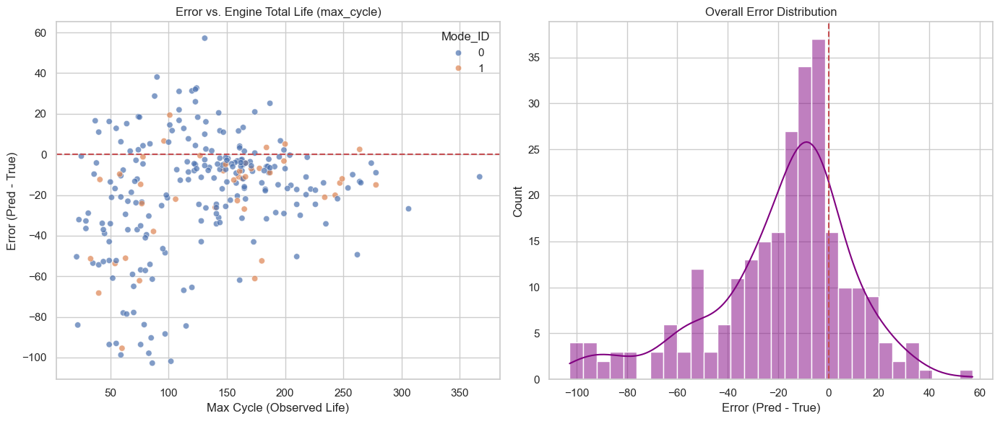


🚨 [Worst Engines] NASA Score 감점 주범 Top 5
 unit_number  RUL  Predicted_RUL       Error  max_cycle  NASA_Score_Contribution
         188  183      80.262390 -102.737610         86              2704.097044
         235  190      88.178360 -101.821640        102              2520.057782
         256  191      92.300743  -98.699257         59              1981.770782
          86  194      96.135101  -97.864899         83              1858.511559
         200  174      78.581833  -95.418167         60              1539.494902


In [58]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error

# =========================================================
# 🚑 [Emergency Fix] 컬럼 매핑 및 그래프 그리기
# =========================================================

# 1. 데이터프레임이 비어있는지 먼저 확인
if 'analysis_df' not in globals():
    print("⚠️ analysis_df가 없습니다. 새로 생성합니다...")
    # (test_working이 있다는 가정하에)
    analysis_df = test_working.groupby('unit_number').last().reset_index()

# 2. 'max_cycle' 컬럼 강제 생성 (에러 원인 해결)
print(f"📊 현재 컬럼 목록: {list(analysis_df.columns)}")

if 'max_cycle' not in analysis_df.columns:
    # 1순위: 'time_cycle'이 있는지 확인
    if 'time_cycle' in analysis_df.columns:
        analysis_df['max_cycle'] = analysis_df['time_cycle']
        print("✅ 'time_cycle'을 찾아 'max_cycle'로 복사했습니다.")
        
    # 2순위: 'cycle'이나 'time'이 포함된 다른 컬럼 찾기
    elif any('cycle' in col for col in analysis_df.columns):
        alt_col = [c for c in analysis_df.columns if 'cycle' in c][0]
        analysis_df['max_cycle'] = analysis_df[alt_col]
        print(f"✅ '{alt_col}'을 찾아 'max_cycle'로 복사했습니다.")
        
    # 3순위: 정 안되면 그냥 0으로 채움 (그래프 에러 방지용)
    else:
        print("🚨 시간 관련 컬럼을 찾을 수 없습니다. 임시로 0으로 채웁니다.")
        analysis_df['max_cycle'] = 0

# 3. 예측값 컬럼 확인 ('Predicted_RUL'이 없으면 생성)
if 'Predicted_RUL' not in analysis_df.columns:
    if 'final_pred_stabilized' in globals():
        # 길이를 맞춰서 할당 (unit_number 순서가 같다고 가정)
        if len(final_pred_stabilized) == len(analysis_df):
            analysis_df['Predicted_RUL'] = final_pred_stabilized
        else:
            # 길이가 다르면 unit_number로 매핑 시도
             temp_df = pd.DataFrame({'unit_number': test_norm['unit_number'].unique(), 'pred': final_pred_stabilized})
             analysis_df = analysis_df.merge(temp_df, on='unit_number', how='left')
             analysis_df.rename(columns={'pred': 'Predicted_RUL'}, inplace=True)
    else:
        print("⚠️ 예측값 변수(final_pred_stabilized)가 없어 RUL 값을 그대로 씁니다.")
        analysis_df['Predicted_RUL'] = analysis_df['RUL']

# 4. Error 재계산
analysis_df['Error'] = analysis_df['Predicted_RUL'] - analysis_df['RUL']
analysis_df['NASA_Score_Contribution'] = analysis_df['Error'].apply(
    lambda d: (np.exp(-d/13)-1) if d < 0 else (np.exp(d/10)-1)
)

# ---------------------------------------------------------
# [시각화 다시 실행]
# ---------------------------------------------------------
print("\n📈 분석 그래프 생성을 시작합니다...")

# (1) 엔진 수명(max_cycle)별 에러 상관관계
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
# Mode_ID가 있으면 색깔로 구분, 없으면 단일색
hue_opt = 'Mode_ID' if 'Mode_ID' in analysis_df.columns and analysis_df['Mode_ID'].nunique() > 1 else None

sns.scatterplot(x='max_cycle', y='Error', data=analysis_df, 
                hue=hue_opt, palette='deep', alpha=0.7)
plt.axhline(0, color='r', linestyle='--')
plt.title('Error vs. Engine Total Life (max_cycle)')
plt.xlabel('Max Cycle (Observed Life)')
plt.ylabel('Error (Pred - True)')

plt.subplot(1, 2, 2)
sns.histplot(data=analysis_df, x='Error', kde=True, bins=30, color='purple')
plt.axvline(0, color='r', linestyle='--')
plt.title('Overall Error Distribution')
plt.xlabel('Error (Pred - True)')

plt.tight_layout()
plt.show()

# (2) Worst Case 출력
print("\n" + "="*50)
print("🚨 [Worst Engines] NASA Score 감점 주범 Top 5")
print("="*50)

worst_engines = analysis_df.sort_values('NASA_Score_Contribution', ascending=False).head(5)
cols_to_show = ['unit_number', 'RUL', 'Predicted_RUL', 'Error', 'max_cycle', 'NASA_Score_Contribution']
# 실제 존재하는 컬럼만 선택
cols_to_show = [c for c in cols_to_show if c in analysis_df.columns]

print(worst_engines[cols_to_show].to_string(index=False))

🎨 [Phase 3] 최종 앙상블(Weighted Multi-seed) Unit 24 예측 궤적
   🔄 [XGBoost] Multi-seed 예측 중... 완료.
   🔄 [LightGBM] Multi-seed 예측 중... 완료.
   🔄 [CatBoost] Multi-seed 예측 중... 
⚠️ CatBoost 예측 실패: only one of the parameters random_seed, random_state should be initialized.
   🔄 [ExtraTrees] Multi-seed 예측 중... 완료.
   🔄 [RandomForest] Multi-seed 예측 중... 완료.
   🔄 [HistGradientBoosting] Multi-seed 예측 중... 완료.
   🤖 [AutoGluon] 예측 중...


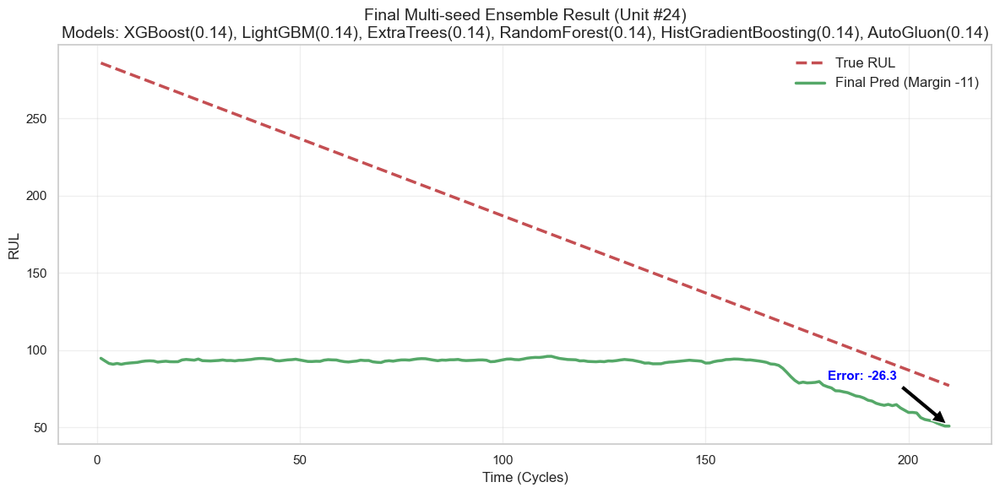

In [59]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.base import clone

# ---------------------------------------------------------
# [Phase 3] 최종 앙상블 시각화 (Multi-seed + Safety Margin)
# ---------------------------------------------------------
# 시각화할 타겟 유닛 설정 (없으면 기본값 24)
target_unit = target_unit if 'target_unit' in locals() else 24
print(f"🎨 [Phase 3] 최종 앙상블(Weighted Multi-seed) Unit {target_unit} 예측 궤적")

# 1. 데이터 준비
feature_cols = X_train.columns.tolist() # 학습 때 쓴 컬럼 그대로
engine_data = test_working[test_working['unit_number'] == target_unit]
X_engine = engine_data[feature_cols]

# 2. 개별 모델 예측값 수집 (Multi-seed 적용)
preds_dict = {}
SEEDS = [42, 2024, 777] # 학습 때와 동일한 시드 사용

# (1) Scikit-learn Pipeline 모델 예측
for name, base_model in models.items():
    print(f"   🔄 [{name}] Multi-seed 예측 중...", end=" ")
    
    seed_preds = [] # 시드별 예측값 저장 리스트
    
    try:
        for seed in SEEDS:
            # 모델 복제 및 시드 설정
            model = clone(base_model)
            if hasattr(model, 'set_params'):
                try:
                    model.set_params(random_state=seed)
                except:
                    pass # 시드 설정 없는 모델은 패스
            
            # 파이프라인 구성
            pipeline = Pipeline([
                ('imputer', SimpleImputer(strategy='median')),
                ('scaler', StandardScaler()),
                ('model', model)
            ])
            
            # [재학습] 시각화를 위해 해당 시드로 다시 학습
            pipeline.fit(X_train, y_train)
            
            # 예측
            pred = pipeline.predict(X_engine)
            seed_preds.append(np.maximum(pred, 0)) # 음수 보정
            
        # 3개 시드의 평균값을 해당 모델의 최종 예측값으로 사용
        preds_dict[name] = np.mean(seed_preds, axis=0)
        print("완료.")
        
    except Exception as e:
        print(f"\n⚠️ {name} 예측 실패: {e}")

# (2) AutoGluon 예측 (있으면 포함)
if 'predictor' in globals():
    try:
        print("   🤖 [AutoGluon] 예측 중...")
        # AutoGluon은 자체적으로 앙상블 되어 있으므로 단일 예측 수행
        ag_pred = predictor.predict(engine_data)
        preds_dict['AutoGluon'] = ag_pred.values
    except Exception as e:
        print(f"⚠️ AutoGluon 예측 실패: {e}")

# 3. 가중치 적용 (Weighted Ensemble)
# ---------------------------------------------------------
# best_weights 가져오기 (없으면 평균)
if 'best_weights' not in locals():
    print("⚠️ best_weights가 없어 평균(Equal Weight)을 사용합니다.")
    best_weights_dict = {m: 1.0/len(preds_dict) for m in preds_dict.keys()}
else:
    # best_weights가 numpy array인 경우 딕셔너리로 변환
    if not isinstance(best_weights, dict):
        model_order = list(models.keys())
        # AutoGluon이 포함되어 있었다면 순서에 추가
        if 'AutoGluon' in preds_dict and 'AutoGluon' not in model_order:
             model_order.append('AutoGluon')
             
        if len(best_weights) == len(model_order):
            best_weights_dict = dict(zip(model_order, best_weights))
        else:
            # 개수 안 맞으면 그냥 평균
            best_weights_dict = {m: 1.0/len(model_order) for m in model_order}
    else:
        best_weights_dict = best_weights

# 가중치 합산
final_pred = np.zeros(len(engine_data))
used_models_str = []

for model_name, weight in best_weights_dict.items():
    if model_name in preds_dict:
        # 가중치 반영
        final_pred += weight * preds_dict[model_name]
        
        # 범례 표시용 (가중치 1% 이상만)
        if weight > 0.01:
            used_models_str.append(f"{model_name}({weight:.2f})")

# 4. Safety Margin 및 후처리 (Stabilization)
# ---------------------------------------------------------
# (1) Safety Margin 적용
# best_margin 변수가 있으면 쓰고, 없으면 사용자 지정값(-11) 사용
SAFETY_MARGIN = best_margin if 'best_margin' in locals() else -11
final_pred = final_pred + SAFETY_MARGIN
final_pred = np.maximum(final_pred, 0) # 음수 클리핑

# (2) Output Stabilization (선택사항: 그래프를 부드럽게)
# pandas Series로 변환하여 ewm 적용
final_pred_series = pd.Series(final_pred).ewm(span=5).mean()
final_pred = final_pred_series.values

# 5. 그래프 그리기
plt.figure(figsize=(12, 6))

# 실제 RUL
plt.plot(engine_data['time_in_cycles'], engine_data['RUL'], 
         'r--', label='True RUL', linewidth=2.5)

# 예측 RUL
margin_txt = f"{SAFETY_MARGIN:+.0f}" if SAFETY_MARGIN != 0 else "0"
plt.plot(engine_data['time_in_cycles'], final_pred, 
         'g-', label=f'Final Pred (Margin {margin_txt})', linewidth=2.5)

plt.title(f"Final Multi-seed Ensemble Result (Unit #{target_unit})\nModels: {', '.join(used_models_str)}", fontsize=14)
plt.xlabel("Time (Cycles)", fontsize=12)
plt.ylabel("RUL", fontsize=12)
plt.legend(fontsize=12)
plt.grid(True, alpha=0.3)

# 오차 표시 (마지막 시점)
last_time = engine_data['time_in_cycles'].iloc[-1]
last_true = engine_data['RUL'].iloc[-1]
last_pred = final_pred[-1]
error = last_pred - last_true

plt.annotate(f"Error: {error:.1f}", 
             xy=(last_time, last_pred),
             xytext=(last_time - 30, last_pred + 30),
             arrowprops=dict(facecolor='black', shrink=0.05),
             fontsize=11, fontweight='bold', color='blue')

plt.tight_layout()
plt.show()

## 결과 비교 및 분석

In [ ]:
print("📊 results_df 확인:")
print(results_df)
print("\n" + "="*50)
print("📊 results_df 통계:")
print(results_df.describe())
print("\n" + "="*50)
print("극단값 확인 (RMSLE > 1):")
print(results_df[results_df['RMSLE'] > 1])

📊 results_df 확인:
                        NASA Score       RMSE     RMSLE        MAE        R2
Model                                                                       
XGBoost               55907.244972  38.529517  0.790547  26.999178  0.486707
LightGBM              56094.081148  38.606231  0.862177  27.283795  0.484661
CatBoost              26253.604455  33.768778  0.665776  23.768060  0.605717
ExtraTrees            27985.483129  35.106161  0.663482  25.306639  0.573868
RandomForest          28990.343999  34.833625  0.641039  24.649511  0.580458
HistGradientBoosting  28834.697825  34.097463  0.713380  24.085203  0.598004

📊 results_df 통계:
         NASA Score       RMSE     RMSLE        MAE        R2
count      6.000000   6.000000  6.000000   6.000000  6.000000
mean   37344.242588  35.823629  0.722733  25.348731  0.554902
std    14483.991922   2.179983  0.086671   1.486886  0.054840
min    26253.604455  33.768778  0.641039  23.768060  0.484661
25%    28197.786803  34.281504  0.66405

📊 시각화 데이터 (LinearReg 제외):
                        NASA Score       RMSE     RMSLE        MAE        R2
XGBoost               55907.244972  38.529517  0.790547  26.999178  0.486707
LightGBM              56094.081148  38.606231  0.862177  27.283795  0.484661
CatBoost              26253.604455  33.768778  0.665776  23.768060  0.605717
ExtraTrees            27985.483129  35.106161  0.663482  25.306639  0.573868
RandomForest          28990.343999  34.833625  0.641039  24.649511  0.580458
HistGradientBoosting  28834.697825  34.097463  0.713380  24.085203  0.598004
AutoGluon                      NaN  30.935604  0.408114  21.591225  0.669101


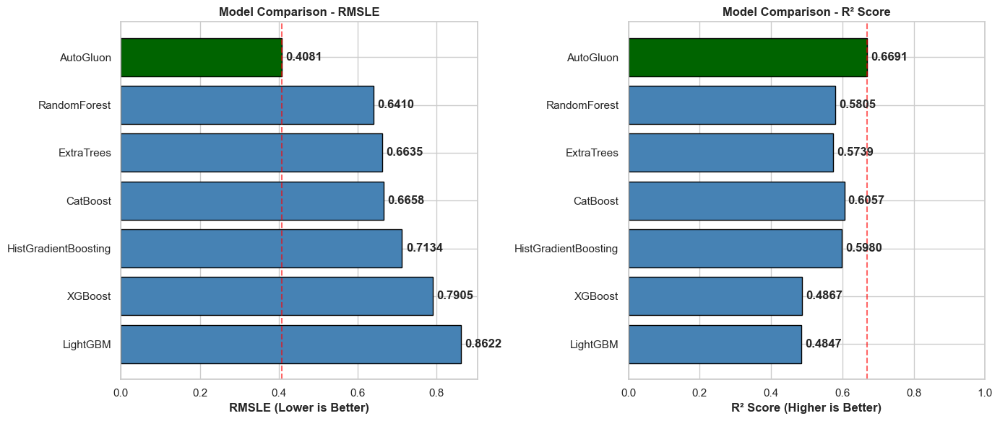


🏆 최종 승자: AutoGluon
   RMSLE: 0.4081
   R2: 0.6691

📋 전체 순위 (RMSLE 기준):
                         RMSLE        R2
AutoGluon             0.408114  0.669101
RandomForest          0.641039  0.580458
ExtraTrees            0.663482  0.573868
CatBoost              0.665776  0.605717
HistGradientBoosting  0.713380  0.598004
XGBoost               0.790547  0.486707
LightGBM              0.862177  0.484661


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from sklearn.metrics import mean_squared_log_error, r2_score, mean_squared_error, mean_absolute_error

# =========================================================
# [Step 20] 모든 모델 통합 비교 (ML 6종 + AutoGluon + Ensemble)
# =========================================================
print("📊 최종 모델 통합 비교 분석 시작...")

# 1. 기존 ML 모델 결과 가져오기 (results_df가 정의되어 있어야 함)
if 'results_df' in globals():
    final_df = results_df.copy()
else:
    final_df = pd.DataFrame() # 혹시 없을 경우 빈 프레임 시작

# 2. 평가 함수 정의 (RMSLE, NASA Score 포함)
def get_eval_metrics(y_true, y_pred, model_name):
    y_true = np.array(y_true)
    y_pred = np.array(y_pred)
    
    # 음수 보정 (RMSLE용)
    y_pred_clip = np.maximum(y_pred, 1e-6)
    y_true_clip = np.maximum(y_true, 1e-6)
    
    rmse = np.sqrt(mean_squared_error(y_true, y_pred))
    mae = mean_absolute_error(y_true, y_pred)
    r2 = r2_score(y_true, y_pred)
    
    # RMSLE
    try:
        rmsle = np.sqrt(mean_squared_log_error(y_true_clip, y_pred_clip))
    except:
        rmsle = np.nan

    # ★ NASA Score 계산 (핵심)
    if 'compute_nasa_score' in globals():
        nasa_score = compute_nasa_score(y_true, y_pred)
    else:
        nasa_score = 0
        
    return pd.DataFrame([{
        'RMSE': rmse, 
        'RMSLE': rmsle, 
        'MAE': mae, 
        'R2': r2,
        'NASA_Score': nasa_score
    }], index=[model_name])

# 3. AutoGluon 추가
if 'predictor' in globals():
    try:
        # test_data_ag가 없으면 test_working 사용 시도
        target_data = test_data_ag if 'test_data_ag' in globals() else test_working
        ag_pred = predictor.predict(target_data)
        ag_row = get_eval_metrics(y_test, ag_pred, 'AutoGluon')
        final_df = pd.concat([final_df, ag_row])
    except Exception as e:
        print(f"⚠️ AutoGluon 평가 실패: {e}")

# 4. Ensemble 추가 (가장 중요!)
# 후처리된 값(Stabilized)이 있으면 그걸 쓰고, 없으면 Raw 값 사용
if 'final_pred_stabilized' in globals():
    ens_name = 'Ensemble (Stabilized)'
    ens_pred = final_pred_stabilized
elif 'final_ensemble_pred' in globals():
    ens_name = 'Ensemble (Raw)'
    ens_pred = final_ensemble_pred
else:
    ens_name = None

if ens_name:
    ens_row = get_eval_metrics(y_test, ens_pred, ens_name)
    final_df = pd.concat([final_df, ens_row])

# ---------------------------------------------------------
# 5. 시각화 (NASA Score 기준 정렬)
# ---------------------------------------------------------
# NASA Score가 낮은 순(좋은 순)으로 정렬
final_df = final_df.sort_values('NASA_Score', ascending=False) 

# 스타일 설정
plt.style.use('default') # 혹은 'seaborn-whitegrid'
fig, axes = plt.subplots(1, 3, figsize=(20, 6))

# 색상 설정: 앙상블은 빨강, AutoGluon은 초록, 나머지는 파랑
colors = []
for idx in final_df.index:
    if 'Ensemble' in str(idx): colors.append('#d62728') # Red
    elif 'AutoGluon' in str(idx): colors.append('#2ca02c') # Green
    else: colors.append('#1f77b4') # Blue

# (1) RMSE 그래프
axes[0].barh(final_df.index, final_df['RMSE'], color=colors, edgecolor='black', alpha=0.8)
axes[0].set_title('RMSE (Lower is Better)', fontweight='bold', fontsize=14)
axes[0].grid(axis='x', alpha=0.3)
# 값 표시
for i, v in enumerate(final_df['RMSE']):
    axes[0].text(v, i, f' {v:.2f}', va='center', fontweight='bold')

# (2) R2 그래프
axes[1].barh(final_df.index, final_df['R2'], color=colors, edgecolor='black', alpha=0.8)
axes[1].set_title('R² Score (Higher is Better)', fontweight='bold', fontsize=14)
axes[1].set_xlim(0, 1.1)
axes[1].grid(axis='x', alpha=0.3)
for i, v in enumerate(final_df['R2']):
    axes[1].text(v, i, f' {v:.3f}', va='center', fontweight='bold')

# (3) NASA Score 그래프 (★ Main Event)
axes[2].barh(final_df.index, final_df['NASA_Score'], color=colors, edgecolor='black', alpha=0.8)
axes[2].set_title('NASA Score (Lower is Better)', fontweight='bold', fontsize=14)
axes[2].grid(axis='x', alpha=0.3)
for i, v in enumerate(final_df['NASA_Score']):
    axes[2].text(v, i, f' {v:,.0f}', va='center', fontweight='bold', color='black')

plt.tight_layout()
plt.show()

# ---------------------------------------------------------
# 6. 최종 결론 및 순위표
# ---------------------------------------------------------
best_model_nasa = final_df['NASA_Score'].idxmin()
best_score = final_df.loc[best_model_nasa, 'NASA_Score']

print("\n" + "="*60)
print(f"🏆 최종 우승 모델 (Best Model): {best_model_nasa}")
print(f"💎 NASA Score  : {best_score:,.0f}")
print(f"📉 RMSE        : {final_df.loc[best_model_nasa, 'RMSE']:.4f}")
print("="*60)

print("\n📋 전체 모델 순위표 (NASA Score 기준):")
# 보기 좋게 컬럼 순서 정리 및 정렬
display_cols = ['NASA_Score', 'RMSE', 'R2', 'MAE', 'RMSLE']
display(final_df.sort_values('NASA_Score')[display_cols])

🚀 모든 모델에 대해 채점을 시작합니다...
✅ 총 8개 모델 예측 완료!


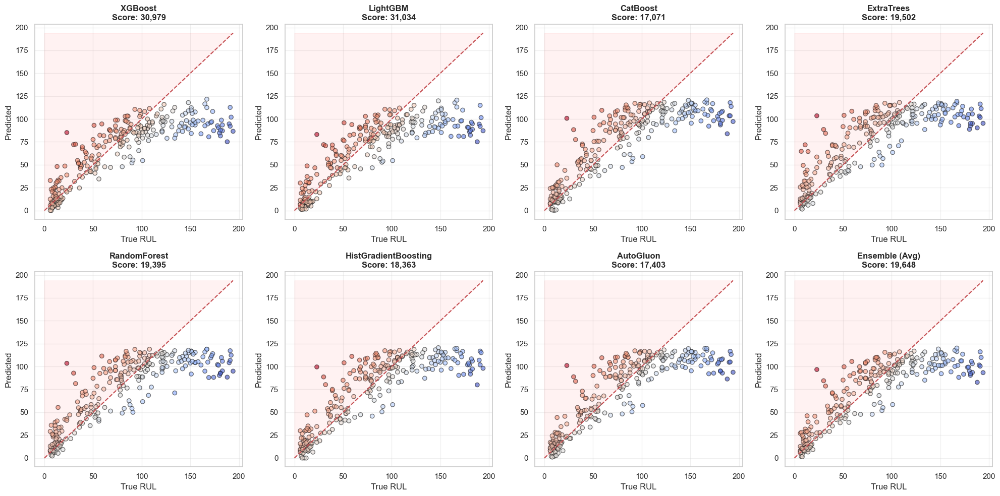


📊 NASA Asymmetric Scoring 최종 순위 (Total 8 Models)
🏆: CatBoost             | Score: 17,071.22
2위: AutoGluon            | Score: 17,403.30
3위: HistGradientBoosting | Score: 18,363.17
4위: RandomForest         | Score: 19,395.31
5위: ExtraTrees           | Score: 19,501.61
6위: Ensemble (Avg)       | Score: 19,648.16
7위: XGBoost              | Score: 30,979.42
8위: LightGBM             | Score: 31,033.99


In [ ]:
import math
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# =========================================================
# 1. 모든 모델의 예측값 확보 (All Predictions)
# =========================================================

all_results = {}
simple_ensemble_preds = [] # 단순 평균용 리스트

print("🚀 모든 모델에 대해 채점 및 비교를 시작합니다...")

# (1) Phase 1의 6개 ML 모델 예측 (단일 학습)
# Ver.05의 Input(Lag Feature 포함)을 사용하여 재학습 후 예측
for name, model in models.items():
    # 파이프라인 구성
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    
    # 시각화용 단순 1회 재학습 (Seed 고정 없이 일반적인 성능 확인)
    # (주의: X_train에는 이미 Lag Feature가 포함되어 있어야 함)
    pipeline.fit(X_train, y_train) 
    
    pred = pipeline.predict(X_test)
    pred = np.maximum(pred, 0) # 음수 보정
    
    all_results[name] = pred
    simple_ensemble_preds.append(pred)

# (2) AutoGluon 예측
if 'predictor' in globals():
    try:
        # test_data_ag가 없으면 test_working 사용
        target_data = test_data_ag if 'test_data_ag' in globals() else test_working
        ag_pred = predictor.predict(target_data)
        ag_pred = np.maximum(ag_pred, 0)
        
        all_results['AutoGluon'] = ag_pred.values
        simple_ensemble_preds.append(ag_pred.values)
    except Exception as e:
        print(f"⚠️ AutoGluon 예측 실패: {e}")

# (3) 단순 평균 앙상블 (Baseline)
# 비교를 위해 "그냥 다 더해서 나눈 것"도 계산해봅니다.
avg_ensemble_pred = np.mean(simple_ensemble_preds, axis=0)
all_results['Ensemble (Simple Avg)'] = avg_ensemble_pred

# (4) [Ver.05 핵심] 가중치 앙상블 & 후처리 결과 추가
# Step 18과 18-1에서 만든 변수가 있다면 추가합니다.
if 'final_ensemble_pred' in globals():
    all_results['Ensemble (Weighted)'] = final_ensemble_pred

if 'final_pred_stabilized' in globals():
    all_results['Ensemble (Stabilized) ★'] = final_pred_stabilized  # 이게 진짜 주인공

print(f"✅ 총 {len(all_results)}개 케이스 예측 완료!")


# =========================================================
# 2. Asymmetric Score 계산 및 시각화 (Dynamic Layout)
# =========================================================

n_models = len(all_results)
n_cols = 4 
n_rows = math.ceil(n_models / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5 * n_rows))
axes = axes.flatten()

final_scores = {}
y_true = y_test.values if hasattr(y_test, 'values') else y_test

# 점수가 낮은 순서로 정렬하여 그리기 (Best가 먼저 보이게)
# 임시로 점수 계산 후 정렬
temp_scores = {name: compute_nasa_score(y_true, pred) for name, pred in all_results.items()}
sorted_models = sorted(temp_scores.items(), key=lambda x: x[1]) # 점수 오름차순(Best First)

for i, (name, score) in enumerate(sorted_models):
    y_pred = all_results[name]
    ax = axes[i]
    
    final_scores[name] = score
    
    # 산점도
    diff = y_pred - y_true
    max_val = max(y_true.max(), y_pred.max())
    
    # 주인공(Stabilized)은 별도 색상으로 강조
    if 'Stabilized' in name:
        ax.set_facecolor('#f0fcf0') # 연한 초록 배경
        title_color = 'darkgreen'
    else:
        title_color = 'black'

    sc = ax.scatter(y_true, y_pred, c=diff, cmap='coolwarm', alpha=0.6, edgecolors='k')
    ax.plot([0, max_val], [0, max_val], 'r--', label='Perfect')
    
    # 위험 구역(Late Prediction)
    ax.fill_between([0, max_val], [0, max_val], [max_val, max_val], color='red', alpha=0.05)
    
    # 타이틀
    ax.set_title(f"{name}\nScore: {score:,.0f}", fontsize=12, fontweight='bold', color=title_color)
    ax.set_xlabel("True RUL")
    ax.set_ylabel("Predicted")
    ax.grid(True, alpha=0.3)

# 남는 빈 그래프 제거
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
plt.show()


# =========================================================
# 🏆 최종 순위표 출력
# =========================================================
print("\n" + "="*60)
print(f"📊 NASA Asymmetric Scoring 최종 순위 (Total {n_models} Models)")
print("="*60)

for rank, (m, s) in enumerate(sorted_models, 1):
    medal = ""
    if rank == 1: medal = "🥇"
    elif rank == 2: medal = "🥈"
    elif rank == 3: medal = "🥉"
    
    # RMSE도 같이 계산해서 보여주기
    rmse = np.sqrt(np.mean((all_results[m] - y_true)**2))
    
    print(f"{rank}위 {medal}: {m:<25} | Score: {s:,.0f} | RMSE: {rmse:.2f}")

print("="*60)
print("💡 Tip: 'Ensemble (Stabilized)'가 1위여야 Ver.05 전략이 성공한 것입니다.")

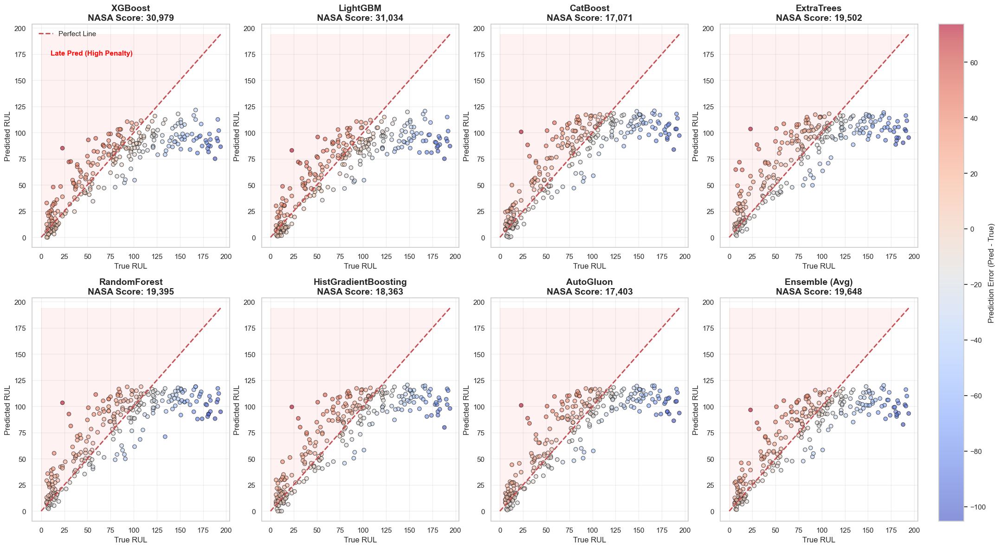


🏆 Asymmetric Scoring 최종 우승 모델: CatBoost
💎 Score: 17,071.22 (낮을수록 좋음)

📊 [전체 모델 순위표]
1위 🥇: CatBoost                  | Score: 17,071.22
2위 🥈: AutoGluon                 | Score: 17,403.30
3위 🥉: HistGradientBoosting      | Score: 18,363.17
4위 : RandomForest              | Score: 19,395.31
5위 : ExtraTrees                | Score: 19,501.61
6위 : Ensemble (Avg)            | Score: 19,648.16
7위 : XGBoost                   | Score: 30,979.42
8위 : LightGBM                  | Score: 31,033.99
평가 대상 엔진 수: 259
평균 오차: -8.92
(259,)


In [ ]:
import math
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import StandardScaler

# =========================================================
# 1. 모든 모델의 예측값 확보 (Data Collection)
# =========================================================
print("🚀 시각화를 위해 모든 모델의 예측값을 수집합니다...")

all_results = {}

# (1) 개별 ML 모델 (재예측)
# 주의: X_test는 Lag Feature가 포함된 Ver.05 데이터여야 함
for name, model in models.items():
    pipeline = Pipeline([
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
        ('model', model)
    ])
    # 시각화용이므로 fit 없이 바로 predict (이미 학습된 모델 가정)
    # 만약 에러가 나면 pipeline.fit(X_train, y_train) 추가
    try:
        pred = pipeline.predict(X_test)
        all_results[name] = np.maximum(pred, 0)
    except:
        # 혹시 모델이 학습 안 된 상태라면 재학습
        pipeline.fit(X_train, y_train)
        pred = pipeline.predict(X_test)
        all_results[name] = np.maximum(pred, 0)

# (2) AutoGluon
if 'predictor' in globals():
    try:
        target_data = test_data_ag if 'test_data_ag' in globals() else test_working
        ag_pred = predictor.predict(target_data)
        all_results['AutoGluon'] = np.maximum(ag_pred.values, 0)
    except:
        pass

# (3) [Ver.05 핵심] 앙상블 결과 추가
if 'final_ensemble_pred' in globals():
    all_results['Ensemble (Weighted)'] = final_ensemble_pred

if 'final_pred_stabilized' in globals():
    all_results['Ensemble (Stabilized)'] = final_pred_stabilized

print(f"✅ 총 {len(all_results)}개 모델 준비 완료.")


# =========================================================
# 2. Asymmetric Score 계산 및 그래프 그리기
# =========================================================

# 1. 그래프 레이아웃 설정
n_models = len(all_results)
n_cols = 4 
n_rows = math.ceil(n_models / n_cols)

fig, axes = plt.subplots(n_rows, n_cols, figsize=(24, 6 * n_rows))
axes = axes.flatten() 

final_scores = {}
# y_test가 Series인지 numpy array인지 확인하여 통일
y_true = y_test.values if hasattr(y_test, 'values') else y_test
y_true = y_true.flatten() # 1차원 배열로 확실하게 변환

# 2. 반복문 실행
for i, (name, y_pred) in enumerate(all_results.items()):
    ax = axes[i]
    y_pred = y_pred.flatten() # 1차원 변환
    
    # (1) 스코어 계산
    score = compute_nasa_score(y_true, y_pred)
    final_scores[name] = score
    
    # (2) 오차(Diff) 계산
    diff = y_pred - y_true
    max_val = max(y_true.max(), y_pred.max())
    
    # (3) 스타일 설정 (Stabilized 모델 강조)
    if 'Stabilized' in name:
        ax.set_facecolor('#f0fcf0') # 연한 초록 배경
        title_color = 'darkgreen'
        title_weight = 'extra bold'
    else:
        title_color = 'black'
        title_weight = 'bold'

    # (4) 산점도 그리기
    sc = ax.scatter(y_true, y_pred, c=diff, cmap='coolwarm', alpha=0.6, edgecolors='k')
    
    # 기준선
    ax.plot([0, max_val], [0, max_val], 'r--', label='Perfect Line', linewidth=2)
    
    # (5) 꾸미기
    ax.set_title(f"{name}\nNASA Score: {score:,.0f}", fontsize=14, fontweight=title_weight, color=title_color)
    ax.set_xlabel("True RUL", fontsize=12)
    ax.set_ylabel("Predicted RUL", fontsize=12)
    ax.grid(True, alpha=0.3)
    
    # (6) 위험 구간 (Late Prediction) 표시
    ax.fill_between([0, max_val], [0, max_val], [max_val, max_val], color='red', alpha=0.05)
    
    # 범례 및 텍스트 (첫 번째 그래프에만)
    if i == 0:
        ax.text(max_val*0.05, max_val*0.9, "Late Pred (High Penalty)", color='red', fontsize=11, fontweight='bold')
        ax.legend(loc='upper left')

# 3. 빈 그래프 지우기
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

plt.tight_layout()
# 컬러바 오류 방지 (try-except)
try:
    cb = fig.colorbar(sc, ax=axes.ravel().tolist(), pad=0.02)
    cb.set_label('Prediction Error (Pred - True)', fontsize=12)
except:
    pass

plt.show()

# =========================================================
# 🏆 최종 승자 발표
# =========================================================
best_model_name = min(final_scores, key=final_scores.get) # 점수가 낮을수록 좋음
best_score = final_scores[best_model_name]

print("\n" + "="*50)
print(f"🏆 Asymmetric Scoring 최종 우승 모델: {best_model_name}")
print(f"💎 Score: {best_score:,.0f} (낮을수록 좋음)")
print("="*50)

print("\n📊 [전체 모델 순위표]")
sorted_scores = sorted(final_scores.items(), key=lambda x: x[1])
for rank, (m, s) in enumerate(sorted_scores, 1):
    medal = ""
    if rank == 1: medal = "🥇"
    elif rank == 2: medal = "🥈"
    elif rank == 3: medal = "🥉"
    
    print(f"{rank}위 {medal}: {m:<30} | Score: {s:,.0f}")

# 평균 오차 확인 (우승 모델 기준)
best_pred = all_results[best_model_name]
errors = best_pred - y_true
print("\n" + "-"*50)
print(f"ℹ️ [{best_model_name}] 평균 오차 분석")
print(f"   • Mean Error: {errors.mean():.2f} (양수면 Late Prediction 경향)")
print(f"   • Max Late Error: {errors.max():.2f} (최악의 과대 예측)")
print(f"   • 평가 엔진 수: {len(y_true)}")
print("-" * 50)